In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

In [3]:
import display
import dataloader
from dataloader import ThermalData
import clustering
import anomaly_detection

In [4]:
import module_extraction
from module_extraction import Filters, Modules

In [5]:
thermal_npdat_path = "../ModuleExtraction/hokuto/thermal"
input_img_path = '../ModuleExtraction/hokuto/thermal/DJI_0123_R.JPG'

画像データの取得

In [6]:
thermal_img_files = dataloader.get_img_files(dir_path="./images/modules",gray=False)
thermal_img_files_gray = dataloader.get_img_files(dir_path="./images/modules",gray=True)

In [7]:
type(thermal_img_files), len(thermal_img_files)

(dict, 158)

各モジュールの位置情報を取得

In [8]:
filters = Filters(thermal_npdat_path)
img_org = cv2.imread(input_img_path, 0)
img_filtered = filters.apply_all_filters(img_org)

In [9]:
modules = Modules(img_filtered)
img_con = modules.get_img_contours(img_org, index=True)

/Users/tnozawa/afterFIT/work/rule_based_anomaly_detection/module_extraction.py:58: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


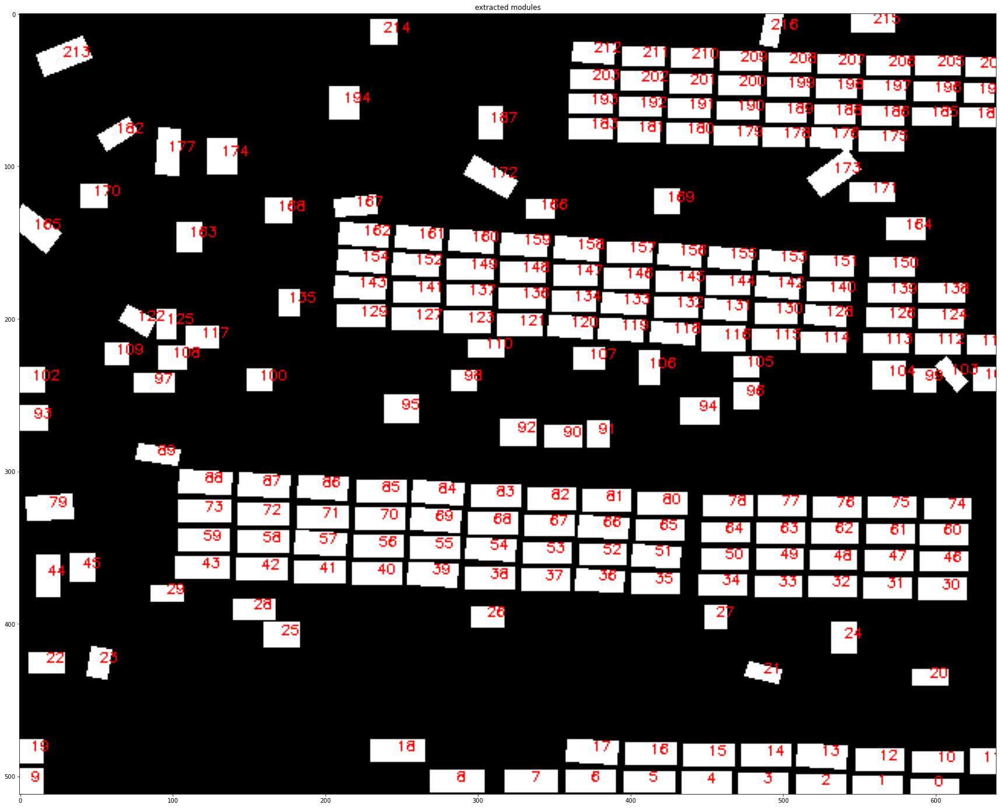

In [10]:
module_extraction.show_img({"extracted modules":img_con},cmap="gray",figsize=(30,30))

In [11]:
module_indices = list(map(lambda x: np.int(x.split(".")[0]), thermal_img_files.keys()))
module_contours = [modules.panel_contours[idx] for idx in module_indices]
module_labels = modules.get_string_anomaly_labels(module_contours)

(512.0, 0.0)

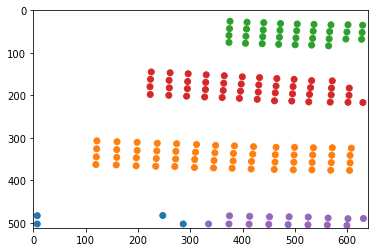

In [12]:
fig, ax = plt.subplots(facecolor="w")
cmap = plt.get_cmap("tab10")
module_centers = np.array( [c.mean(axis=0) for c in module_contours] )
plt.scatter(module_centers[:, 0], module_centers[:, 1], color=cmap(module_labels+1))
ax.set_xlim([0, img_con.shape[1]])
ax.set_ylim([img_con.shape[0], 0])

温度データの取得

In [13]:
#data = ThermalData(thermal_img_files)

In [14]:
data = {}
for c in range(-1,max(module_labels)+1):
    indices = np.where(module_labels==c)
    target_thermal_img_files = pd.Series(thermal_img_files).iloc[indices]
    data[c] = ThermalData(target_thermal_img_files)

温度分布の確認（個別）

温度分布の確認

In [15]:
#display.display_distributions(data.all_temperature, 
#                              filepath = "hist_all_temperature.jpg")

In [16]:
#display.display_distributions(data.scaled_all_temperature,
#                              filepath = "hist_scaled_all_temperature.jpg")

module label: -1


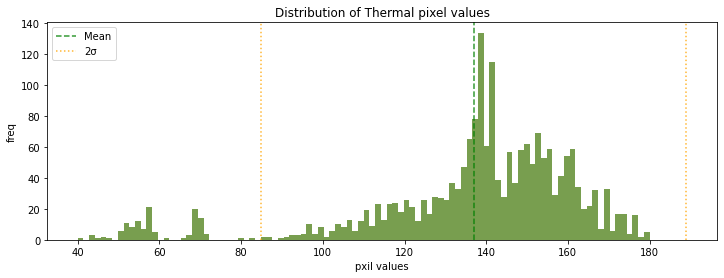

module label: 0


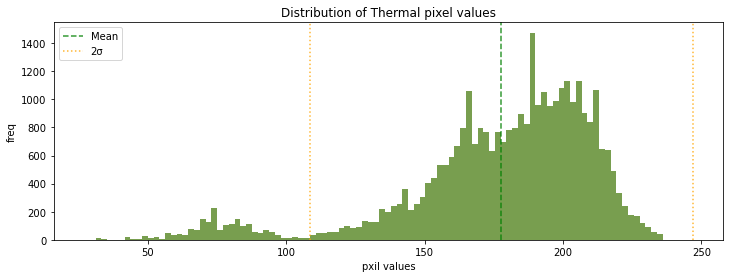

module label: 1


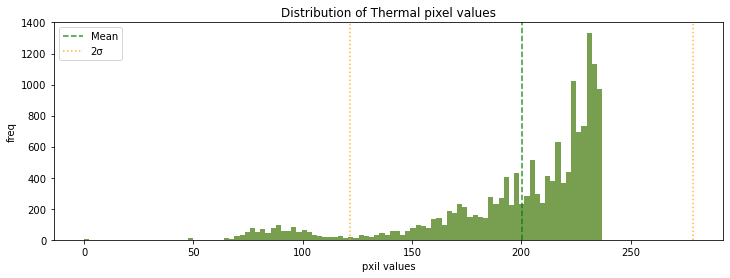

module label: 2


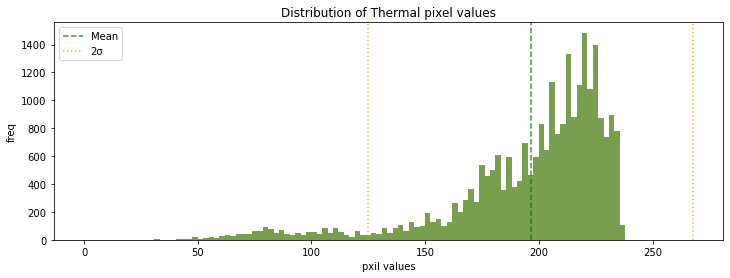

module label: 3


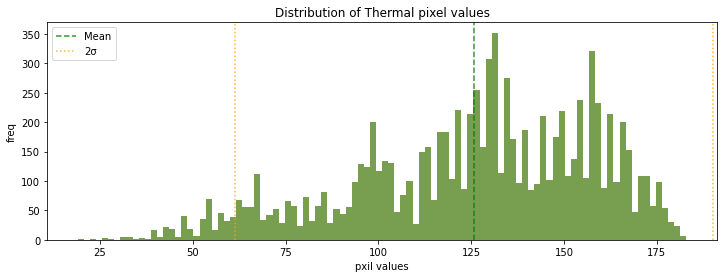

In [17]:
for k, v in data.items():
    print("module label:",k)
    display.display_distributions(v.all_temperature, 
                              filepath = "hist_all_temperature.jpg")

module label: -1


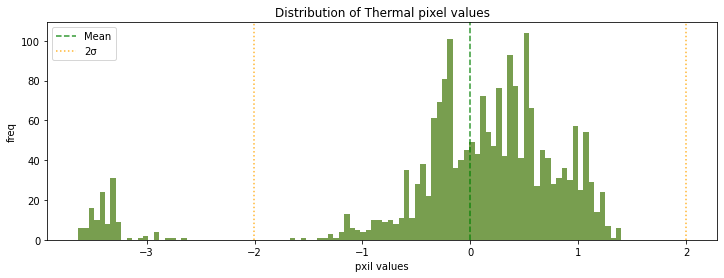

module label: 0


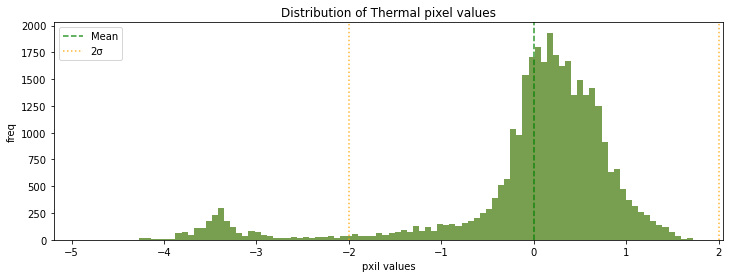

module label: 1


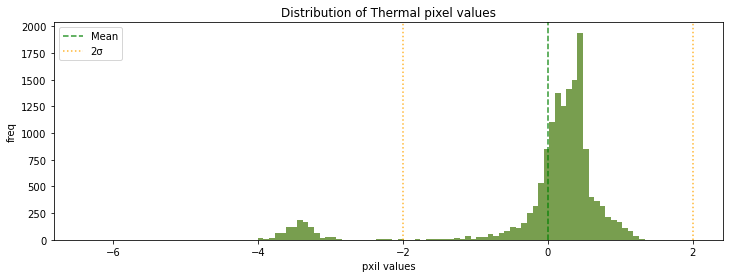

module label: 2


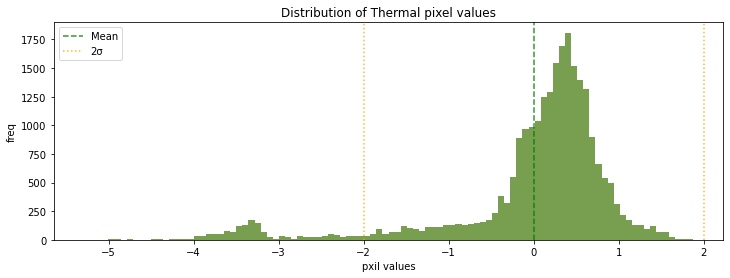

module label: 3


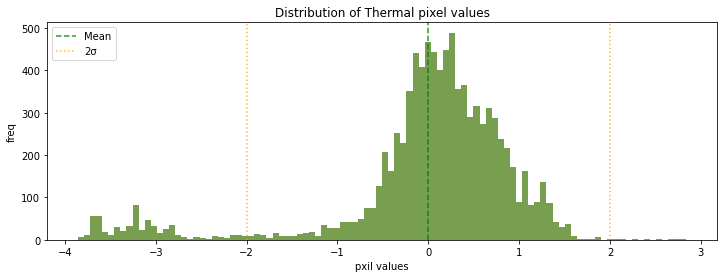

In [18]:
for k, v in data.items():
    print("module label:",k)
    display.display_distributions(v.scaled_all_temperature, 
                              filepath = "hist_scaled_all_temperature.jpg")

クラスタ分類モデルの作成

In [19]:
#gmm1 = anomaly_detection.AnoGMM(data.all_temperature)
#gmm2 = anomaly_detection.AnoGMM(data.scaled_all_temperature)

In [20]:
#gmm1.display()

In [21]:
#gmm2.display()

module label: -1


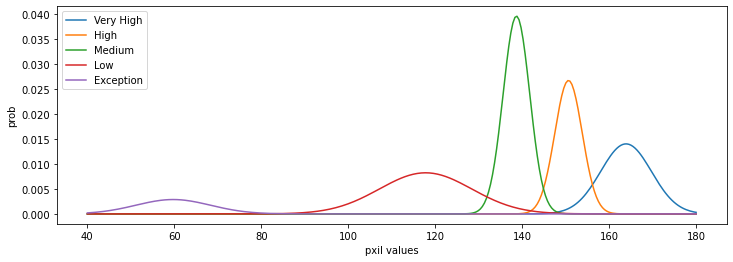

module label: 0


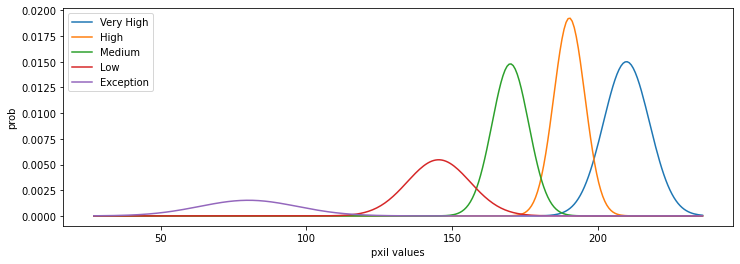

module label: 1


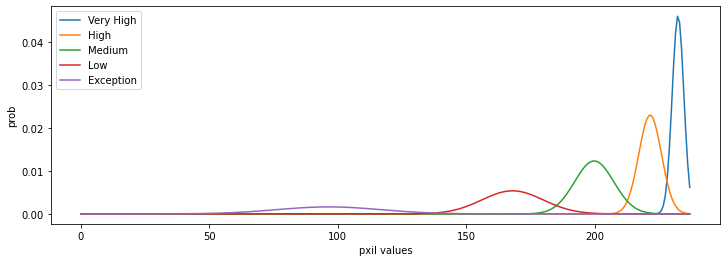

module label: 2


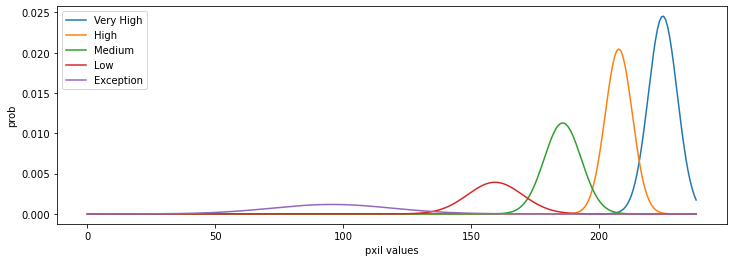

module label: 3


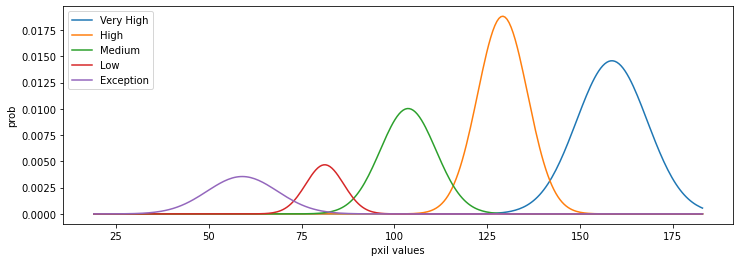

In [22]:
gmm = {}
for k, v in data.items():
    print("module label:",k)
    gmm[k] = anomaly_detection.AnoGMM(v.all_temperature)
    gmm[k].display()

module label: -1


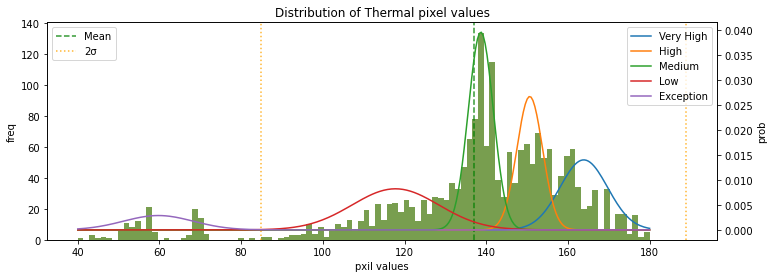

module label: 0


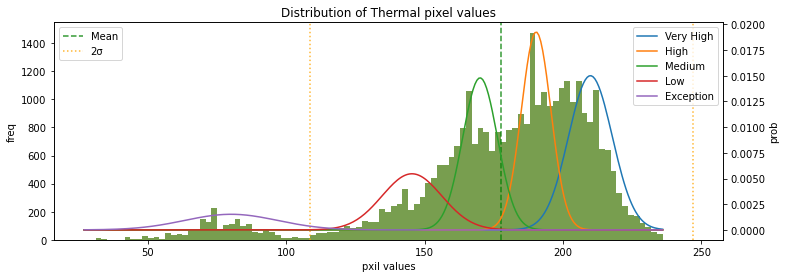

module label: 1


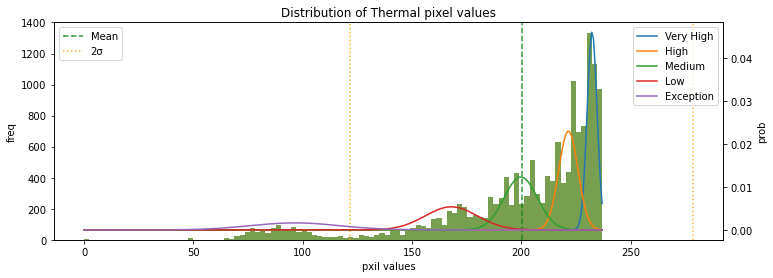

module label: 2


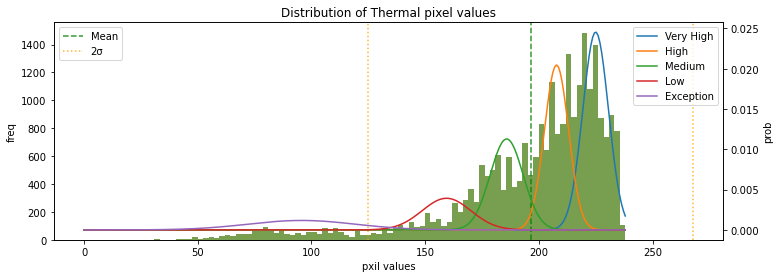

module label: 3


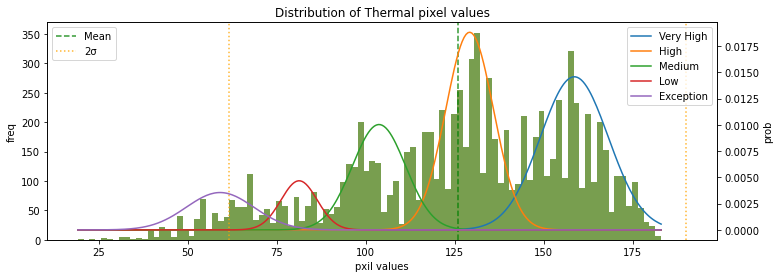

In [23]:
for k, v in data.items():
    print("module label:",k)
    display.display_distributions(v.all_temperature, 
                              filepath = "hist_all_temperature.jpg",gmm=gmm[k])

異常タイプの確認テスト

In [24]:
def get_module_anomaly_type(temperature, gmm, img_file, log=False):
    # -- hot cluster --
    predicted_classes = gmm.predict(temperature)
    cluster_types = np.array([gmm.index2class[c] for c in predicted_classes ])
    hot_clusters = (cluster_types == "Very High")
    # -- hot pixcel --
    hot_pixels = np.array([ gmm.index2class[c] =="Very High" for c in predicted_classes[clusters.labels] ])
    hot_pixels = hot_pixels.reshape(*img_file.shape[:2],1)  
    # -- module type --
    module_type = anomaly_detection.detect_module_type(hot_clusters, hot_pixels)
    if log:
        print("Module type:", module_type)
        print("Cluster types:",cluster_types)
        print("Hotspot weights:",hot_pixels.mean())
    return module_type, hot_pixels, cluster_types

In [25]:
anomaly_modules= {}
clustering_method="kmeans"
#clustering_method="xmeans" # not stable
#clustering_method="dbscan"

******* start *******
Module type1: Normal


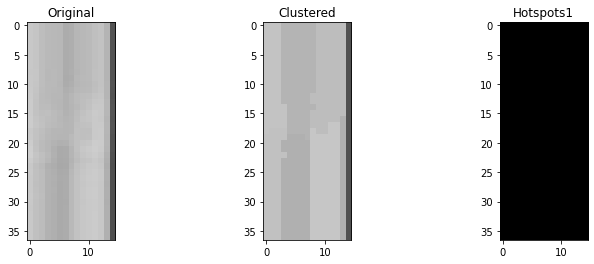

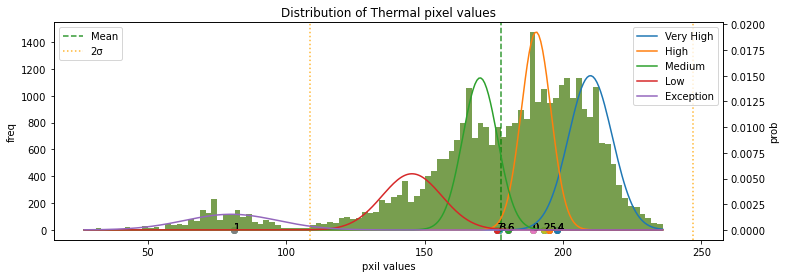

******* end *******
******* start *******
Module type1: Multi-Hotspots


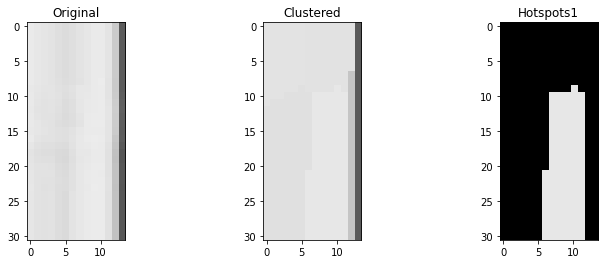

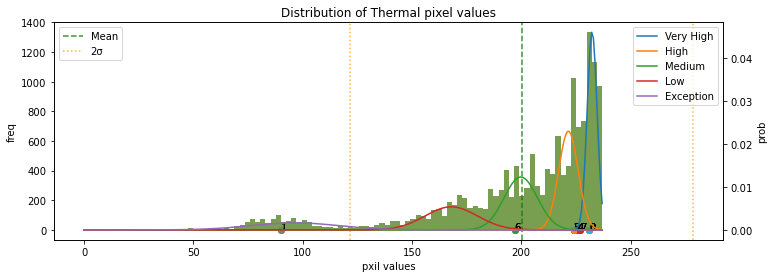

******* end *******
******* start *******
Module type1: Normal


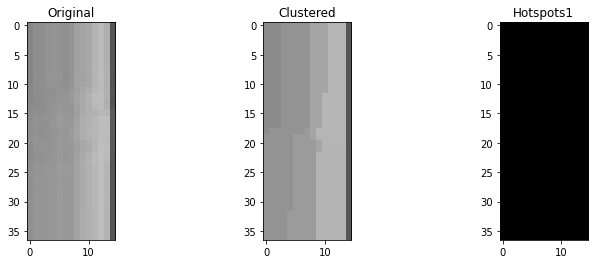

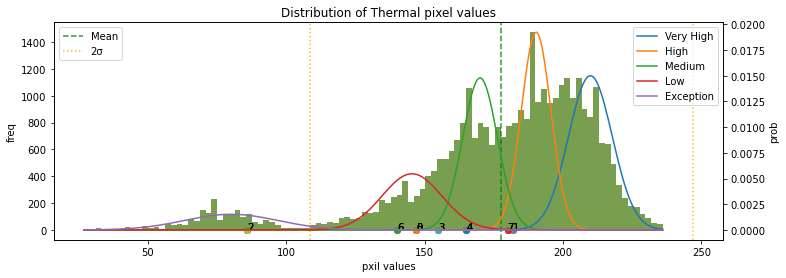

******* end *******
******* start *******
Module type1: Normal


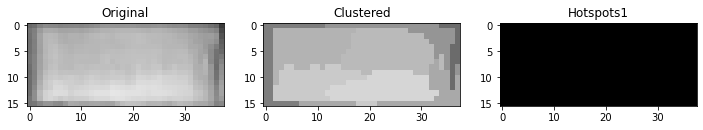

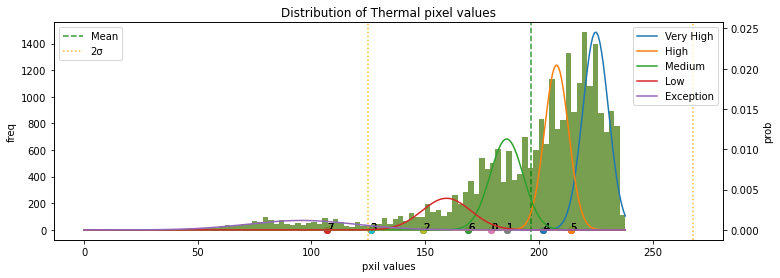

******* end *******
******* start *******
Module type1: Normal


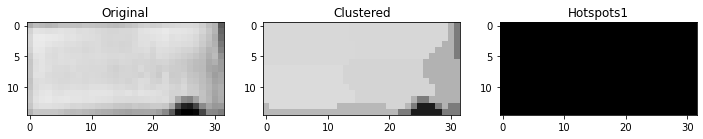

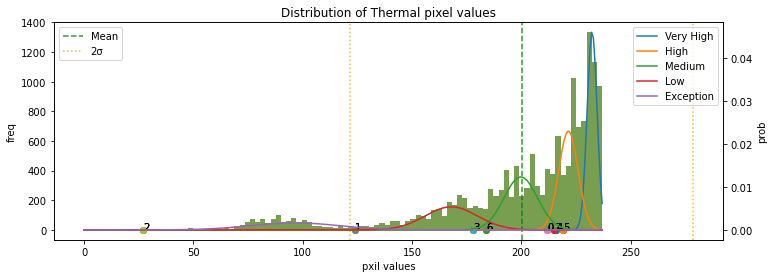

******* end *******
******* start *******
Module type1: Normal


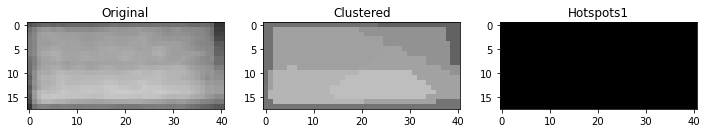

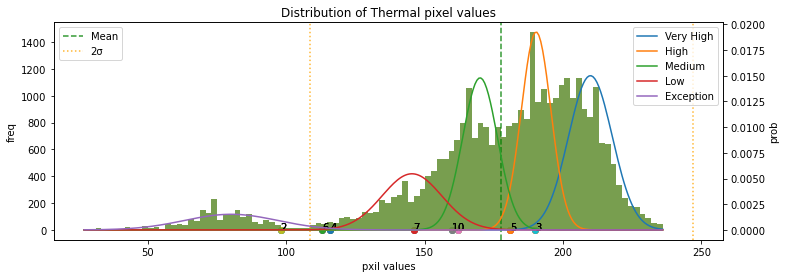

******* end *******
******* start *******
Module type1: Multi-Hotspots


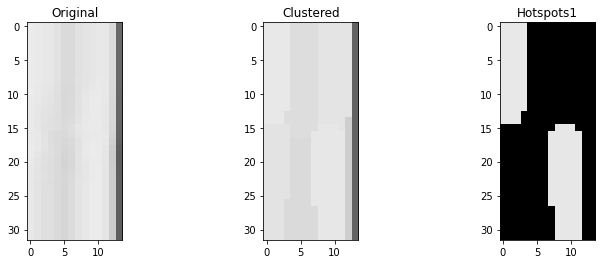

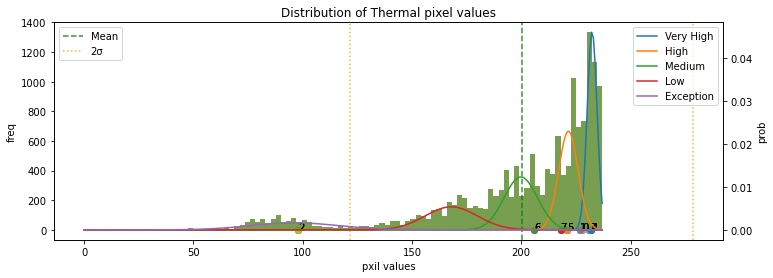

******* end *******
******* start *******
Module type1: Cluster-Anomaly


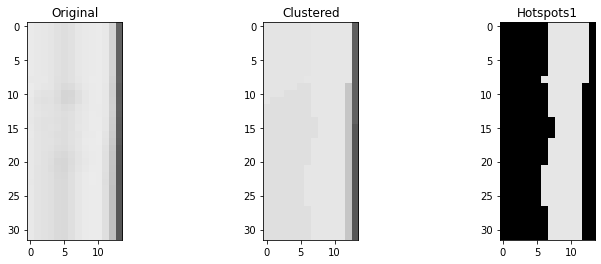

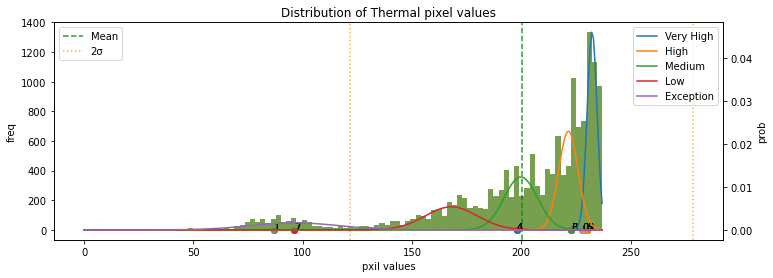

******* end *******
******* start *******
Module type1: Normal


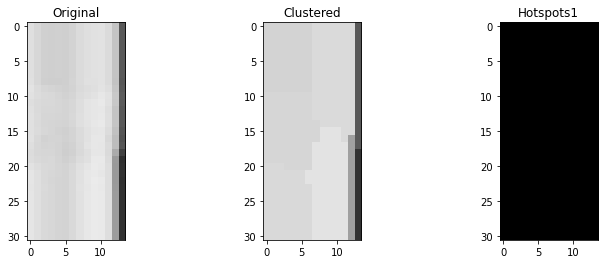

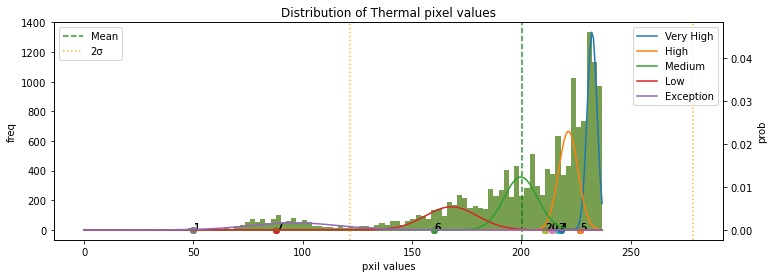

******* end *******
******* start *******
Module type1: Normal


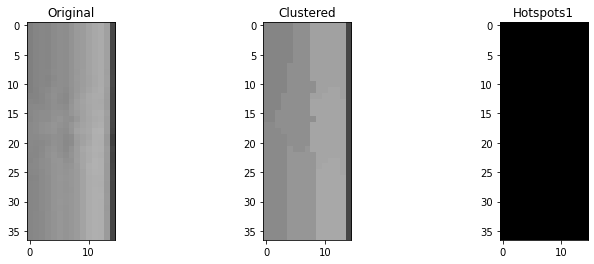

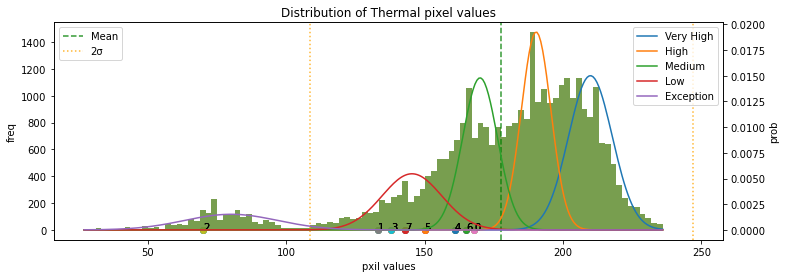

******* end *******
******* start *******
Module type1: Normal


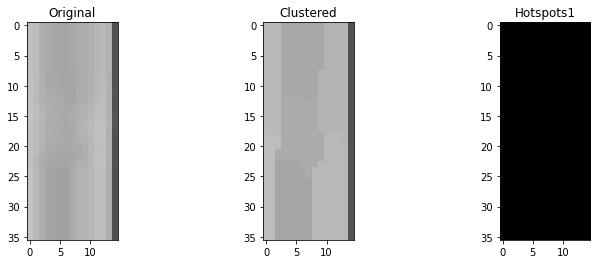

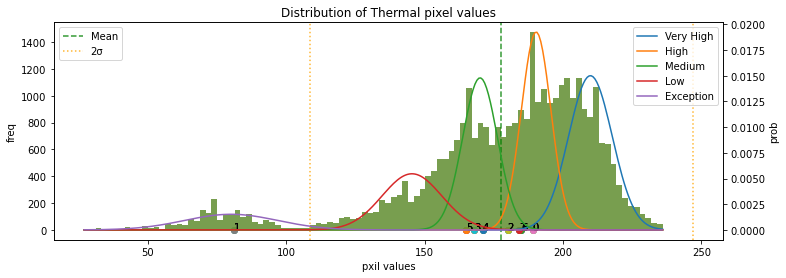

******* end *******
******* start *******
Module type1: Normal


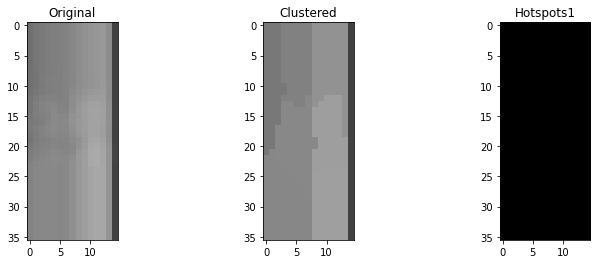

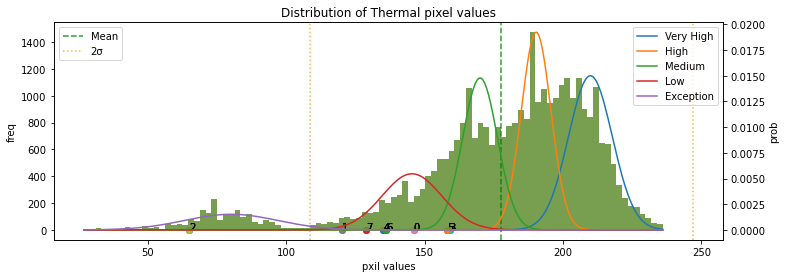

******* end *******
******* start *******
Module type1: Normal


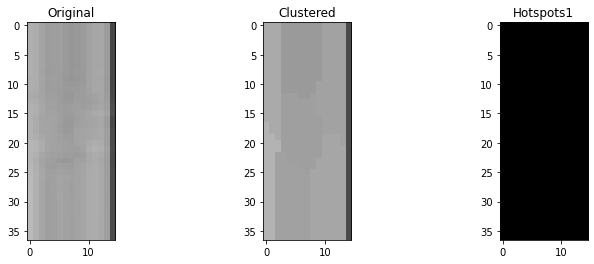

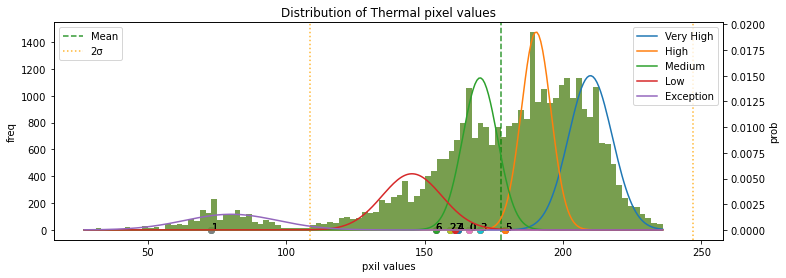

******* end *******
******* start *******
Module type1: Normal


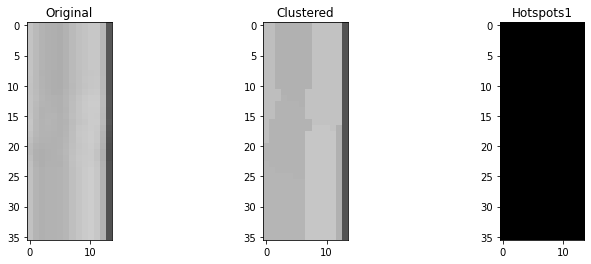

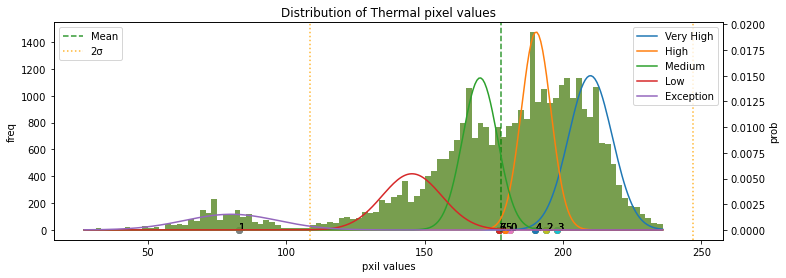

******* end *******
******* start *******
Module type1: Cluster-Anomaly


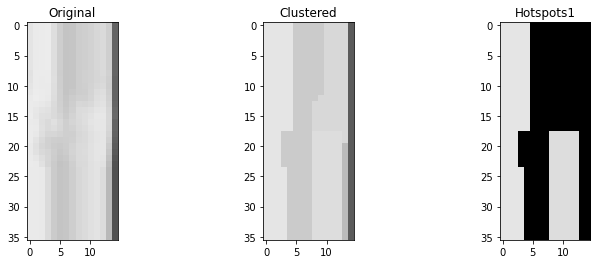

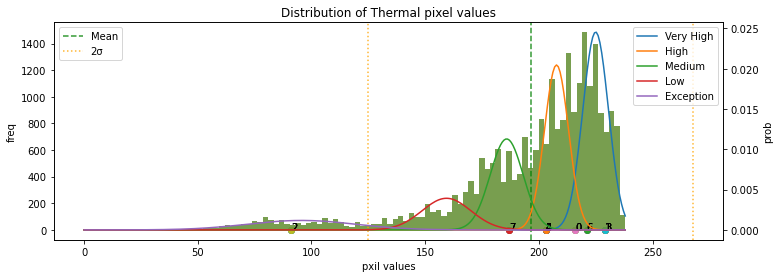

******* end *******
******* start *******
Module type1: Normal


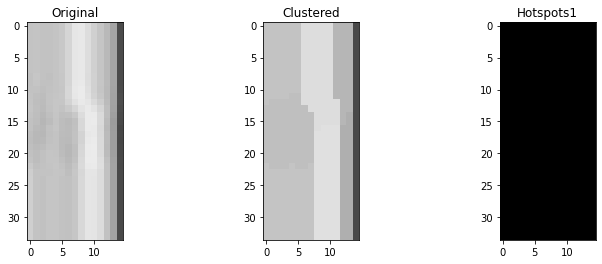

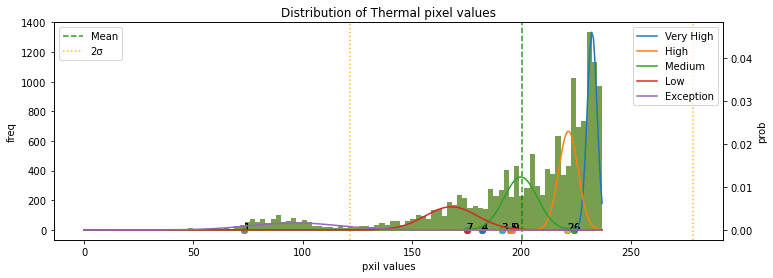

******* end *******
******* start *******
Module type1: Normal


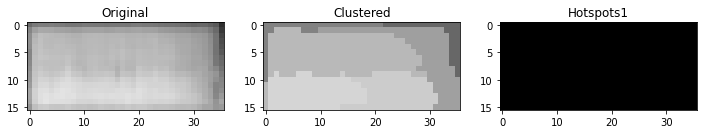

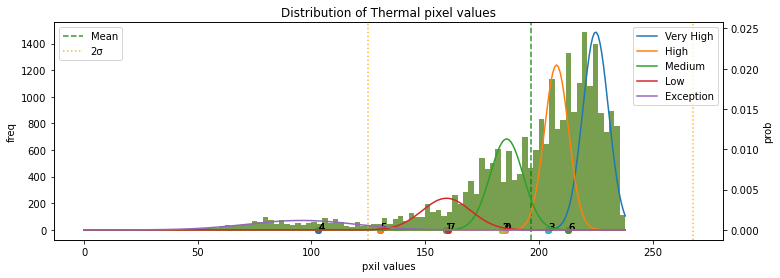

******* end *******
******* start *******
Module type1: Cluster-Anomaly


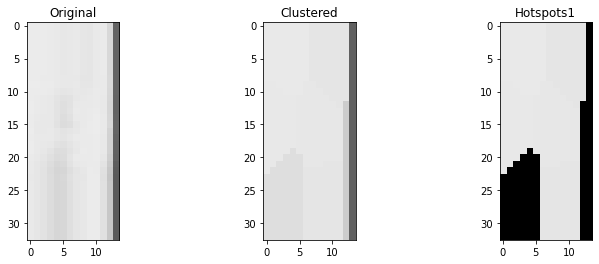

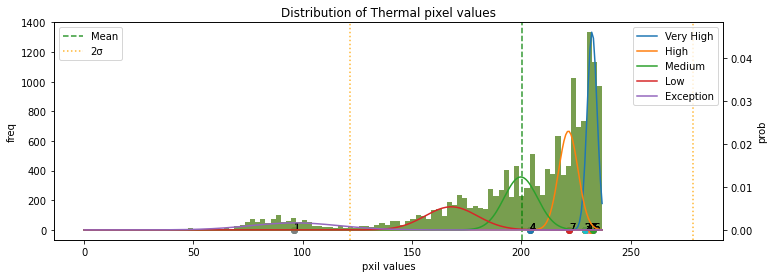

******* end *******
******* start *******
Module type1: Multi-Hotspots


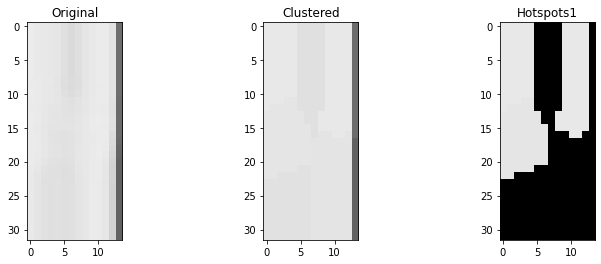

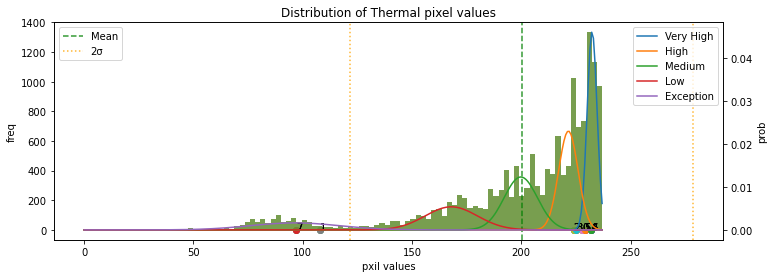

******* end *******
******* start *******
Module type1: Single-Hotspot


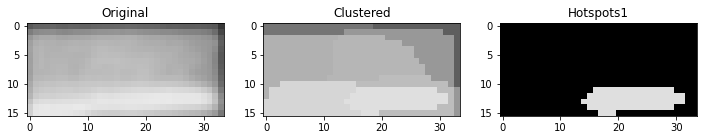

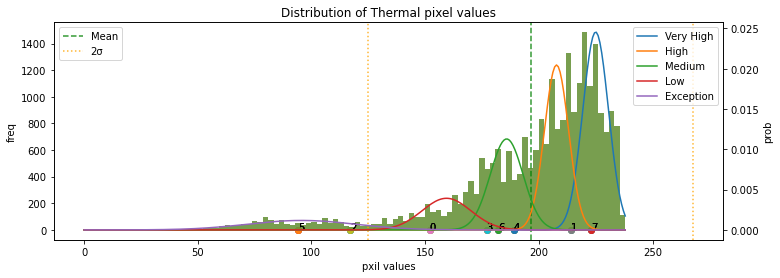

******* end *******
******* start *******
Module type1: Cluster-Anomaly


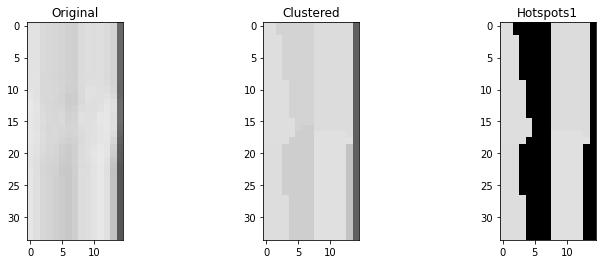

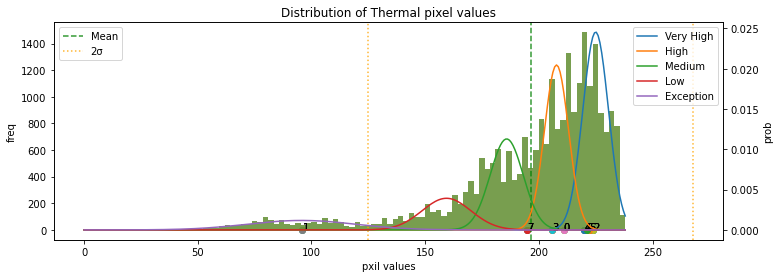

******* end *******
******* start *******
Module type1: Cluster-Anomaly


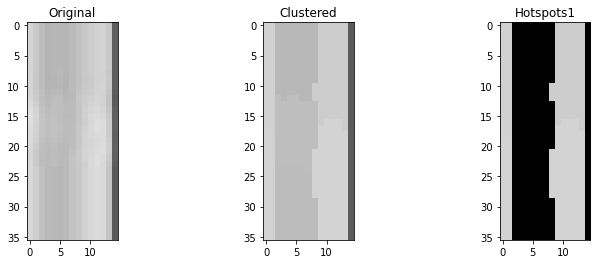

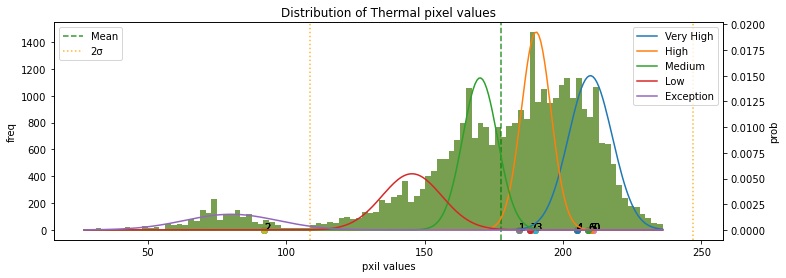

******* end *******
******* start *******
Module type1: Normal


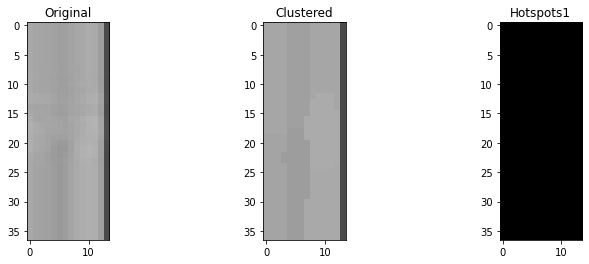

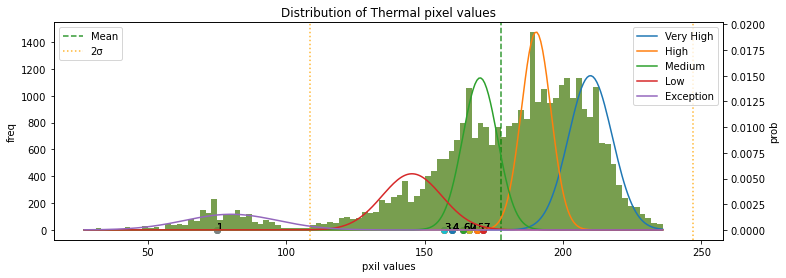

******* end *******
******* start *******
Module type1: Normal


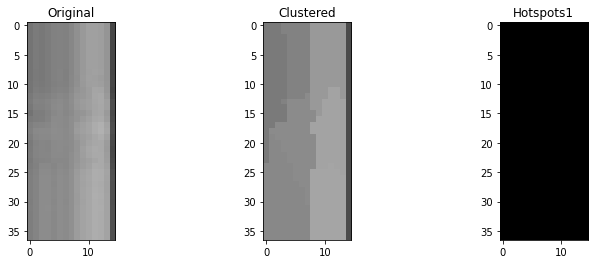

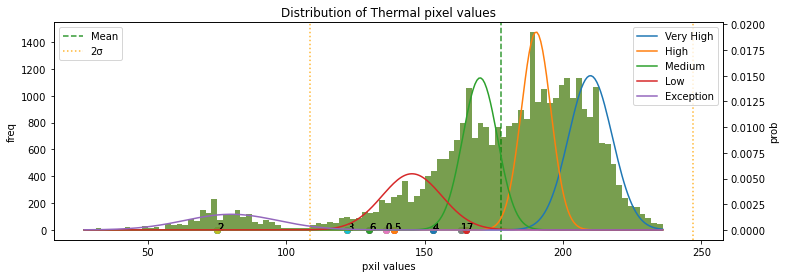

******* end *******
******* start *******
Module type1: Cluster-Anomaly


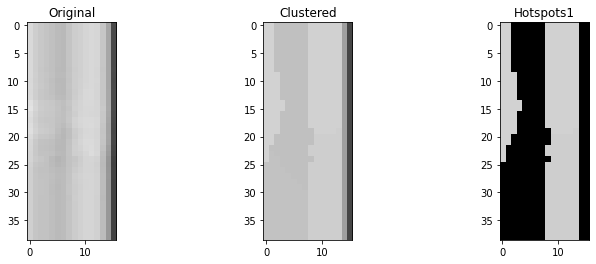

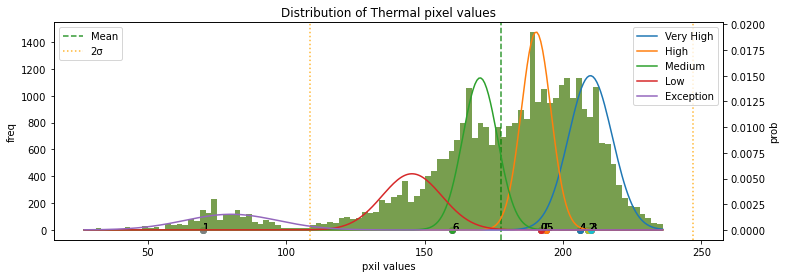

******* end *******
******* start *******
Module type1: Cluster-Anomaly


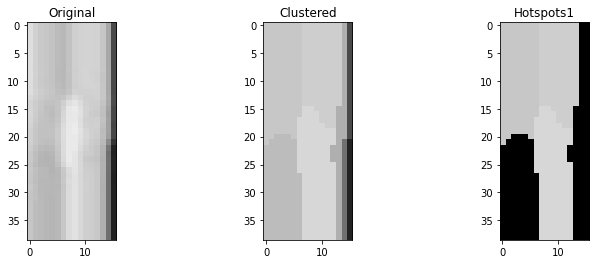

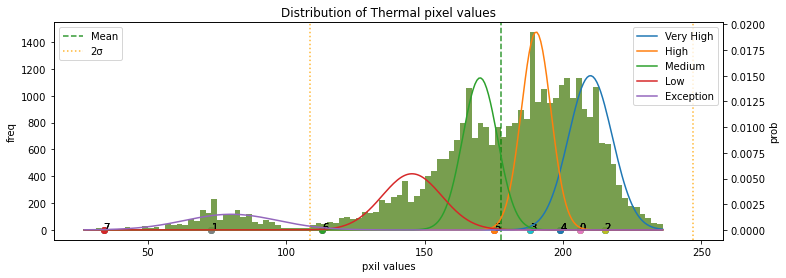

******* end *******
******* start *******
Module type1: Normal


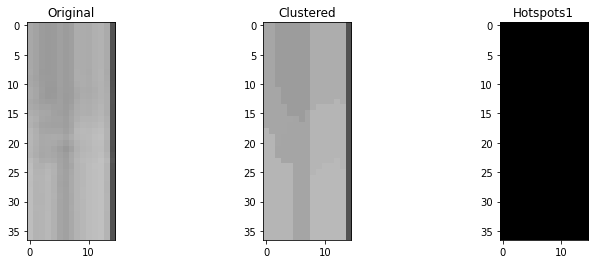

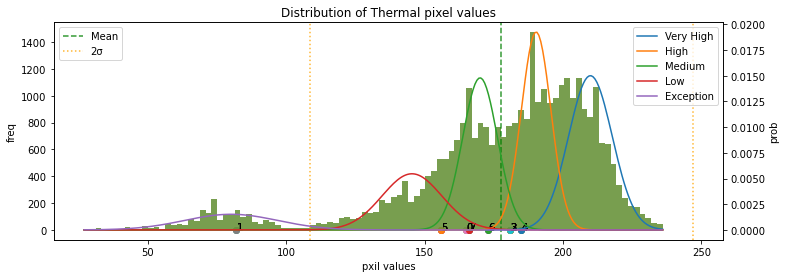

******* end *******
******* start *******
Module type1: Normal


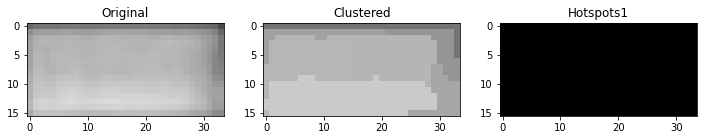

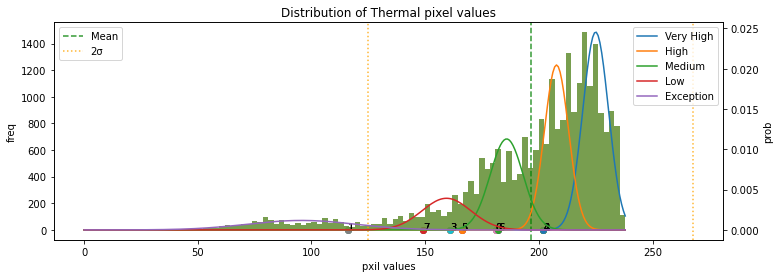

******* end *******
******* start *******
Module type1: Normal


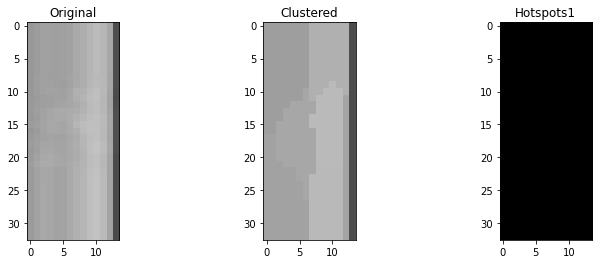

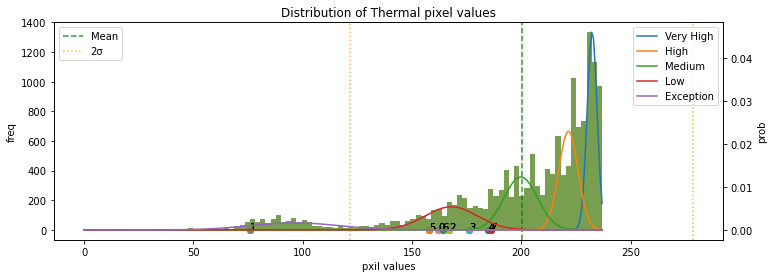

******* end *******
******* start *******
Module type1: Single-Hotspot


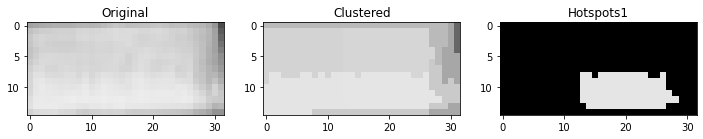

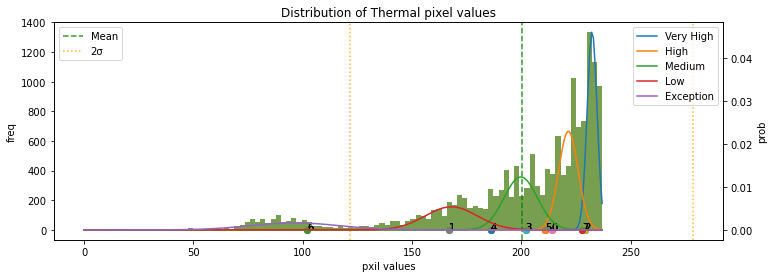

******* end *******
******* start *******
Module type1: Normal


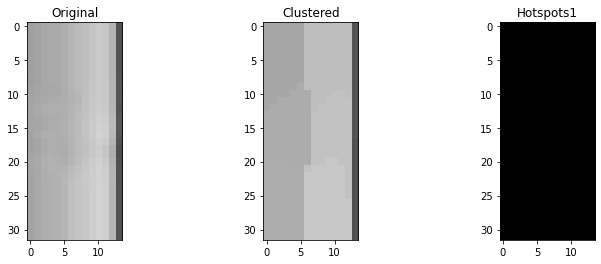

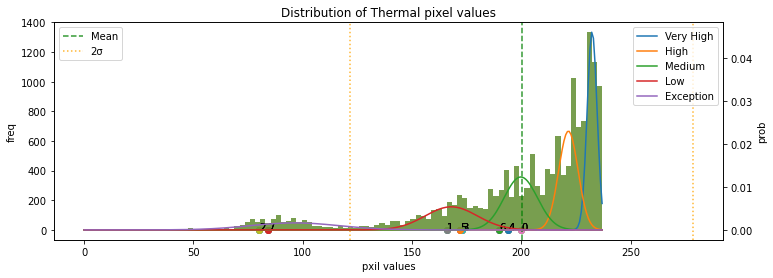

******* end *******
******* start *******
Module type1: Normal


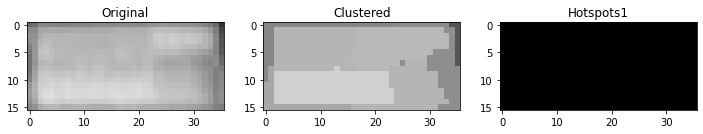

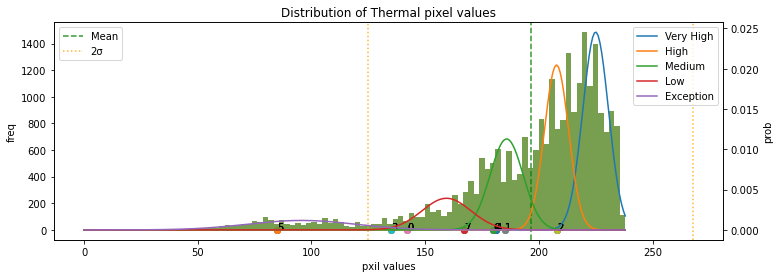

******* end *******
******* start *******
Module type1: Normal


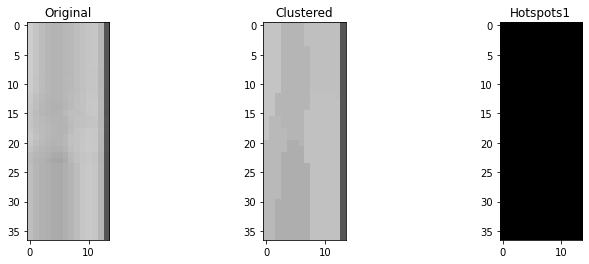

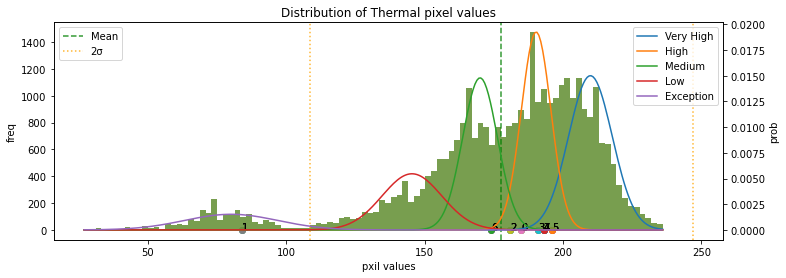

******* end *******
******* start *******
Module type1: Cluster-Anomaly


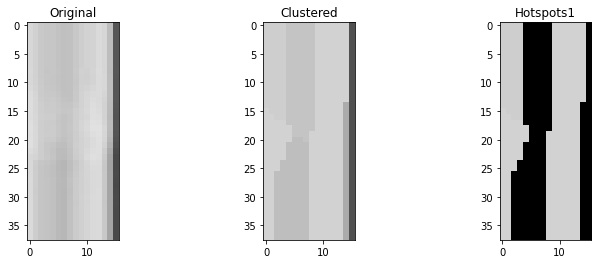

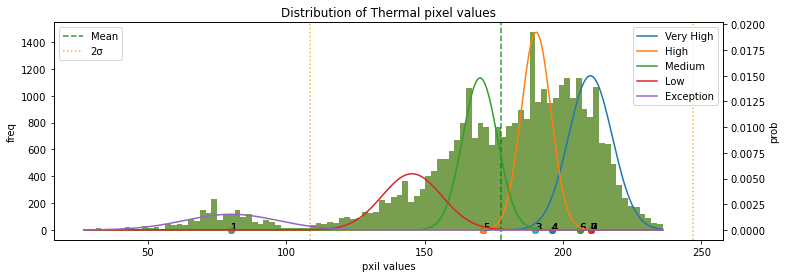

******* end *******
******* start *******
Module type1: Cluster-Anomaly


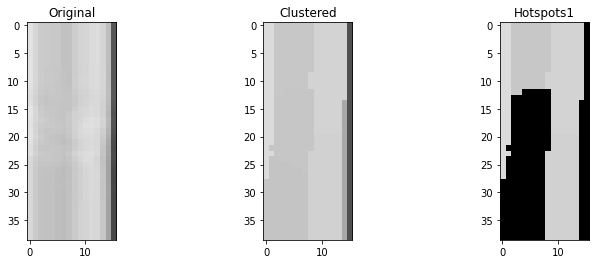

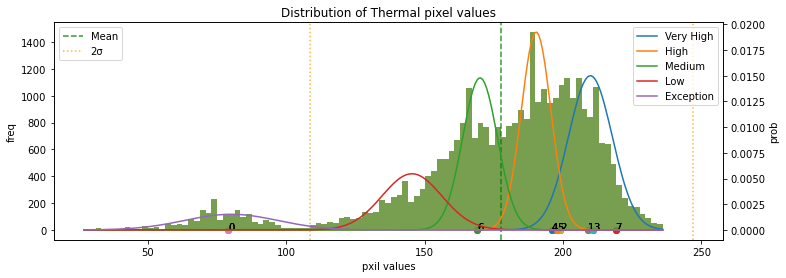

******* end *******
******* start *******
Module type1: Multi-Hotspots


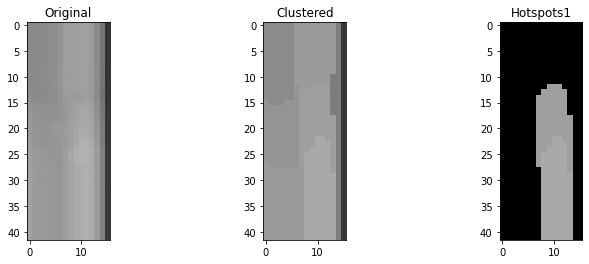

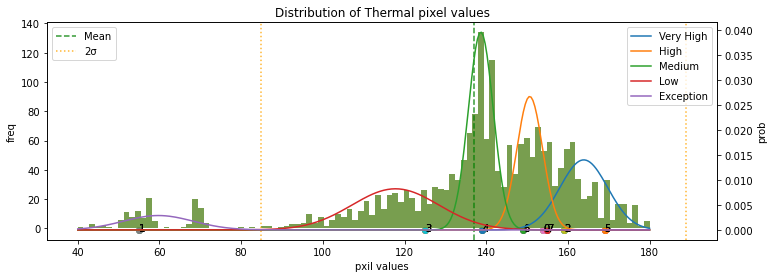

******* end *******
******* start *******
Module type1: Normal


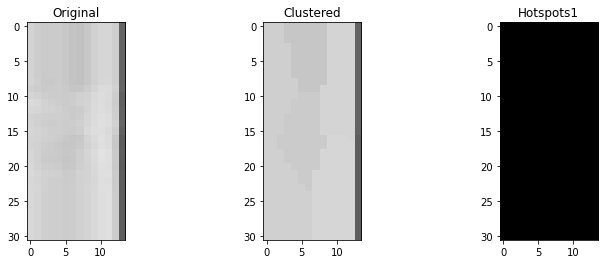

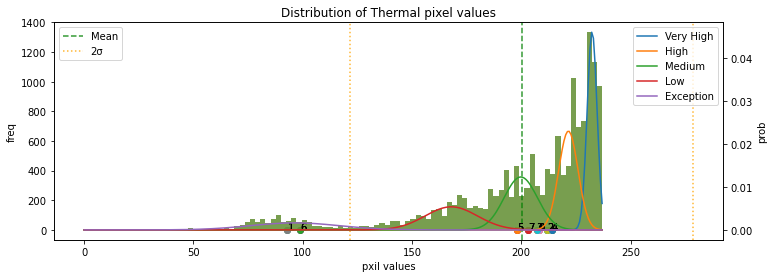

******* end *******
******* start *******
Module type1: Single-Hotspot


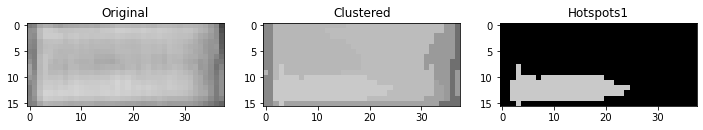

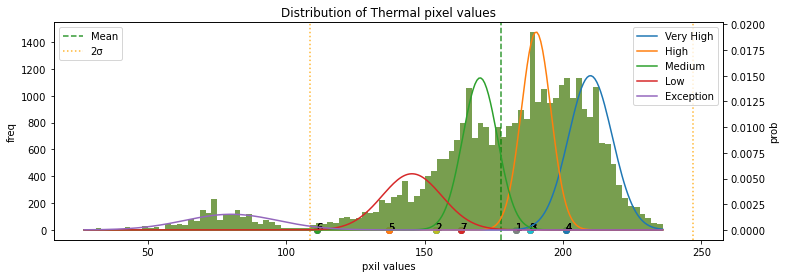

******* end *******
******* start *******
Module type1: Single-Hotspot


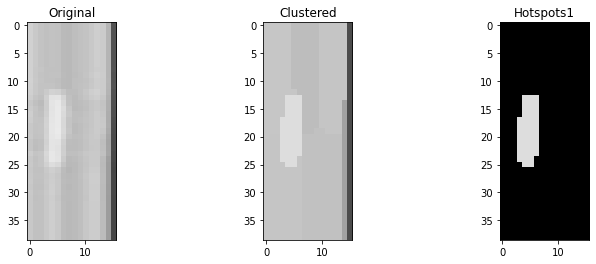

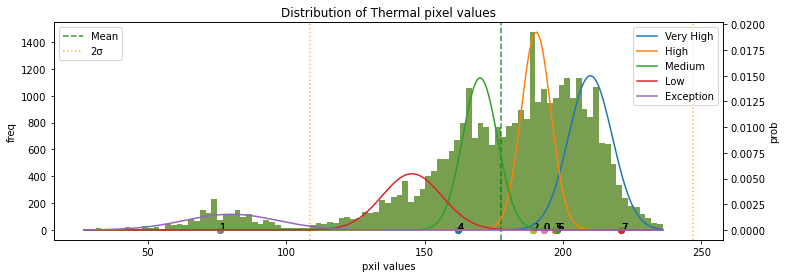

******* end *******
******* start *******
Module type1: Normal


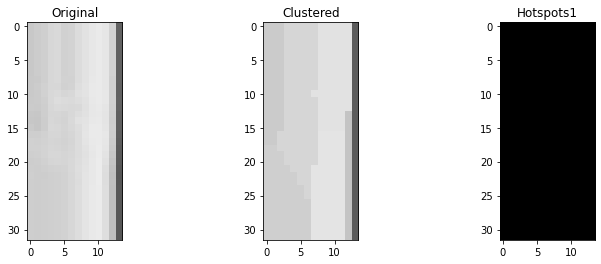

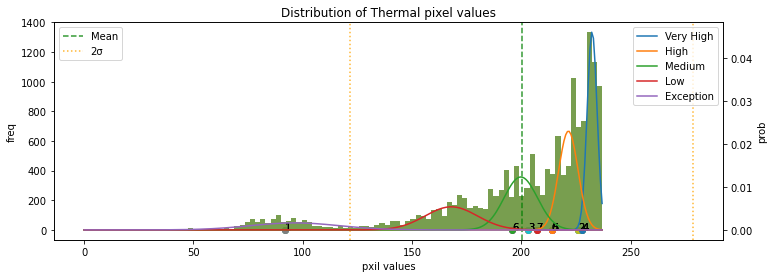

******* end *******
******* start *******
Module type1: Normal


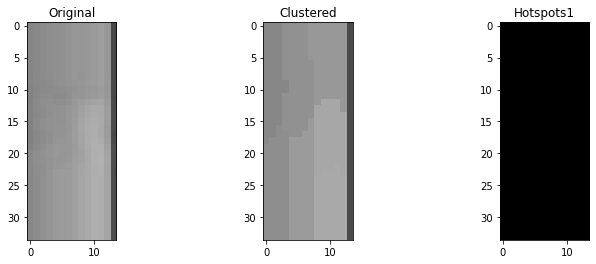

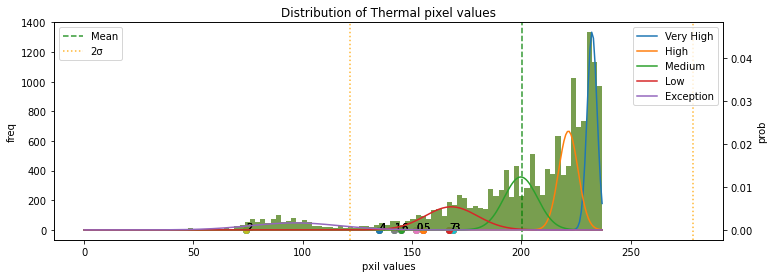

******* end *******
******* start *******
Module type1: Normal


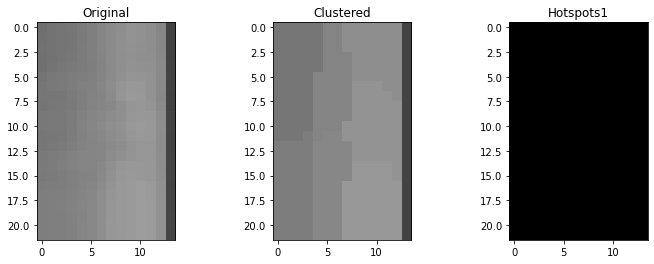

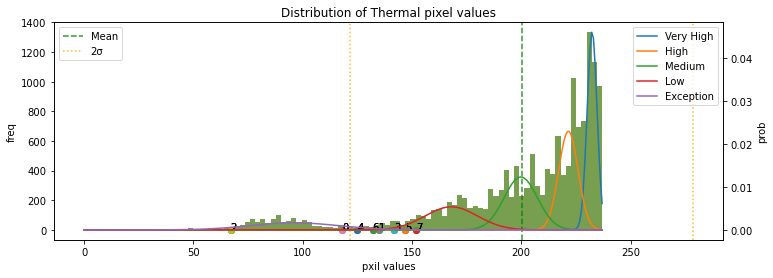

******* end *******
******* start *******
Module type1: Normal


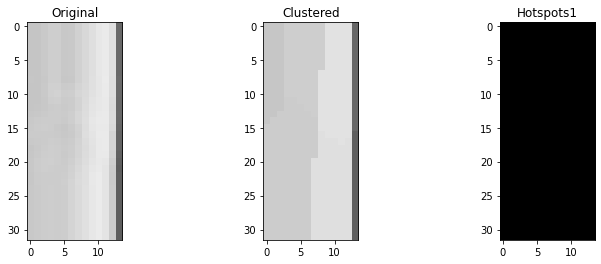

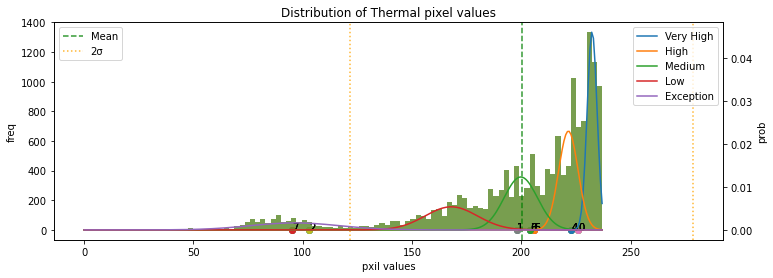

******* end *******
******* start *******
Module type1: Single-Hotspot


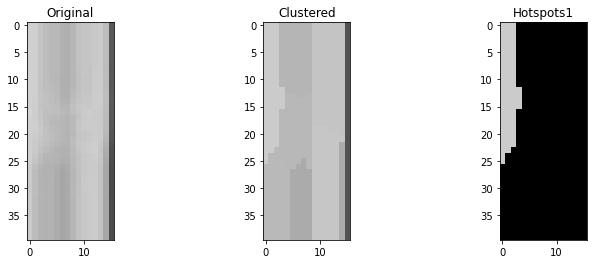

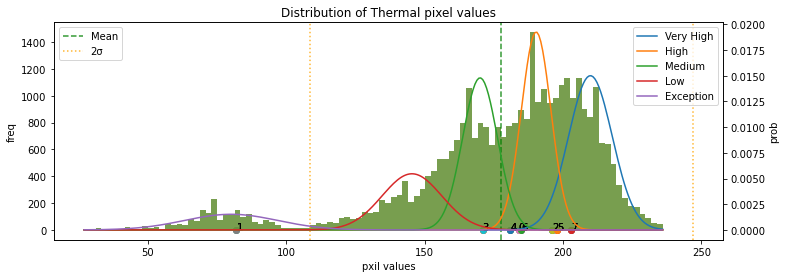

******* end *******
******* start *******
Module type1: Normal


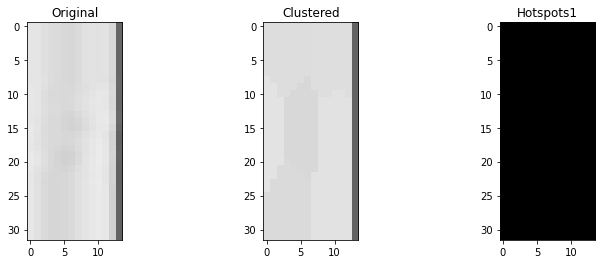

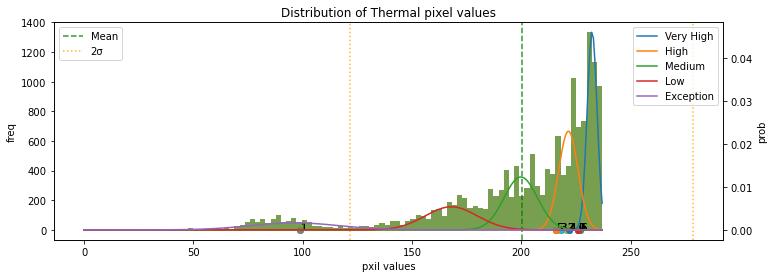

******* end *******
******* start *******
Module type1: Cluster-Anomaly


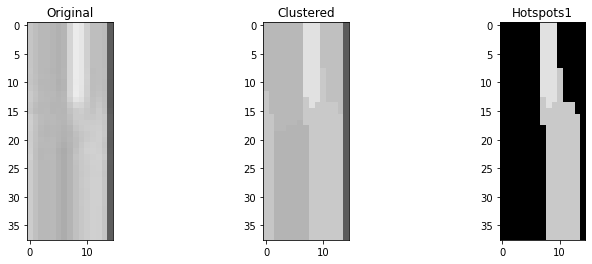

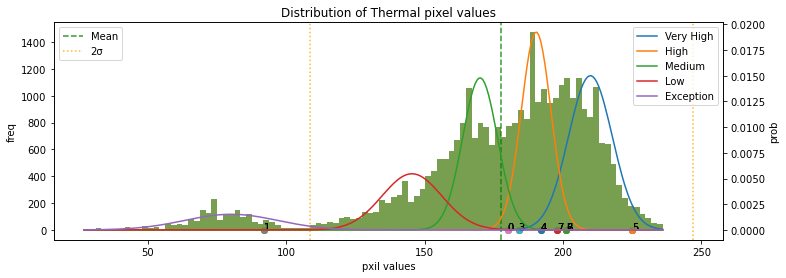

******* end *******
******* start *******
Module type1: Normal


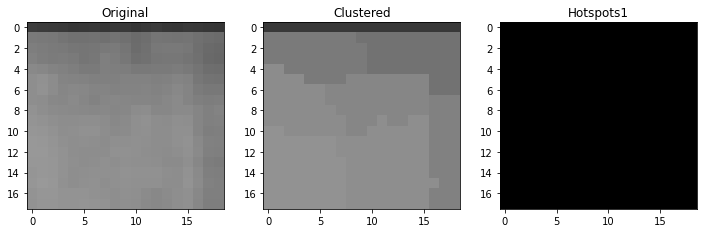

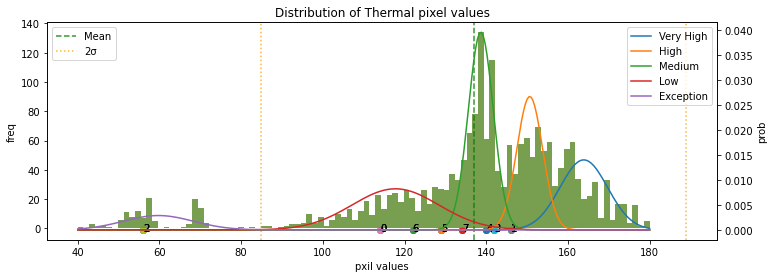

******* end *******
******* start *******
Module type1: Single-Hotspot


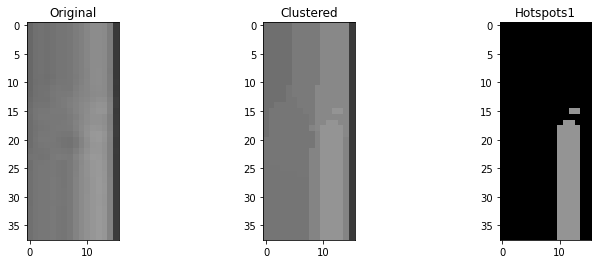

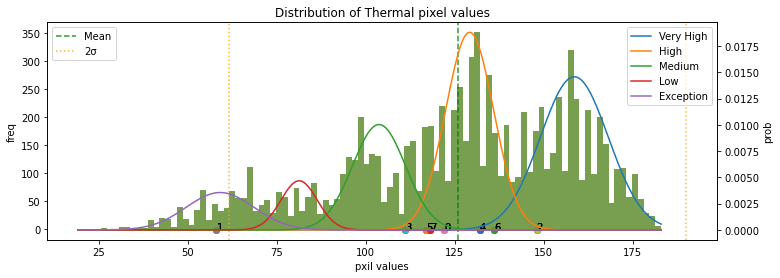

******* end *******
******* start *******
Module type1: Module-Anomaly


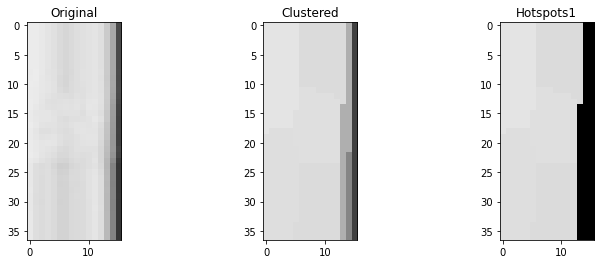

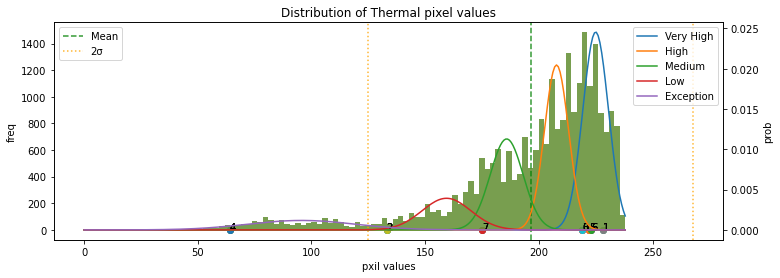

******* end *******
******* start *******
Module type1: Cluster-Anomaly


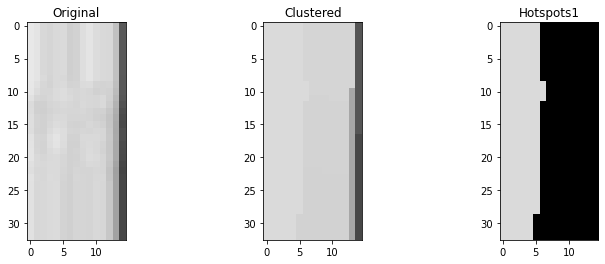

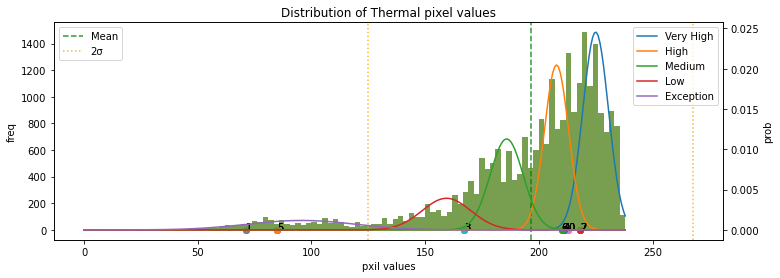

******* end *******
******* start *******
Module type1: Normal


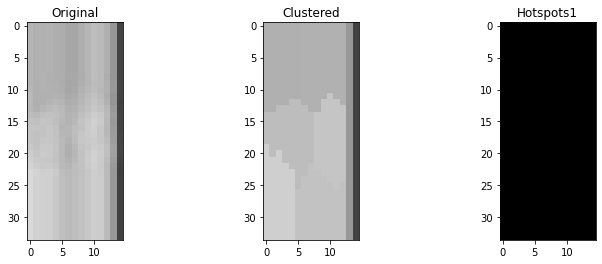

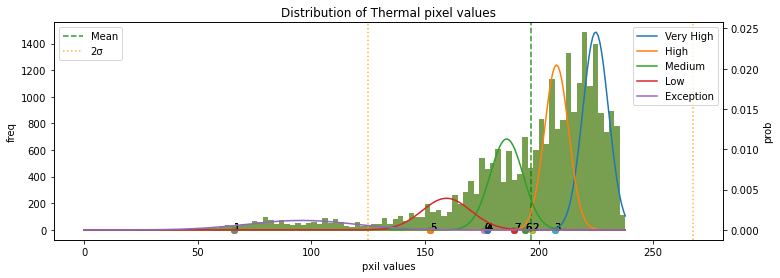

******* end *******
******* start *******
Module type1: Normal


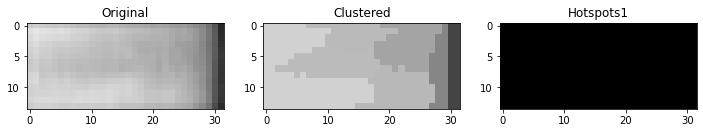

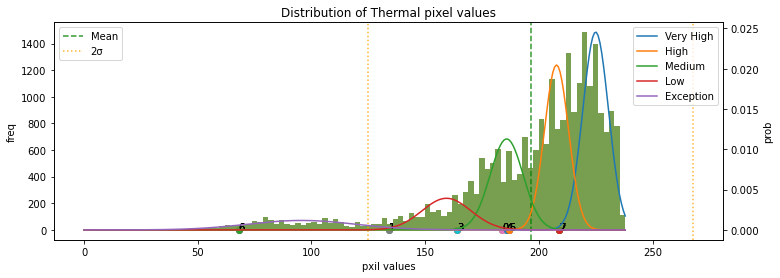

******* end *******
******* start *******
Module type1: Multi-Hotspots


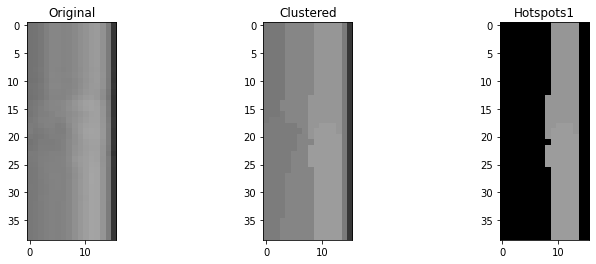

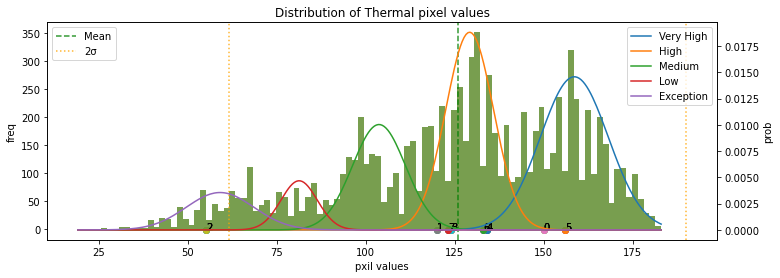

******* end *******
******* start *******
Module type1: Multi-Hotspots


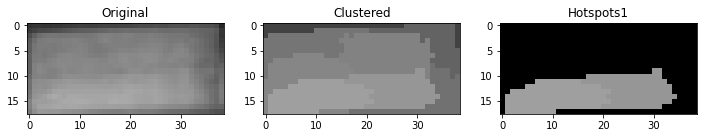

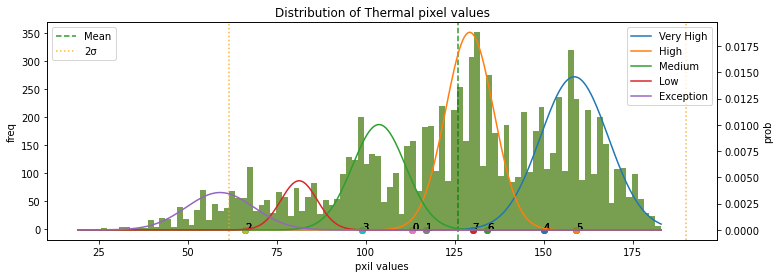

******* end *******
******* start *******
Module type1: Cluster-Anomaly


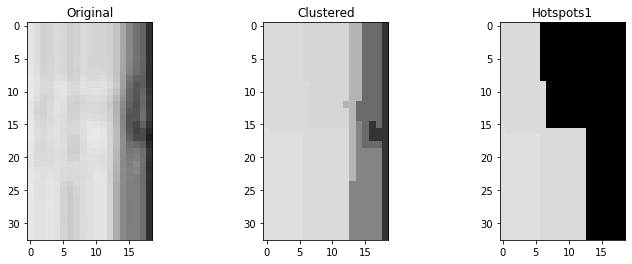

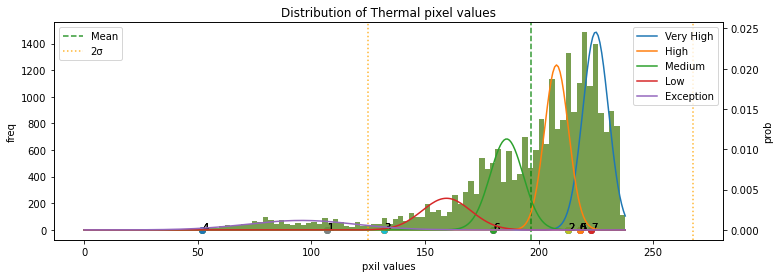

******* end *******
******* start *******
Module type1: Cluster-Anomaly


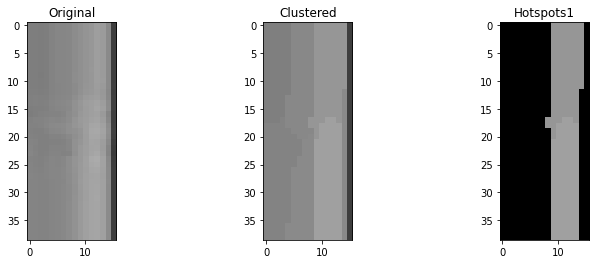

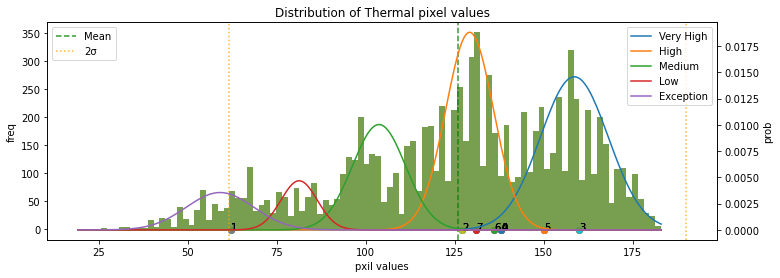

******* end *******
******* start *******
Module type1: Normal


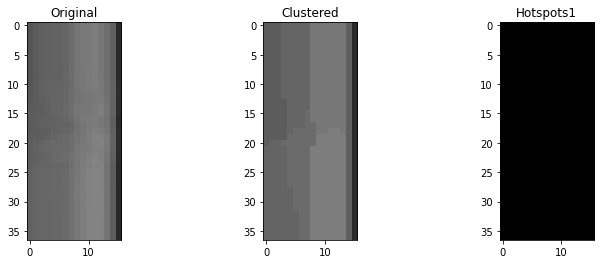

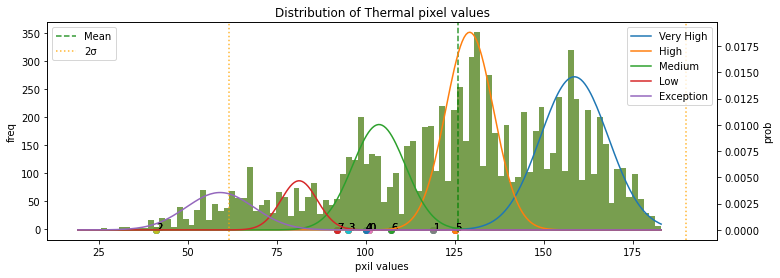

******* end *******
******* start *******
Module type1: Multi-Hotspots


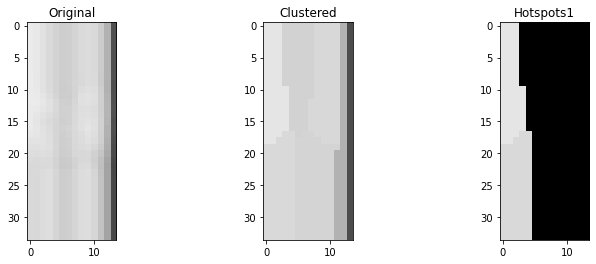

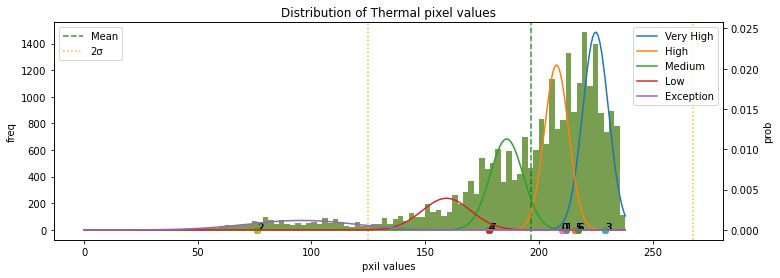

******* end *******
******* start *******
Module type1: Single-Hotspot


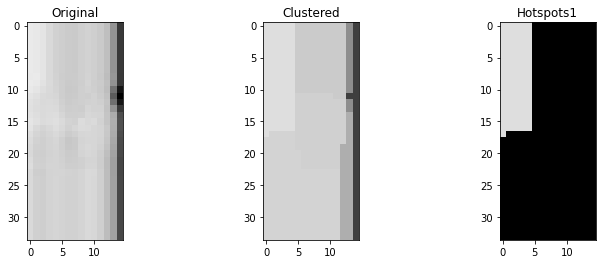

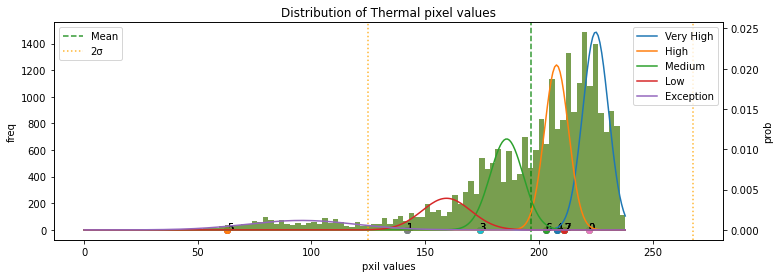

******* end *******
******* start *******
Module type1: Single-Hotspot


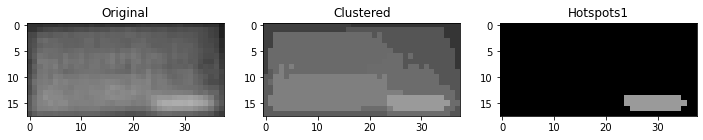

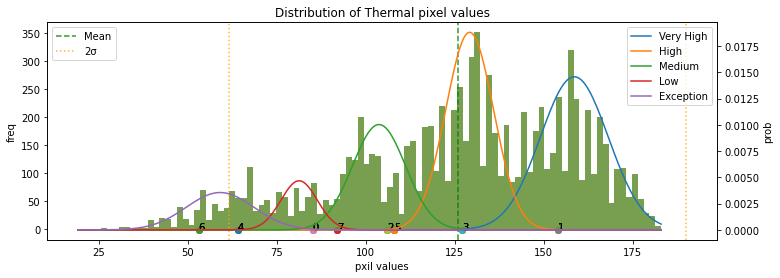

******* end *******
******* start *******
Module type1: Multi-Hotspots


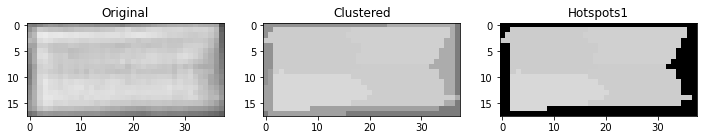

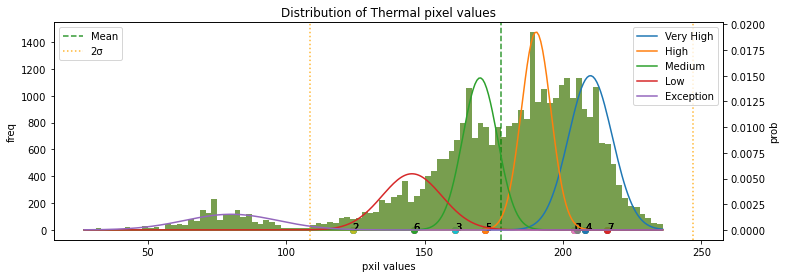

******* end *******
******* start *******
Module type1: Normal


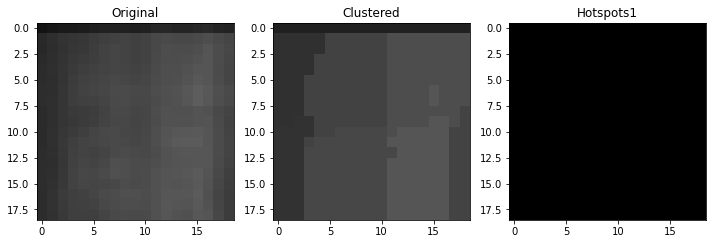

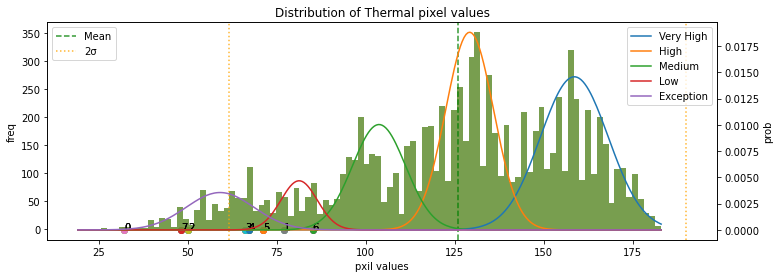

******* end *******
******* start *******
Module type1: Normal


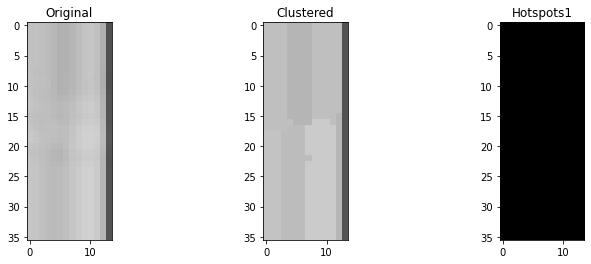

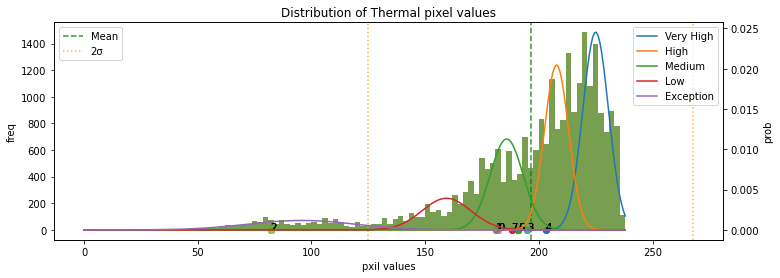

******* end *******
******* start *******
Module type1: Single-Hotspot


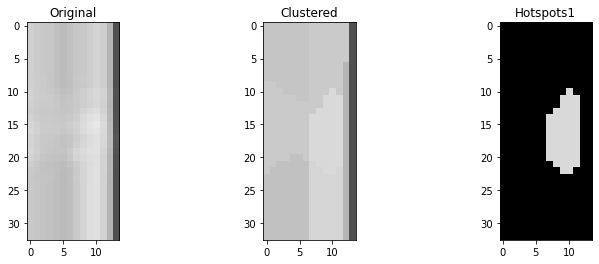

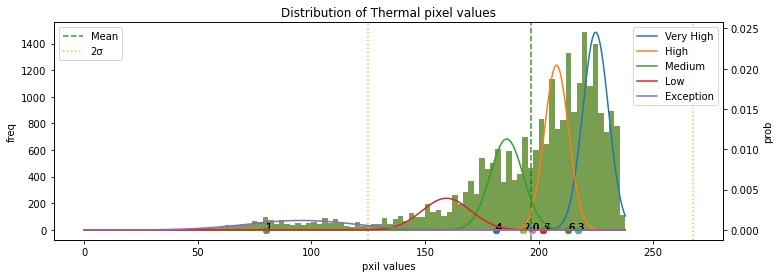

******* end *******
******* start *******
Module type1: Normal


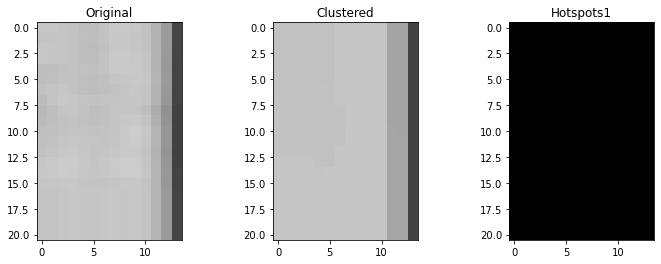

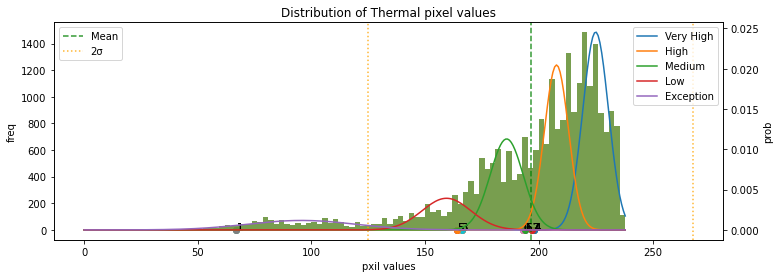

******* end *******
******* start *******
Module type1: Normal


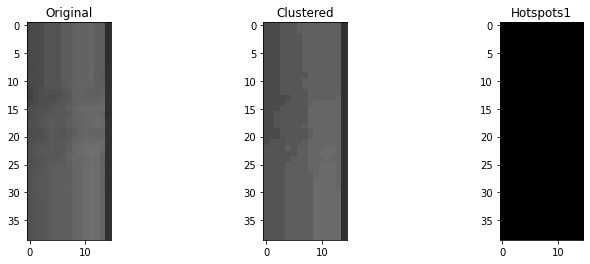

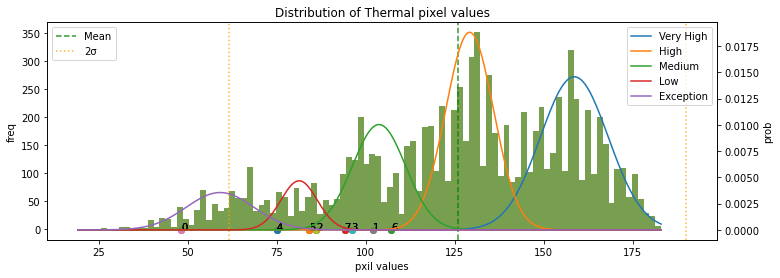

******* end *******
******* start *******
Module type1: Module-Anomaly


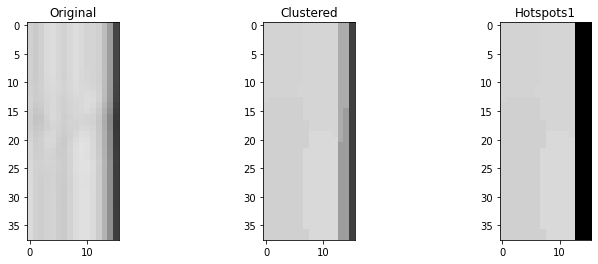

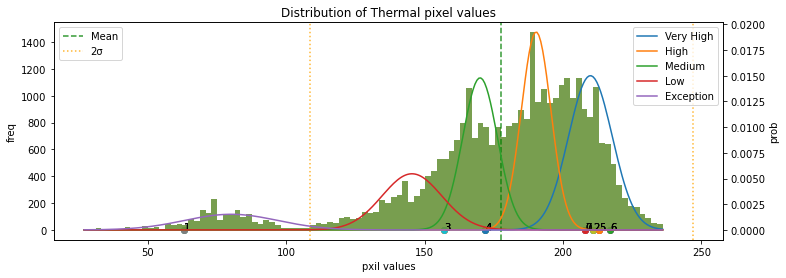

******* end *******
******* start *******
Module type1: Normal


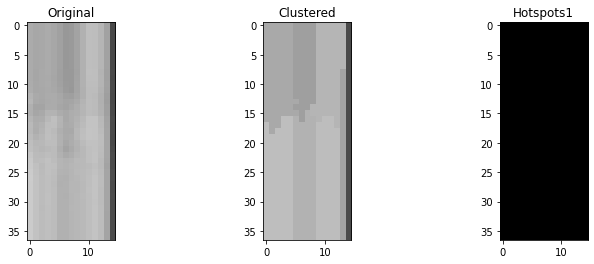

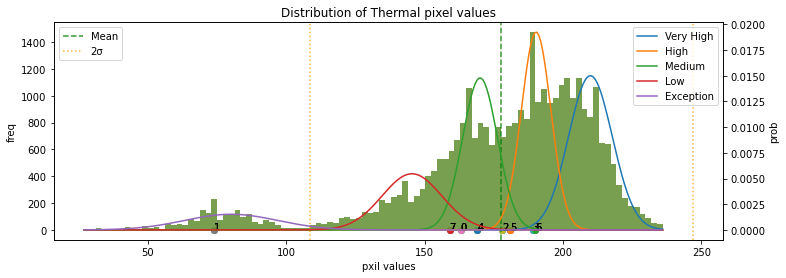

******* end *******
******* start *******
Module type1: Multi-Hotspots


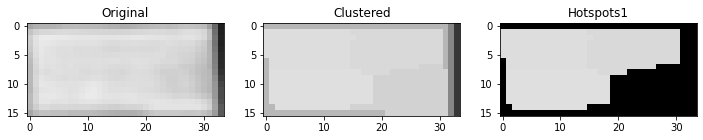

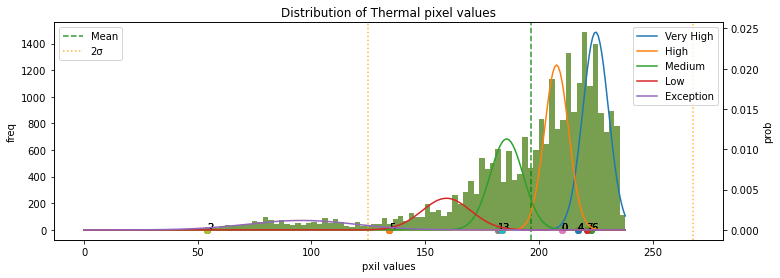

******* end *******
******* start *******
Module type1: Cluster-Anomaly


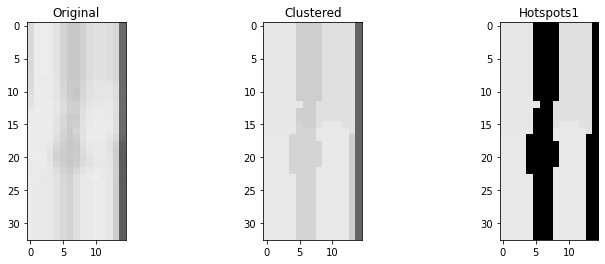

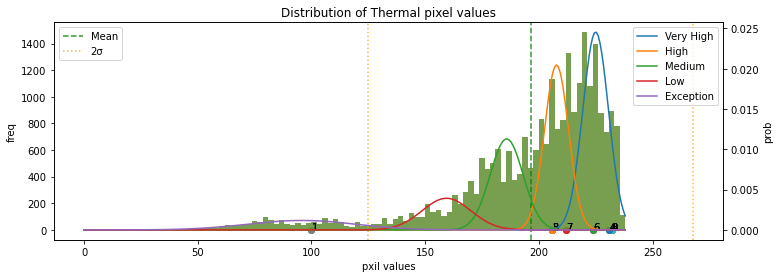

******* end *******
******* start *******
Module type1: Module-Anomaly


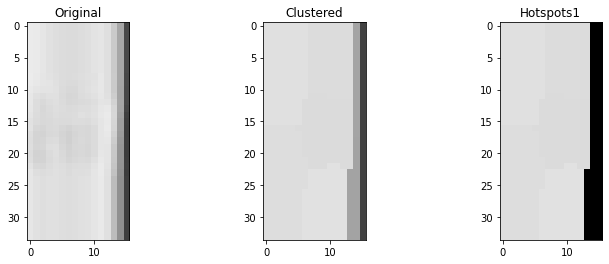

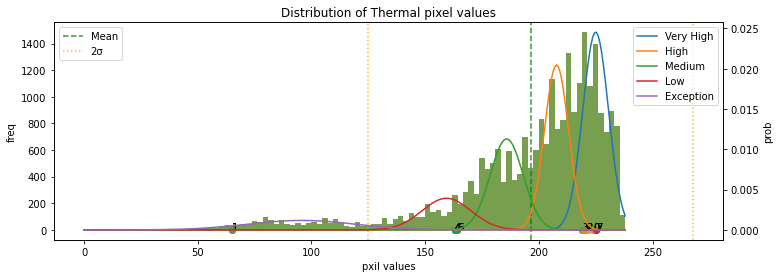

******* end *******
******* start *******
Module type1: Cluster-Anomaly


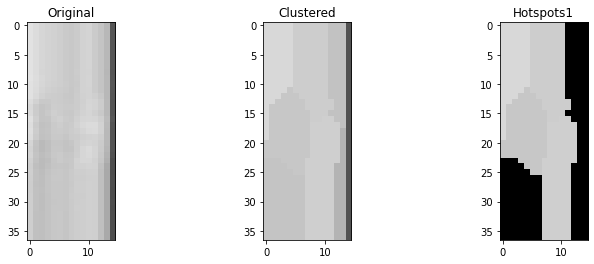

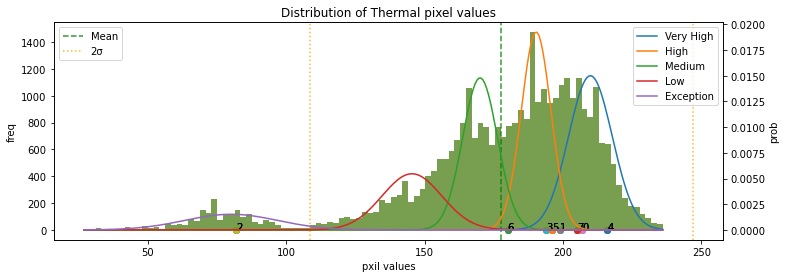

******* end *******
******* start *******
Module type1: Multi-Hotspots


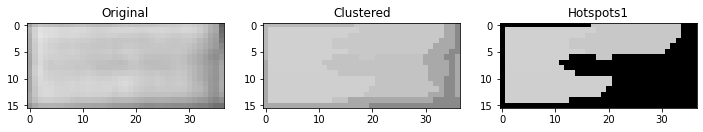

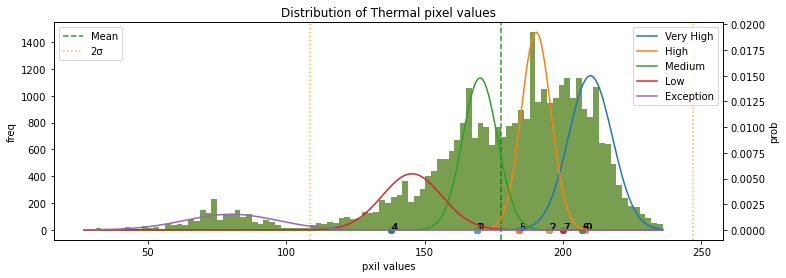

******* end *******
******* start *******
Module type1: Cluster-Anomaly


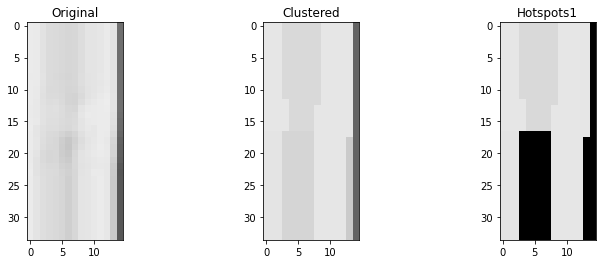

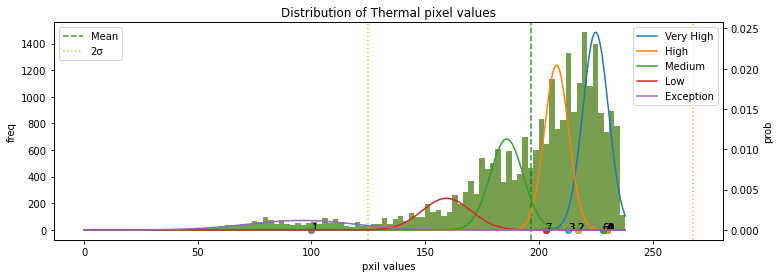

******* end *******
******* start *******
Module type1: Module-Anomaly


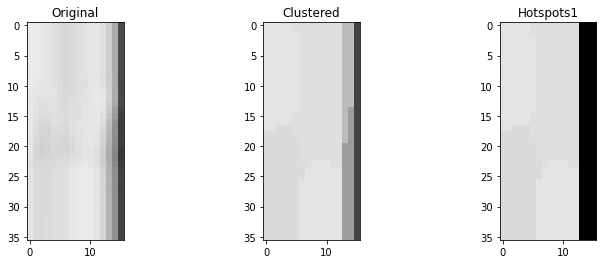

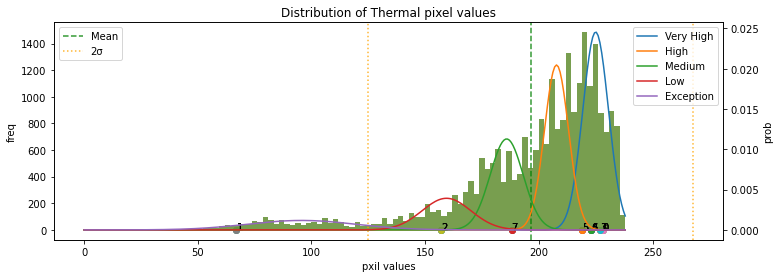

******* end *******
******* start *******
Module type1: Cluster-Anomaly


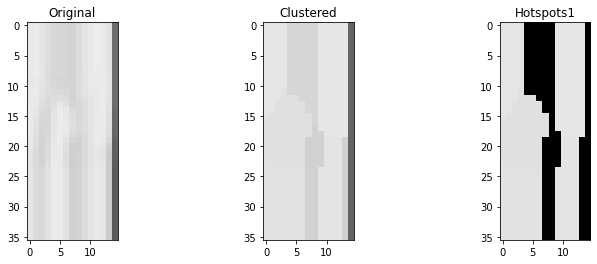

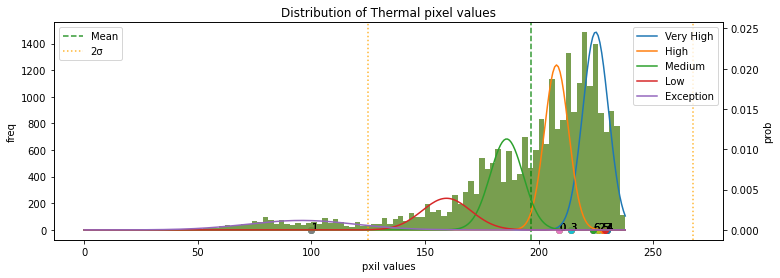

******* end *******
******* start *******
Module type1: Module-Anomaly


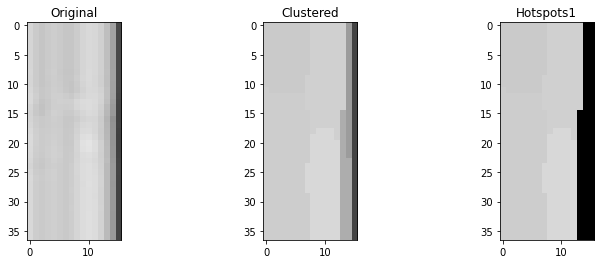

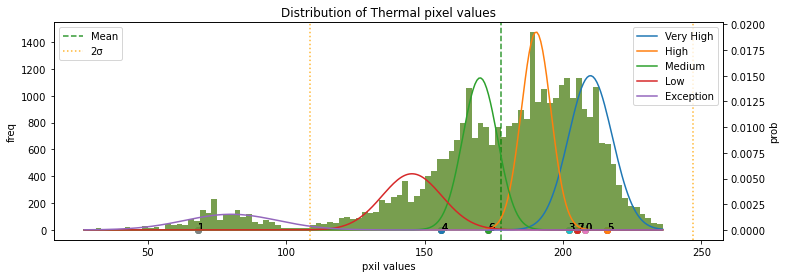

******* end *******
******* start *******
Module type1: Multi-Hotspots


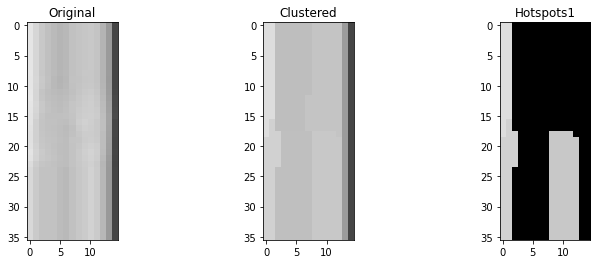

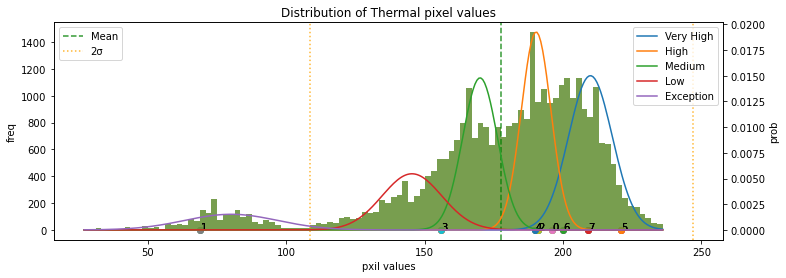

******* end *******
******* start *******
Module type1: Cluster-Anomaly


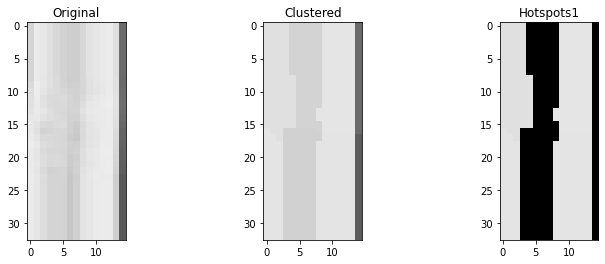

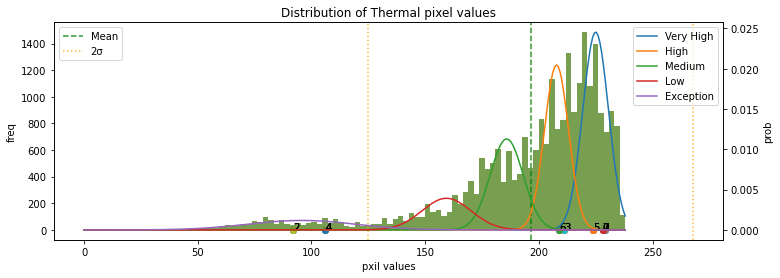

******* end *******
******* start *******
Module type1: Cluster-Anomaly


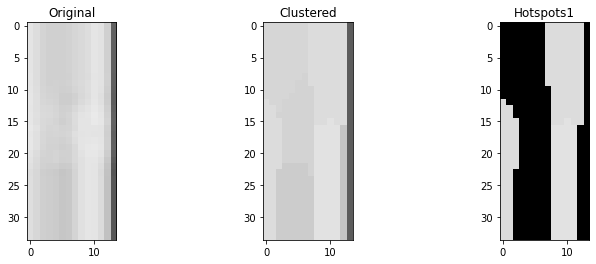

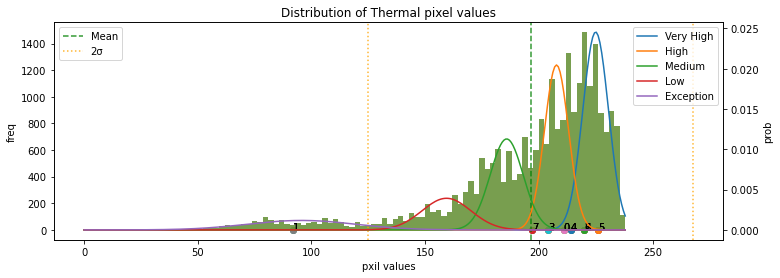

******* end *******
******* start *******
Module type1: Module-Anomaly


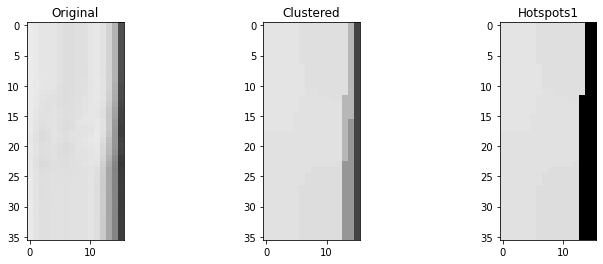

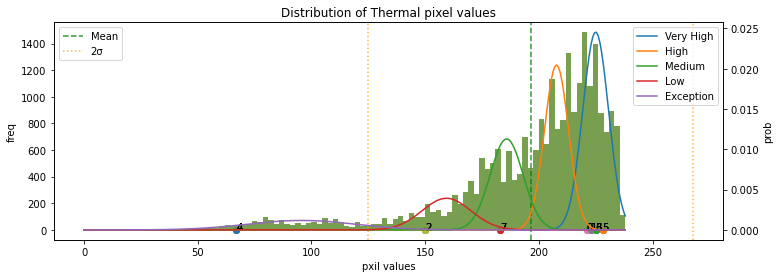

******* end *******
******* start *******
Module type1: Multi-Hotspots


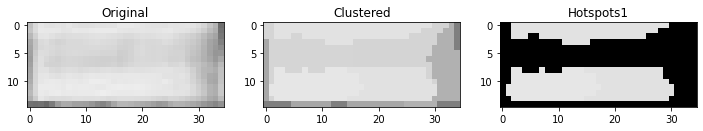

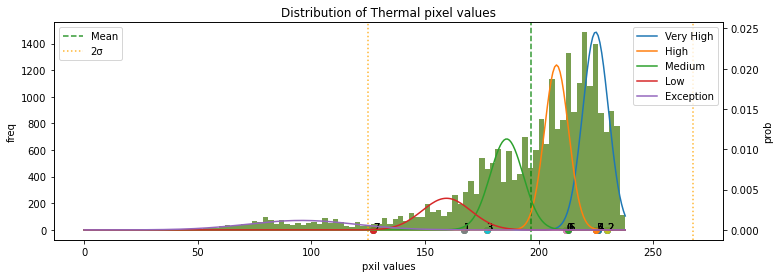

******* end *******
******* start *******
Module type1: Normal


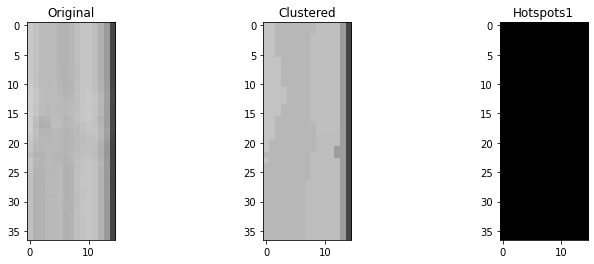

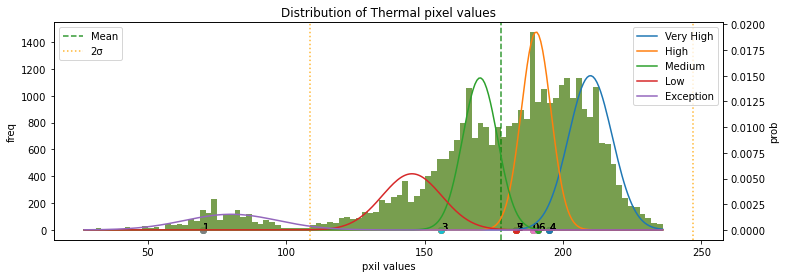

******* end *******
******* start *******
Module type1: Multi-Hotspots


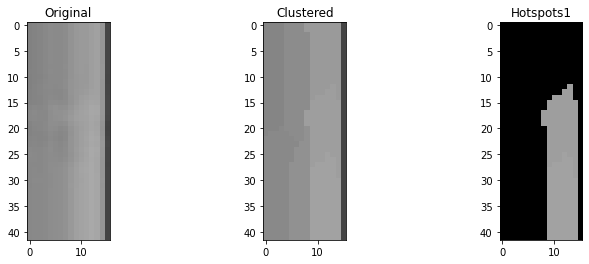

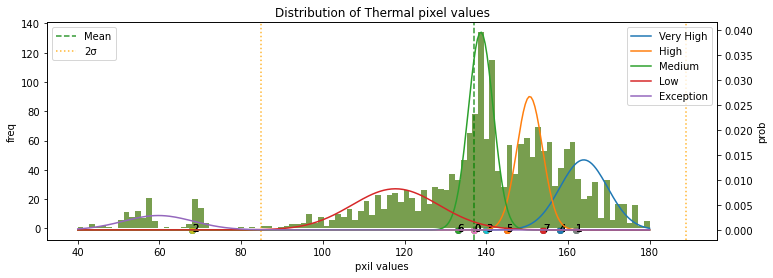

******* end *******
******* start *******
Module type1: Normal


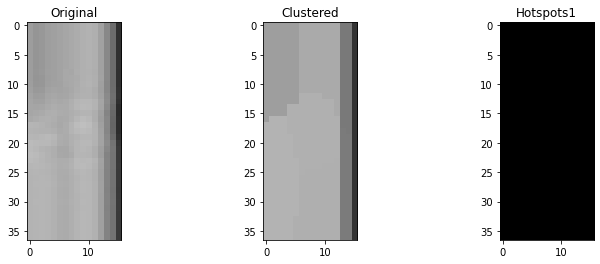

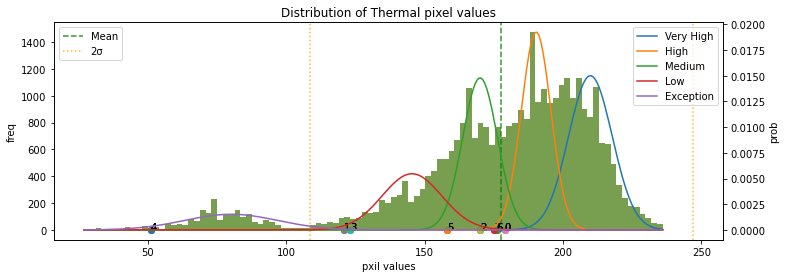

******* end *******
******* start *******
Module type1: Multi-Hotspots


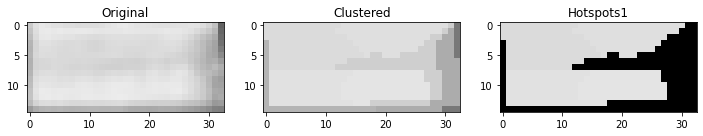

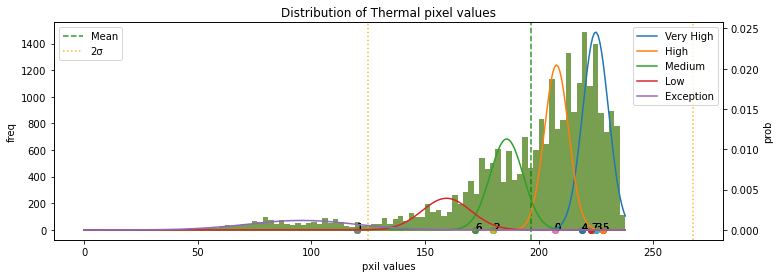

******* end *******
******* start *******
Module type1: Multi-Hotspots


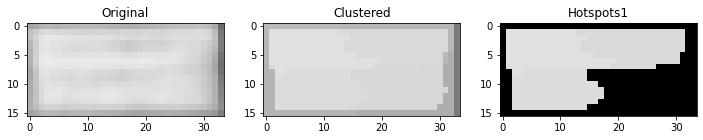

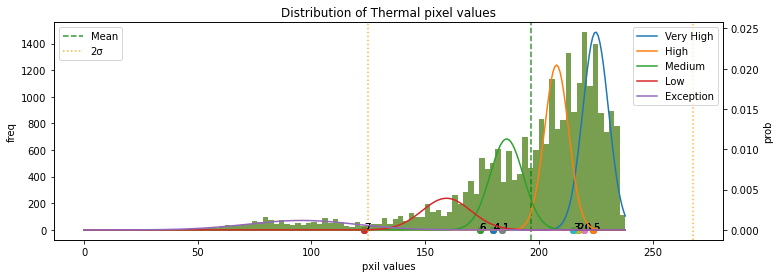

******* end *******
******* start *******
Module type1: Multi-Hotspots


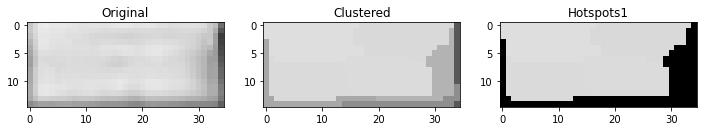

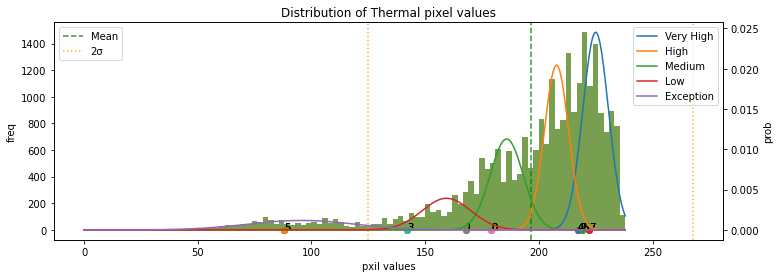

******* end *******
******* start *******
Module type1: Cluster-Anomaly


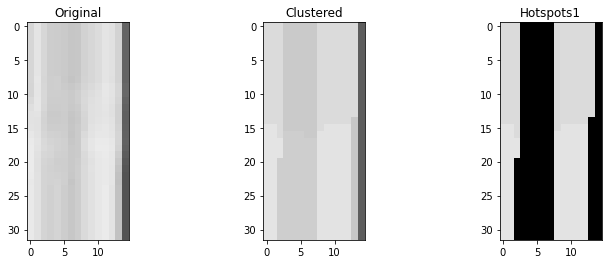

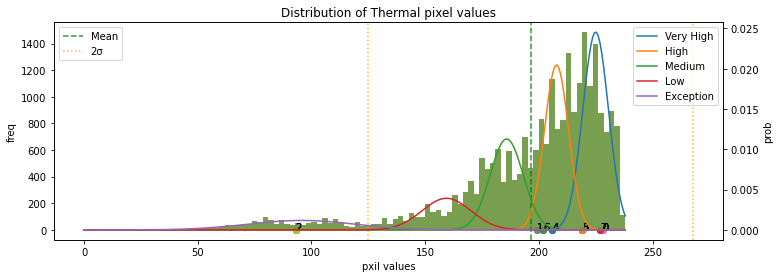

******* end *******
******* start *******
Module type1: Normal


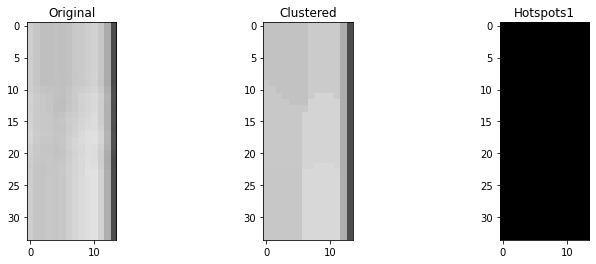

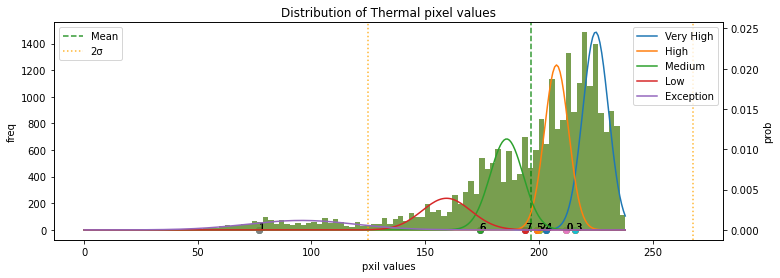

******* end *******
******* start *******
Module type1: Single-Hotspot


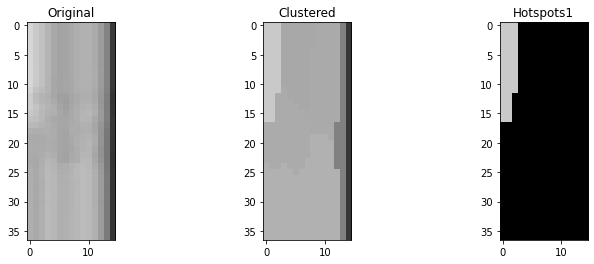

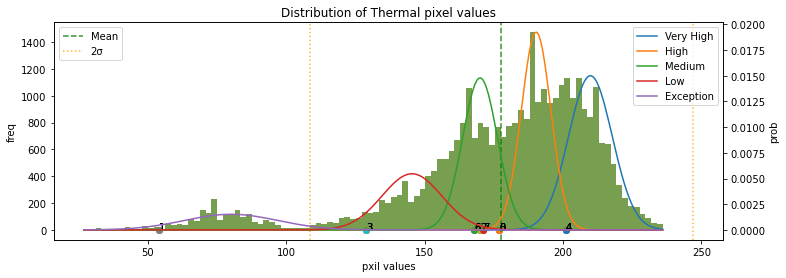

******* end *******
******* start *******
Module type1: Normal


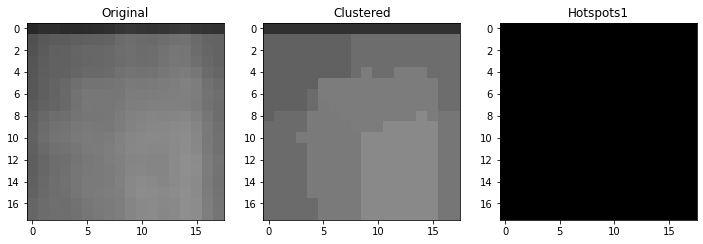

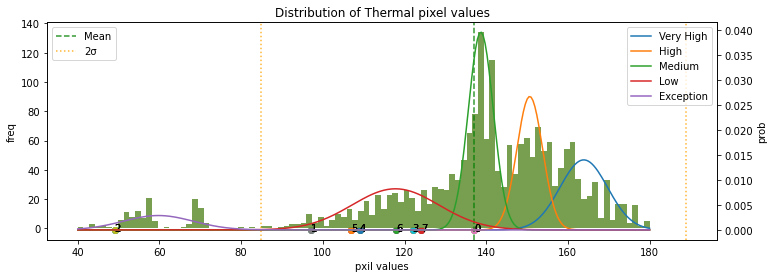

******* end *******
******* start *******
Module type1: Module-Anomaly


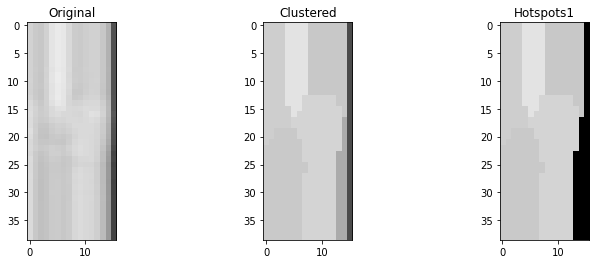

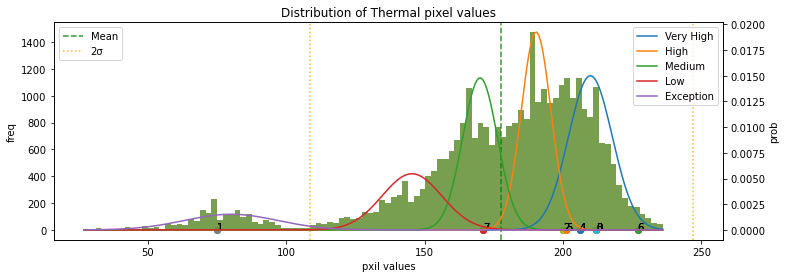

******* end *******
******* start *******
Module type1: Module-Anomaly


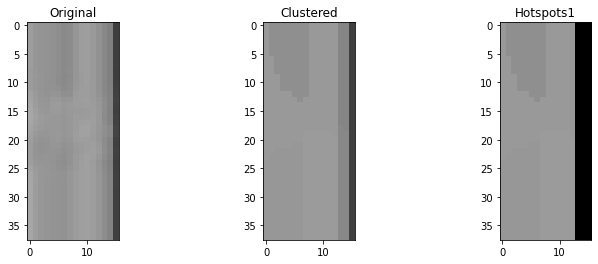

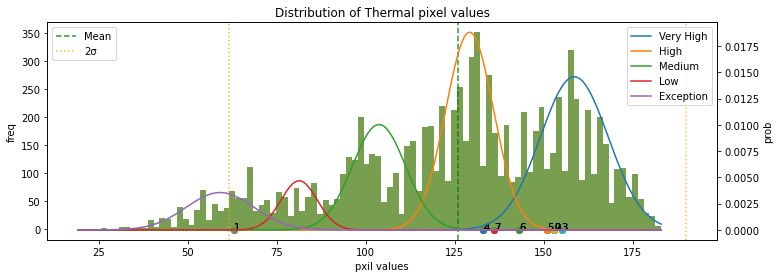

******* end *******
******* start *******
Module type1: Module-Anomaly


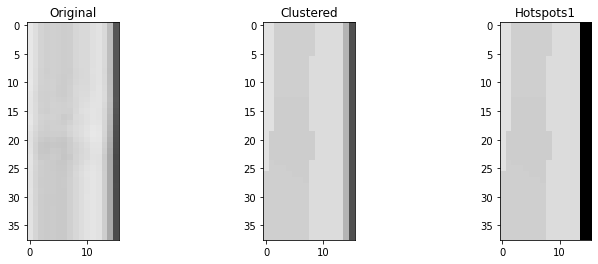

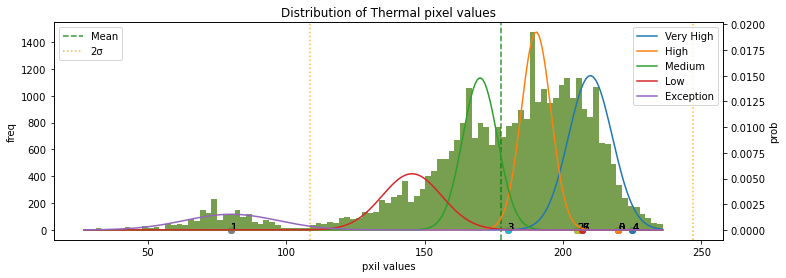

******* end *******
******* start *******
Module type1: Multi-Hotspots


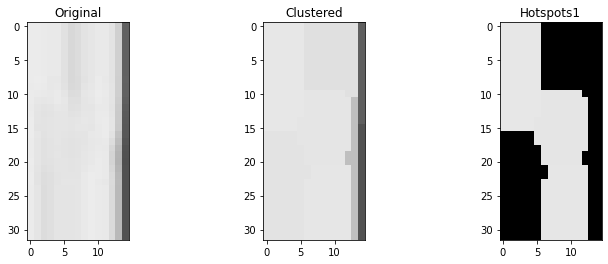

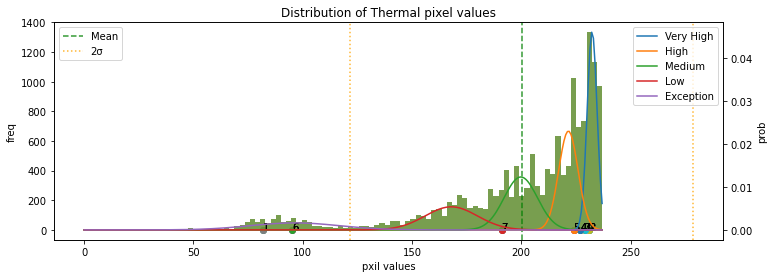

******* end *******
******* start *******
Module type1: Normal


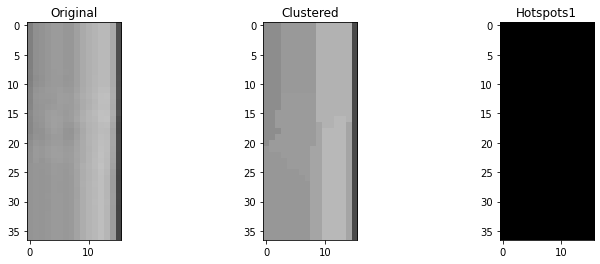

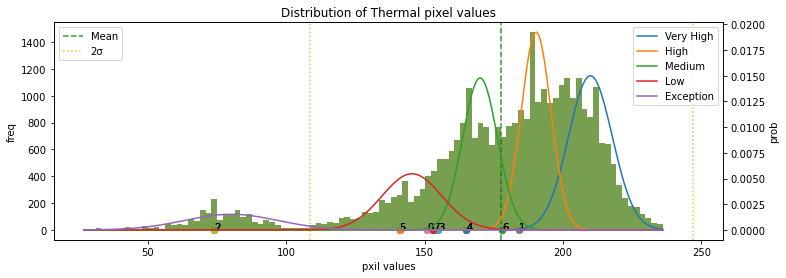

******* end *******
******* start *******
Module type1: Multi-Hotspots


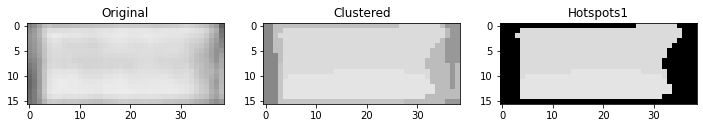

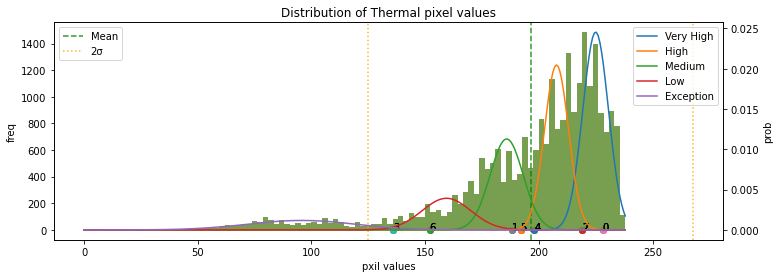

******* end *******
******* start *******
Module type1: Normal


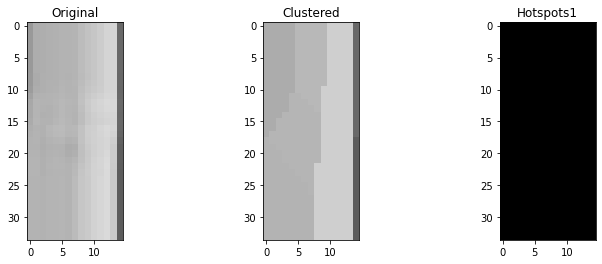

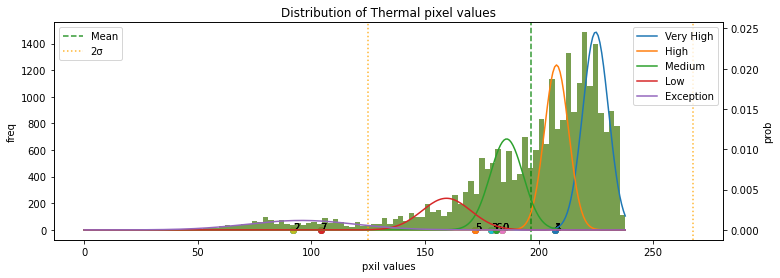

******* end *******
******* start *******
Module type1: Normal


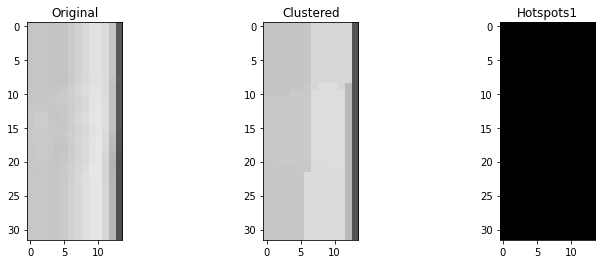

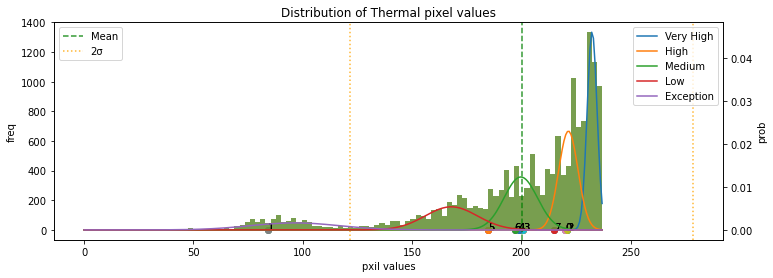

******* end *******
******* start *******
Module type1: Normal


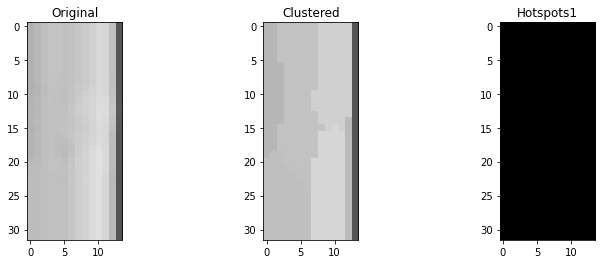

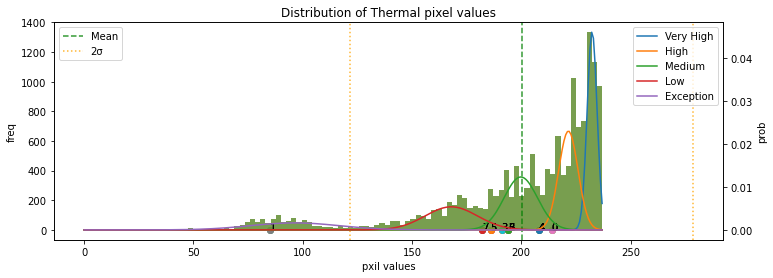

******* end *******
******* start *******
Module type1: Normal


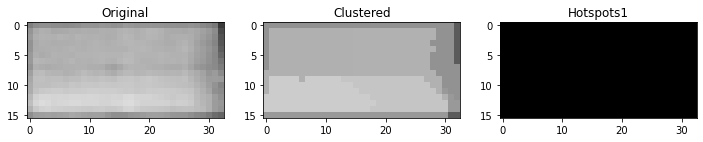

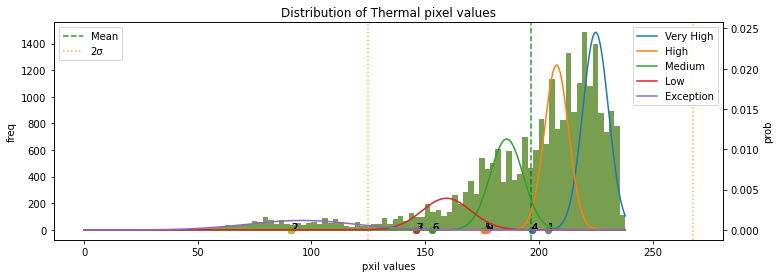

******* end *******
******* start *******
Module type1: Single-Hotspot


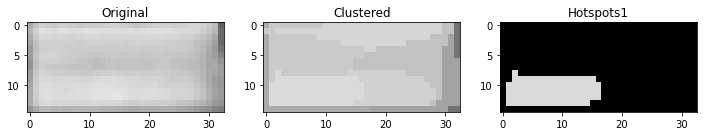

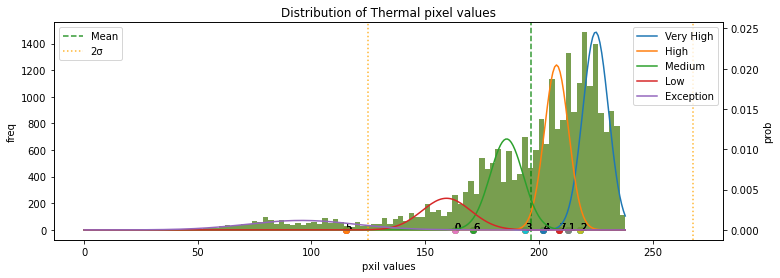

******* end *******
******* start *******
Module type1: Normal


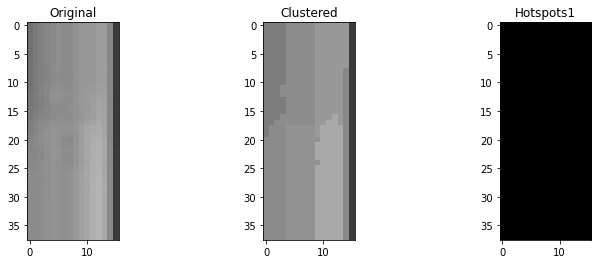

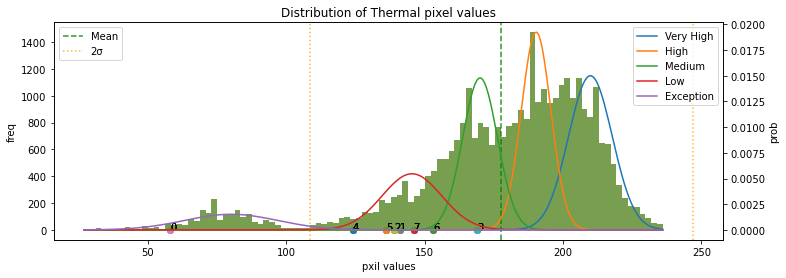

******* end *******
******* start *******
Module type1: Normal


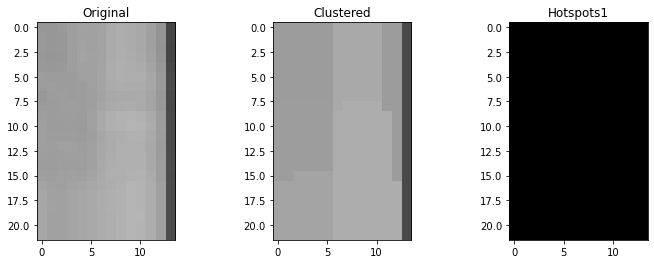

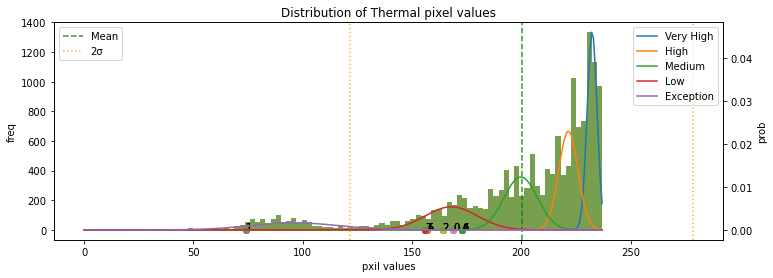

******* end *******
******* start *******
Module type1: Module-Anomaly


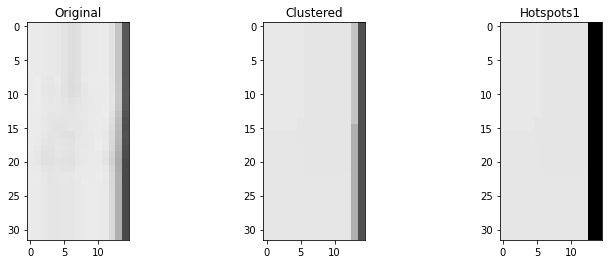

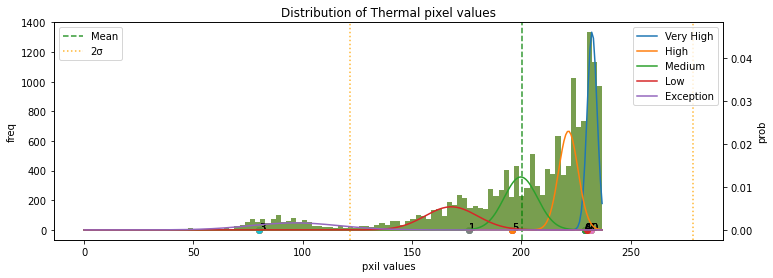

******* end *******
******* start *******
Module type1: Module-Anomaly


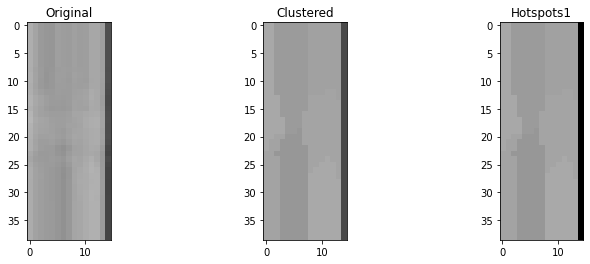

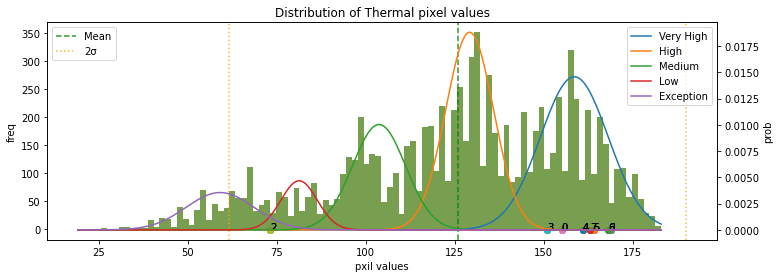

******* end *******
******* start *******
Module type1: Multi-Hotspots


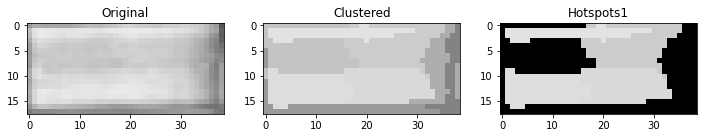

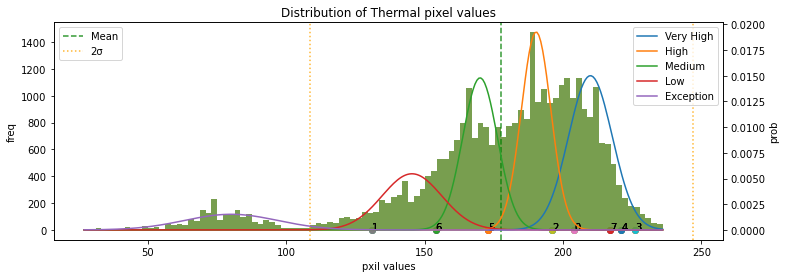

******* end *******
******* start *******
Module type1: Cluster-Anomaly


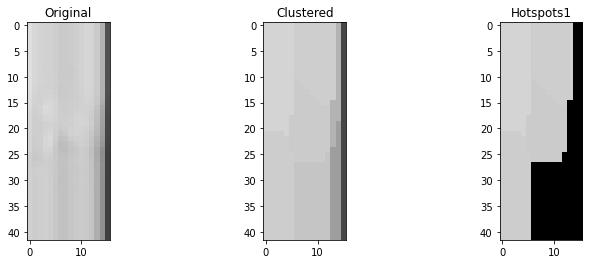

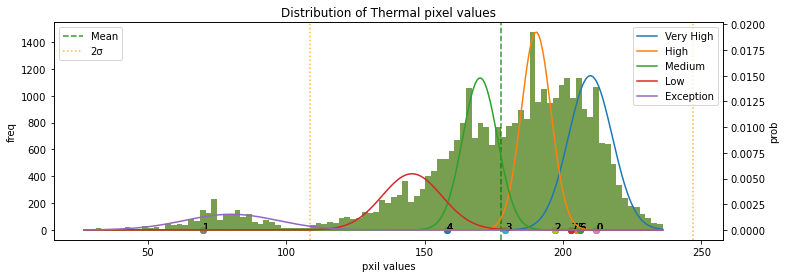

******* end *******
******* start *******
Module type1: Module-Anomaly


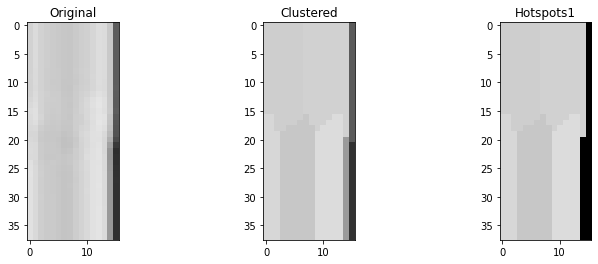

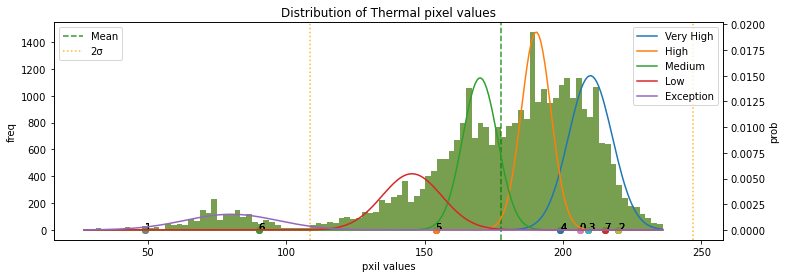

******* end *******
******* start *******
Module type1: Module-Anomaly


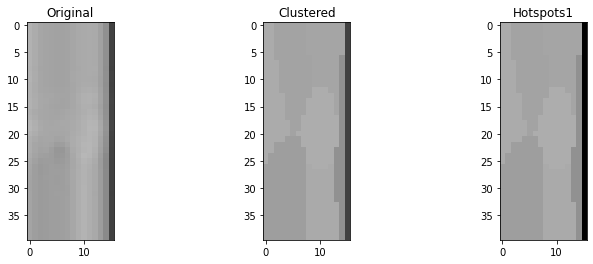

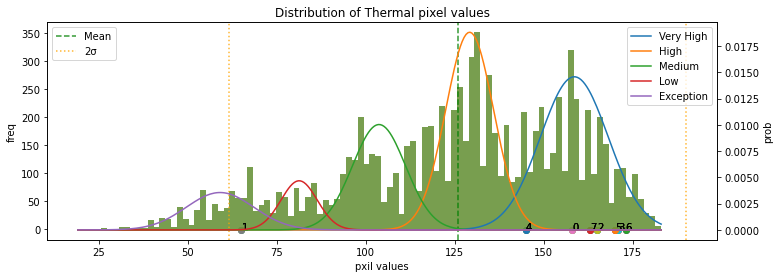

******* end *******
******* start *******
Module type1: Module-Anomaly


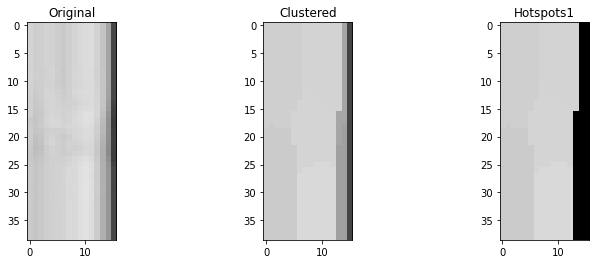

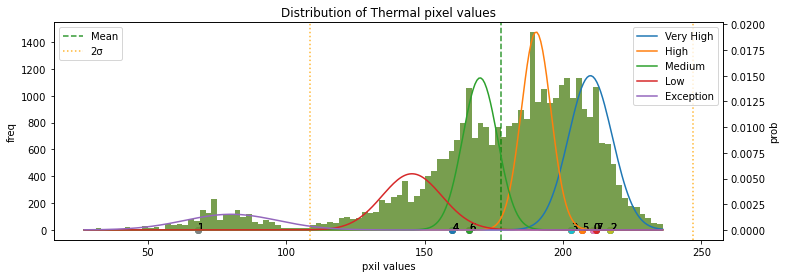

******* end *******
******* start *******
Module type1: Multi-Hotspots


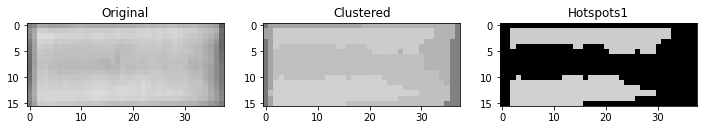

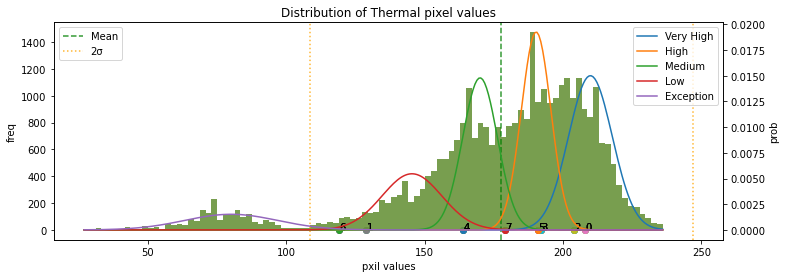

******* end *******
******* start *******
Module type1: Normal


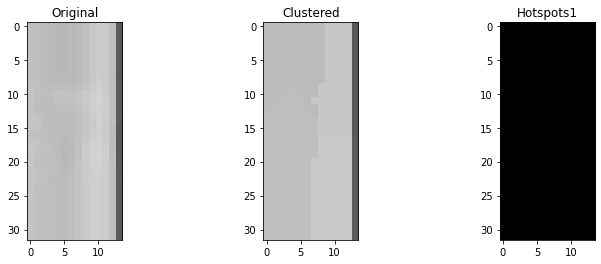

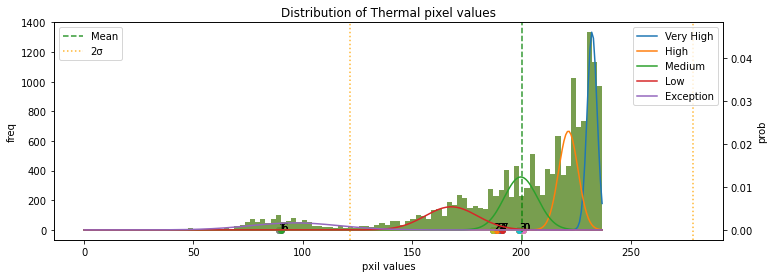

******* end *******
******* start *******
Module type1: Cluster-Anomaly


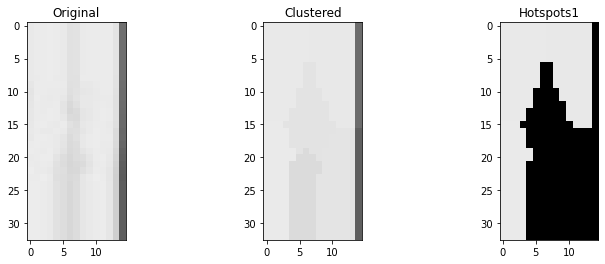

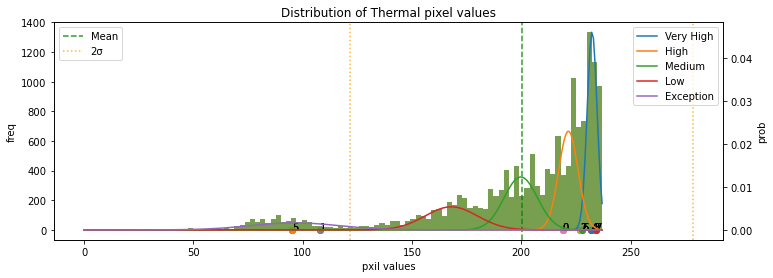

******* end *******
******* start *******
Module type1: Normal


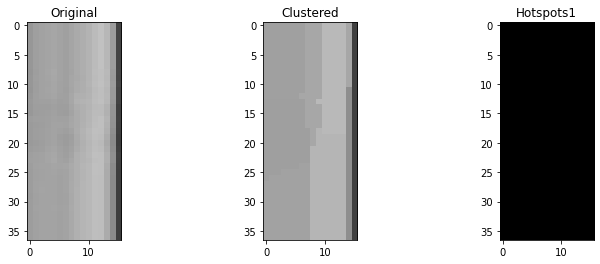

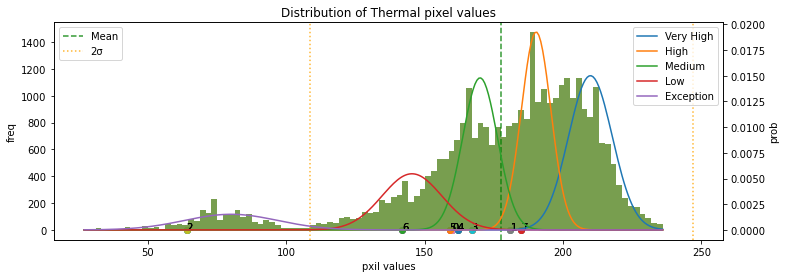

******* end *******
******* start *******
Module type1: Single-Hotspot


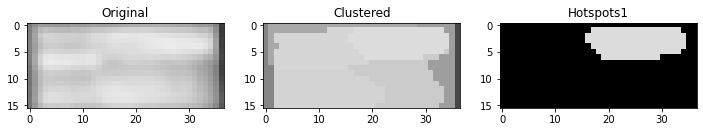

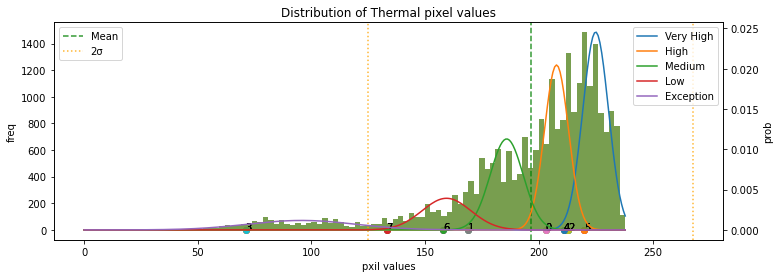

******* end *******
******* start *******
Module type1: Normal


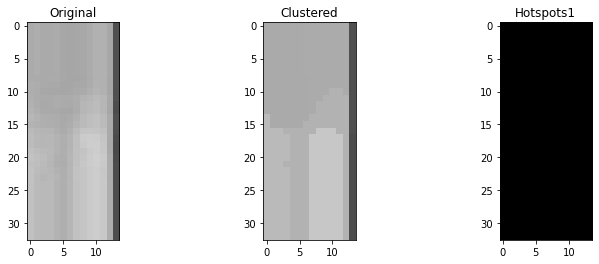

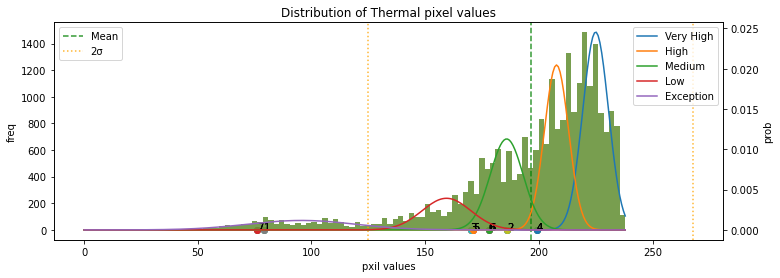

******* end *******
******* start *******
Module type1: Cluster-Anomaly


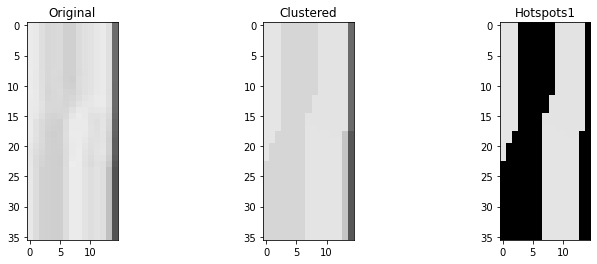

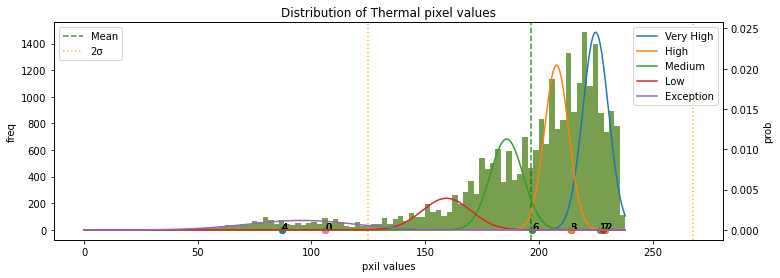

******* end *******
******* start *******
Module type1: Normal


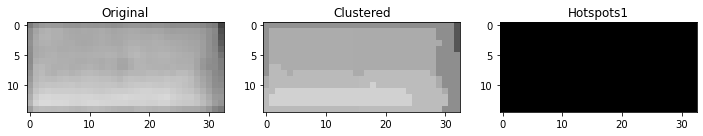

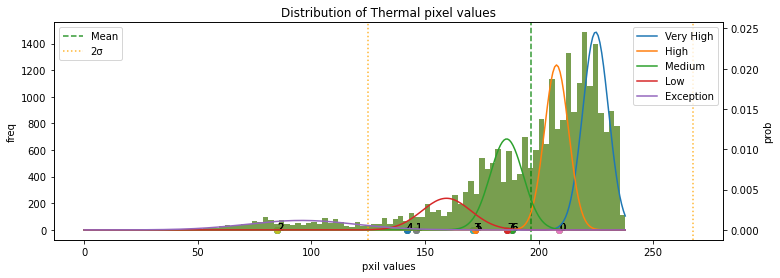

******* end *******
******* start *******
Module type1: Normal


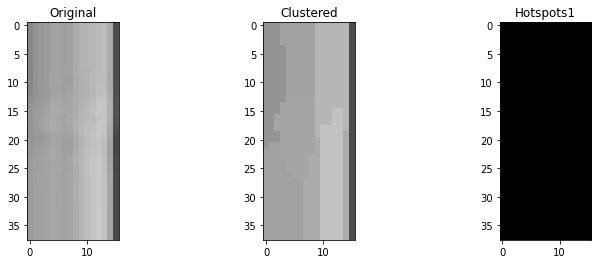

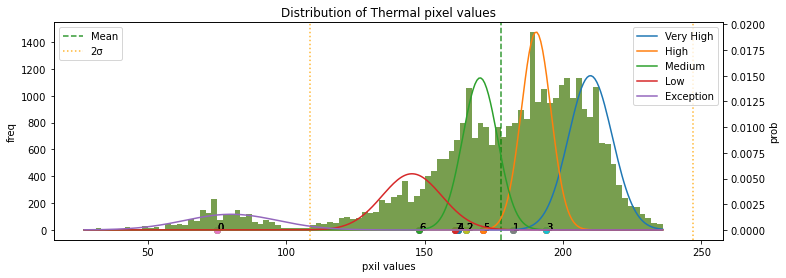

******* end *******
******* start *******
Module type1: Cluster-Anomaly


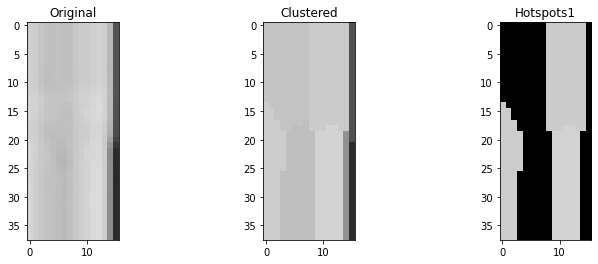

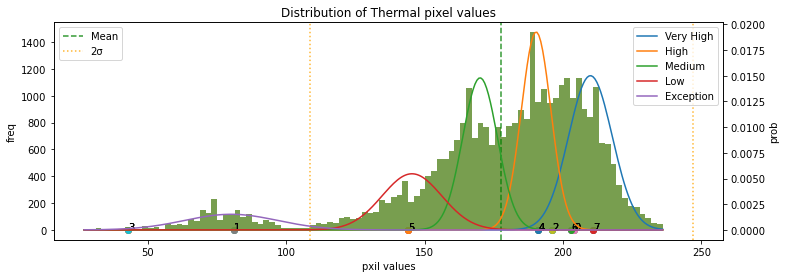

******* end *******
******* start *******
Module type1: Normal


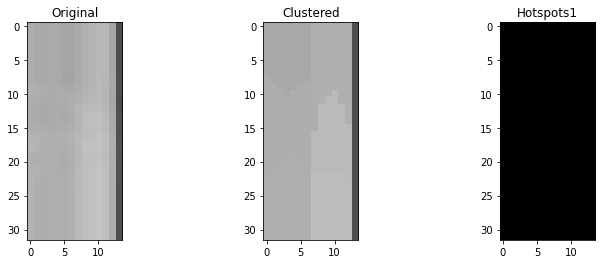

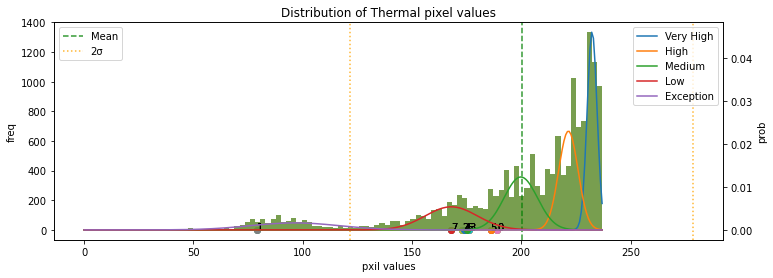

******* end *******
******* start *******
Module type1: Module-Anomaly


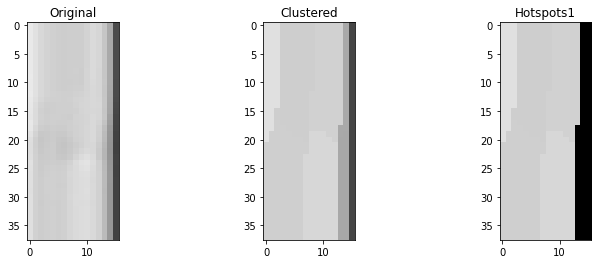

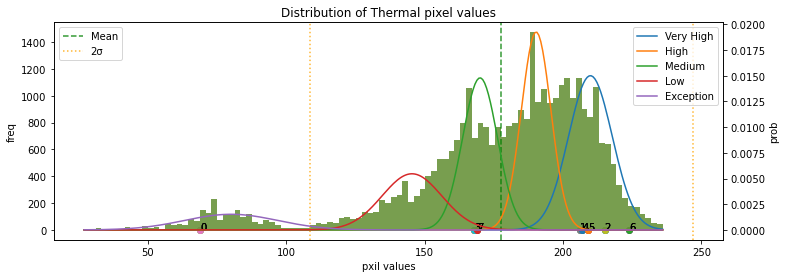

******* end *******
******* start *******
Module type1: Multi-Hotspots


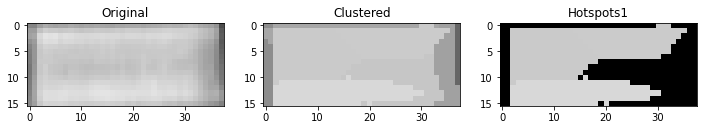

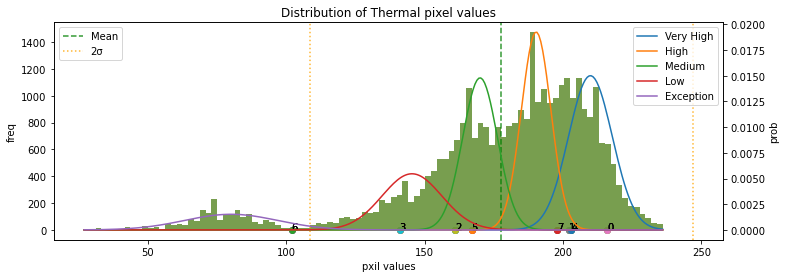

******* end *******
******* start *******
Module type1: Module-Anomaly


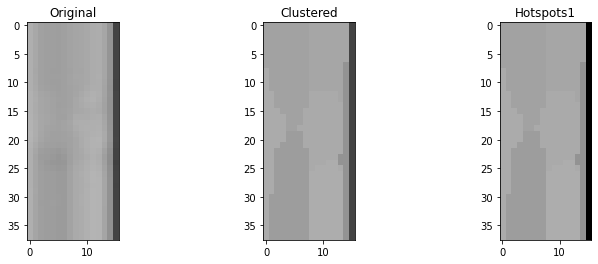

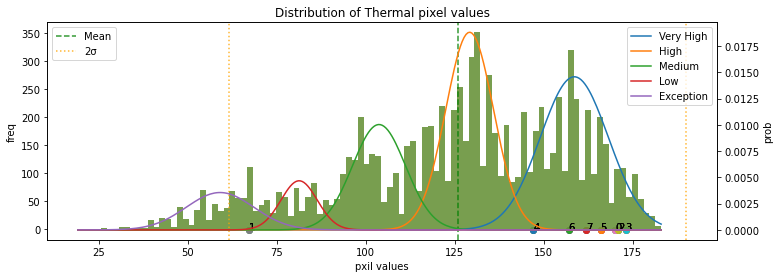

******* end *******
******* start *******
Module type1: Cluster-Anomaly


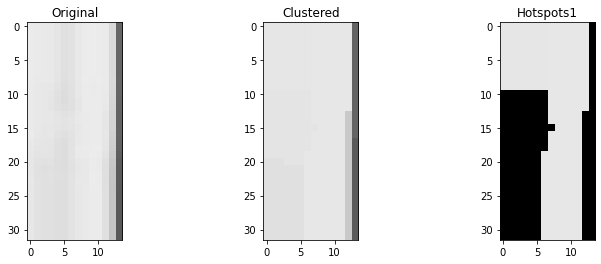

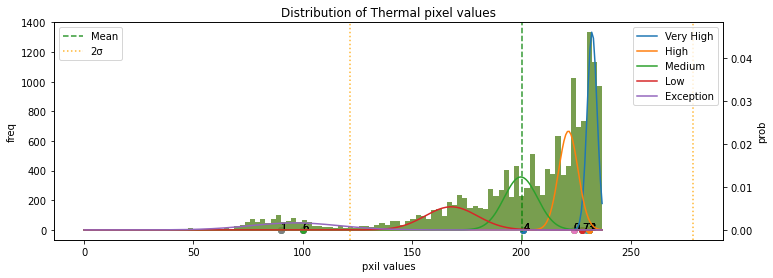

******* end *******
******* start *******
Module type1: Normal


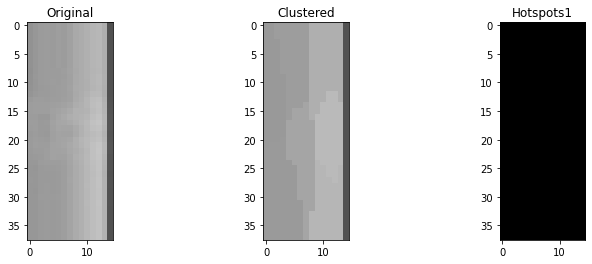

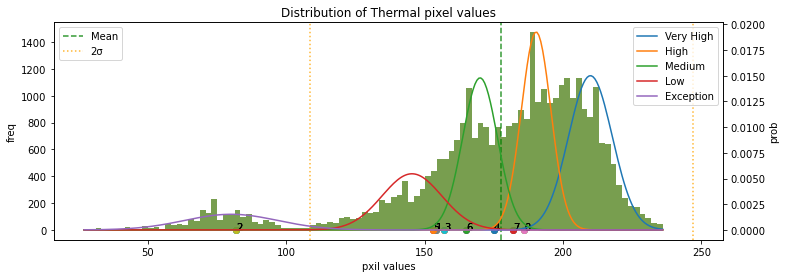

******* end *******
******* start *******
Module type1: Normal


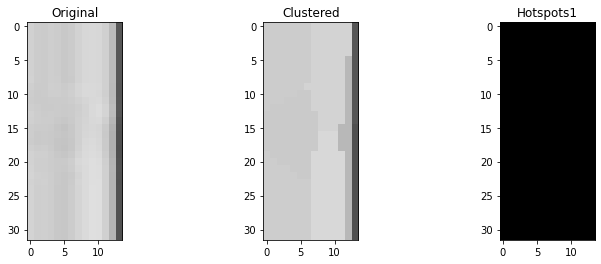

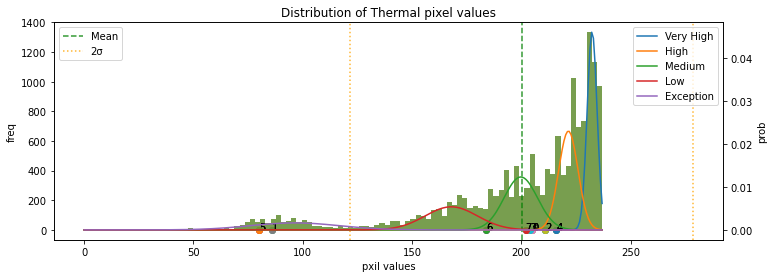

******* end *******
******* start *******
Module type1: Single-Hotspot


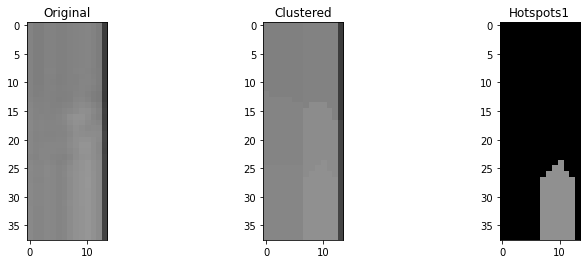

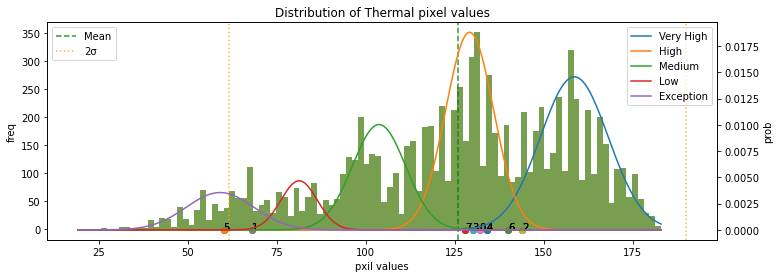

******* end *******
******* start *******
Module type1: Cluster-Anomaly


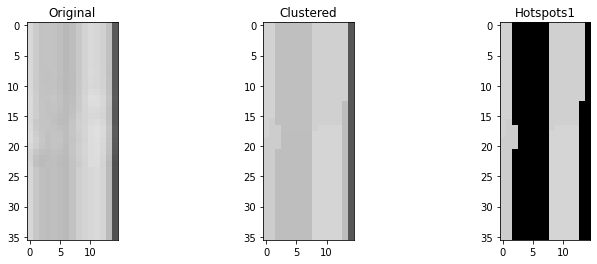

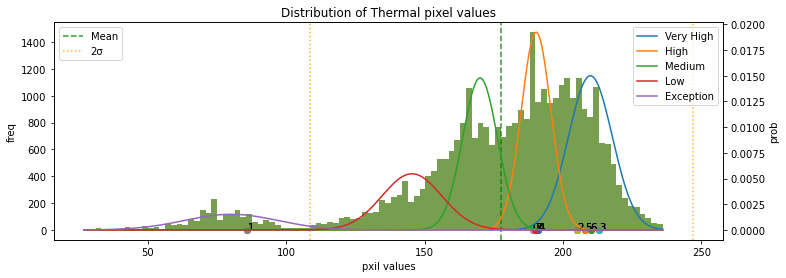

******* end *******
******* start *******
Module type1: Normal


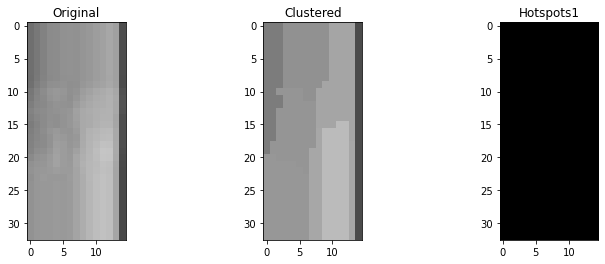

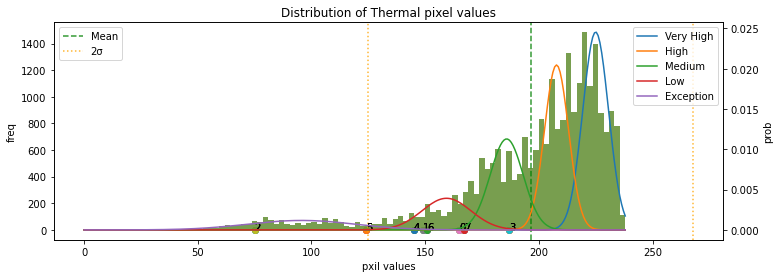

******* end *******
******* start *******
Module type1: Cluster-Anomaly


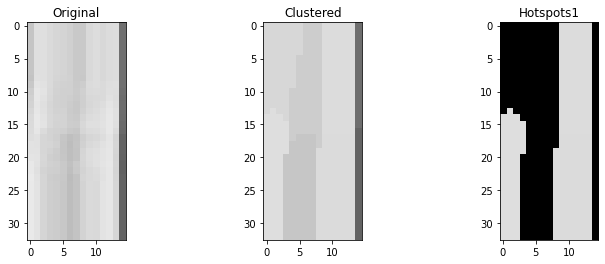

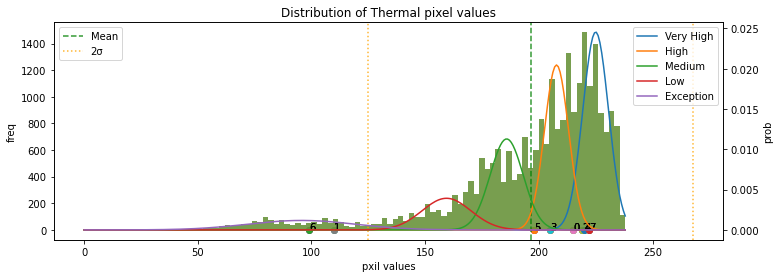

******* end *******
******* start *******
Module type1: Normal


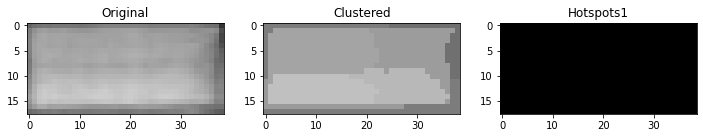

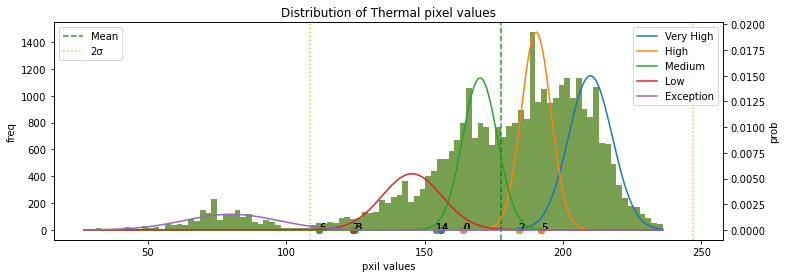

******* end *******
******* start *******
Module type1: Single-Hotspot


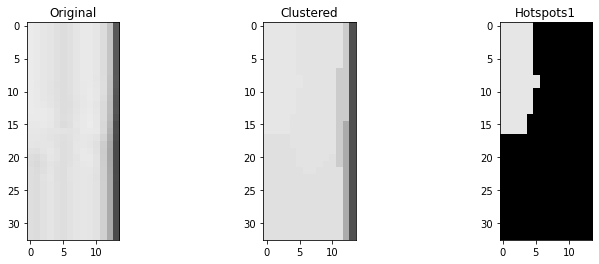

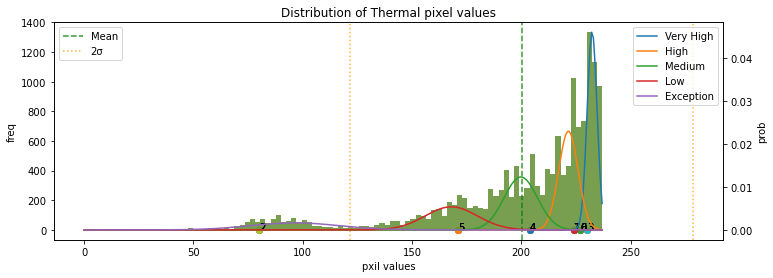

******* end *******
******* start *******
Module type1: Normal


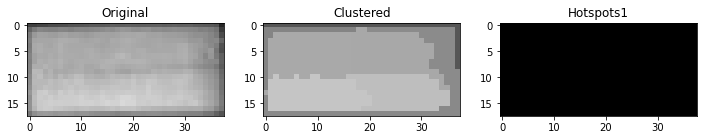

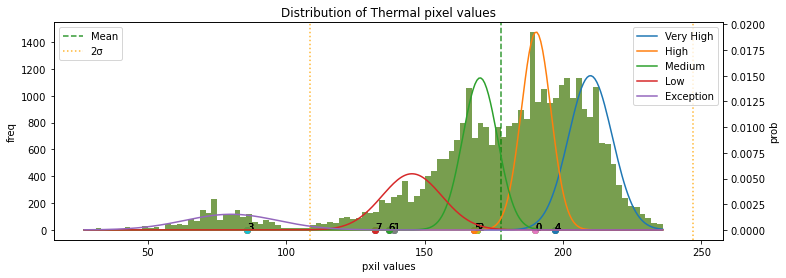

******* end *******
******* start *******
Module type1: Normal


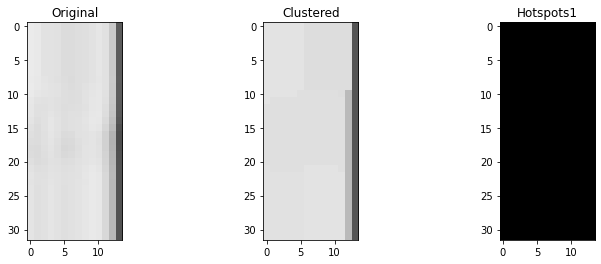

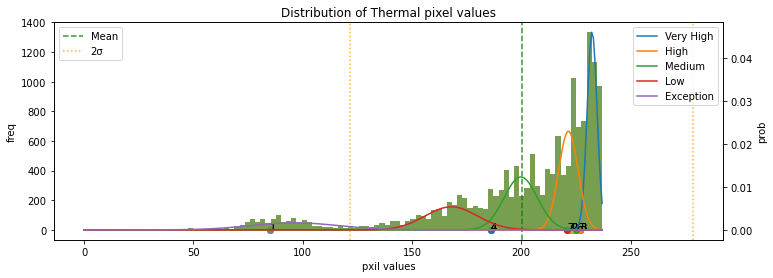

******* end *******
******* start *******
Module type1: Multi-Hotspots


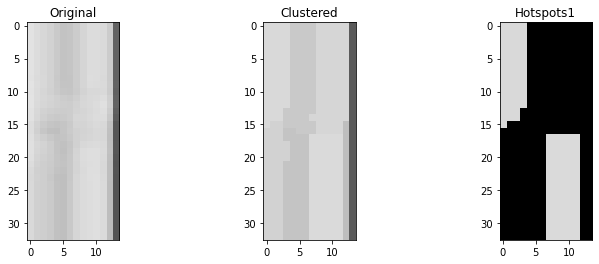

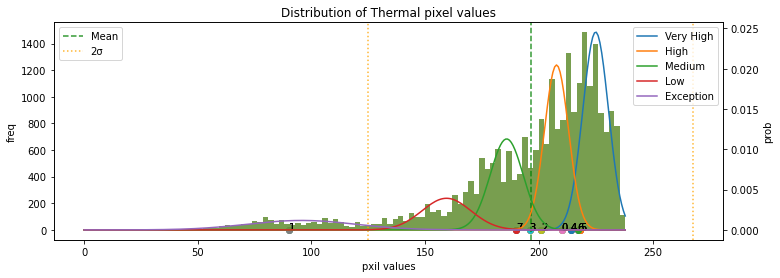

******* end *******
******* start *******
Module type1: Normal


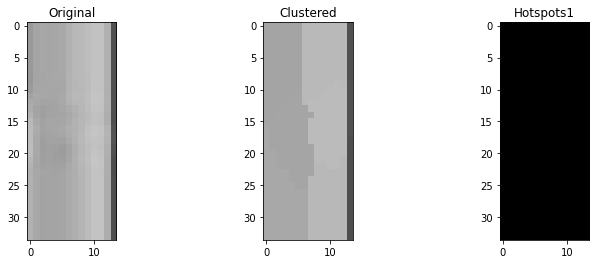

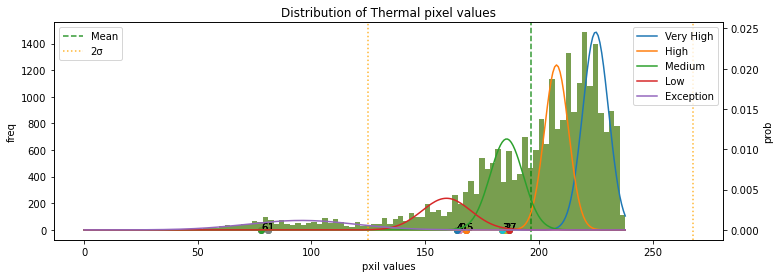

******* end *******
******* start *******
Module type1: Cluster-Anomaly


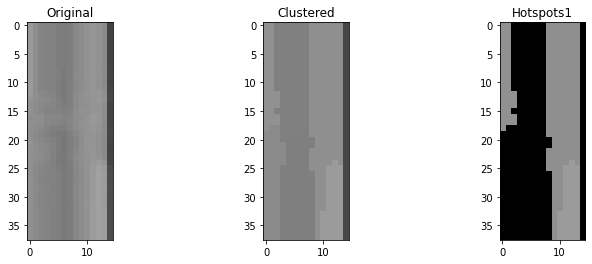

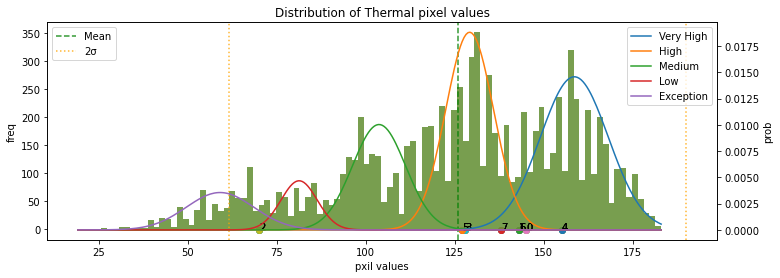

******* end *******
******* start *******
Module type1: Normal


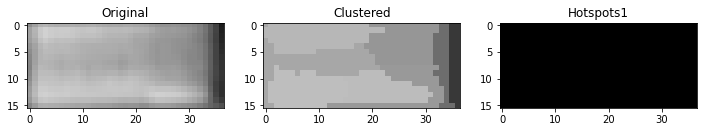

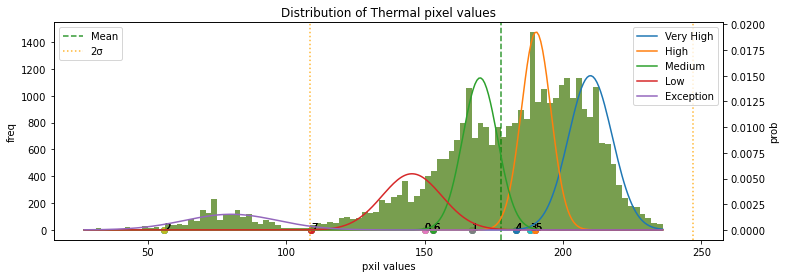

******* end *******
******* start *******
Module type1: Cluster-Anomaly


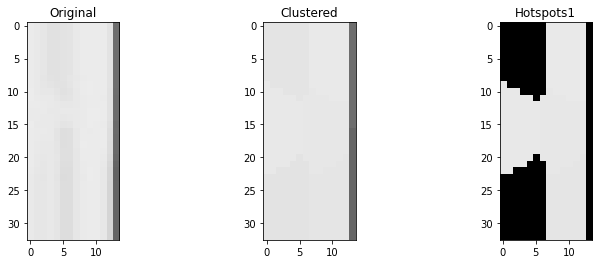

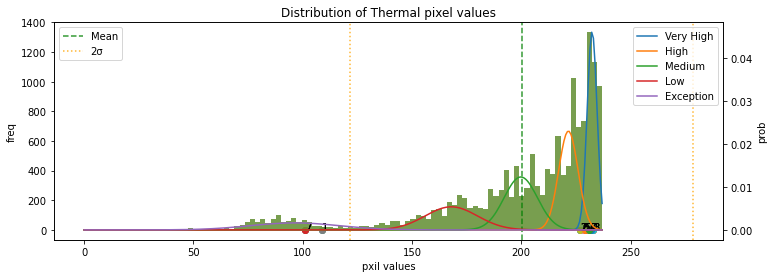

******* end *******
******* start *******
Module type1: Normal


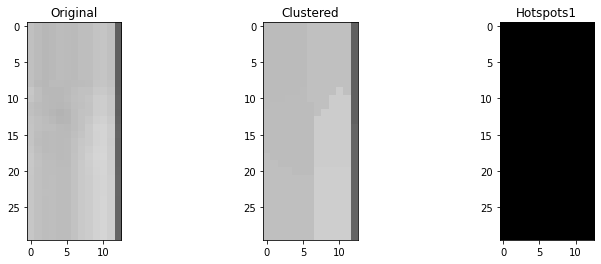

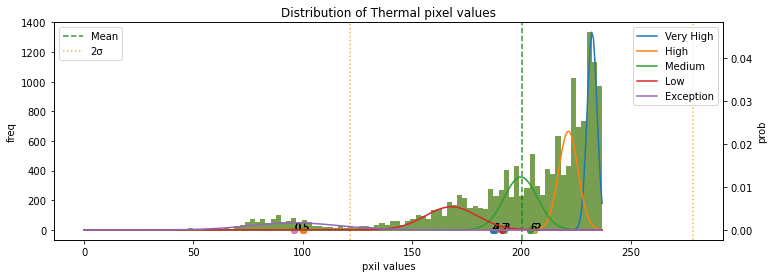

******* end *******
******* start *******
Module type1: Multi-Hotspots


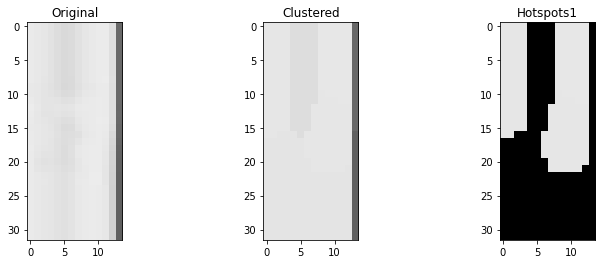

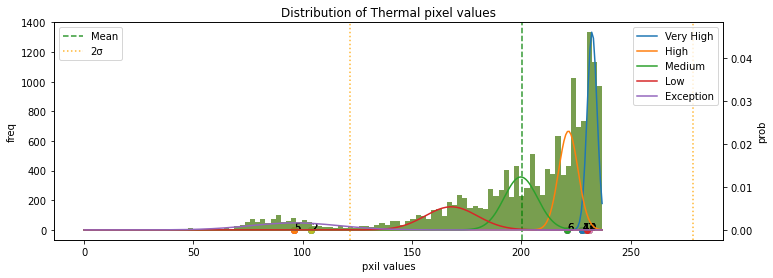

******* end *******
******* start *******
Module type1: Normal


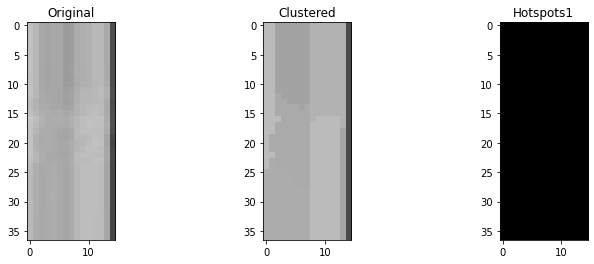

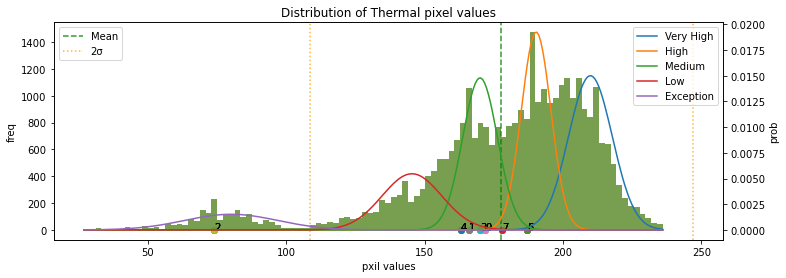

******* end *******
******* start *******
Module type1: Cluster-Anomaly


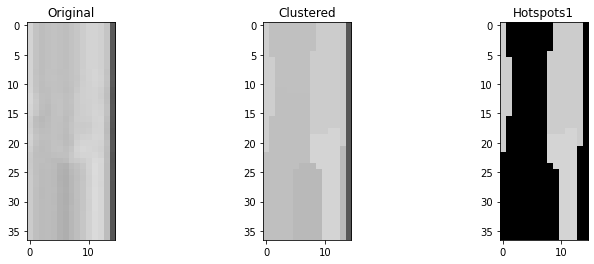

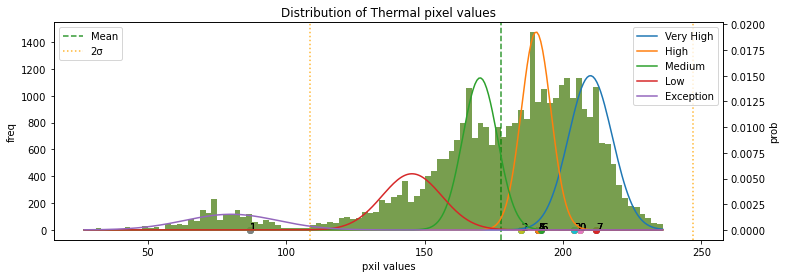

******* end *******
******* start *******
Module type1: Normal


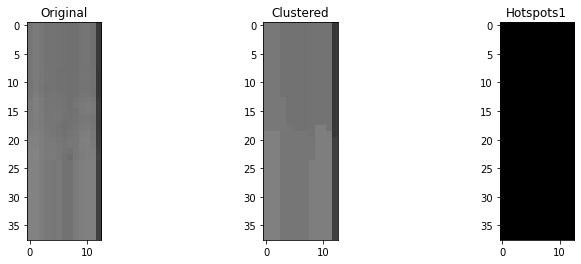

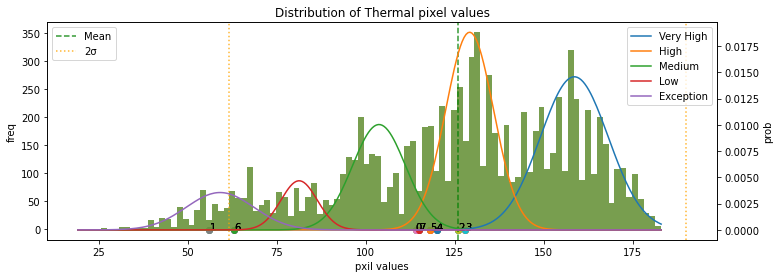

******* end *******
******* start *******
Module type1: Multi-Hotspots


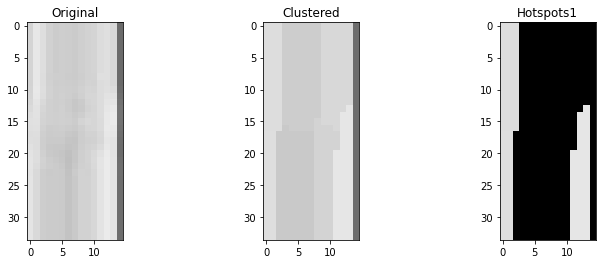

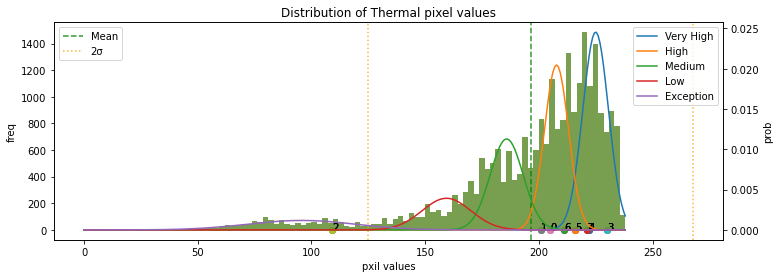

******* end *******
******* start *******
Module type1: Single-Hotspot


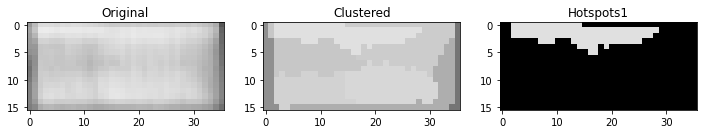

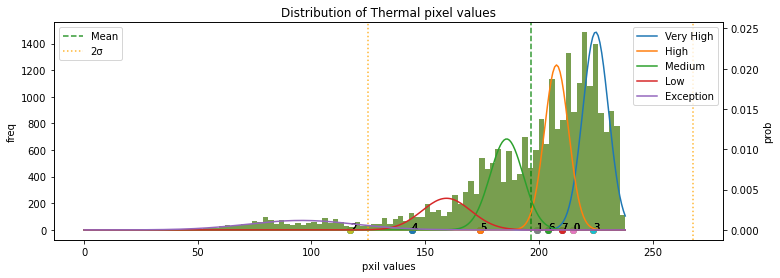

******* end *******
******* start *******
Module type1: Normal


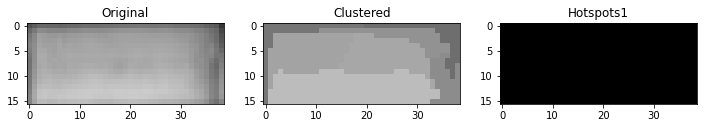

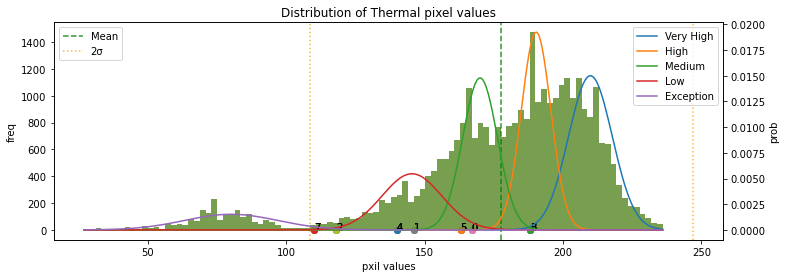

******* end *******
******* start *******
Module type1: Single-Hotspot


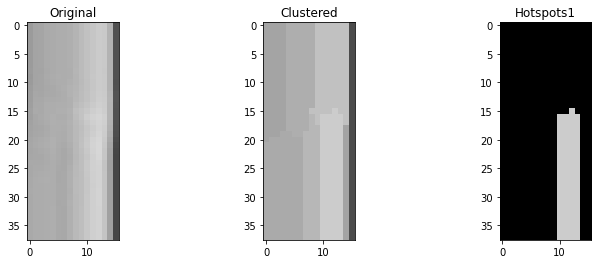

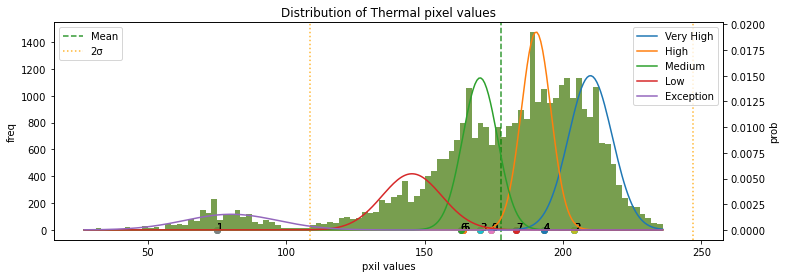

******* end *******
******* start *******
Module type1: Normal


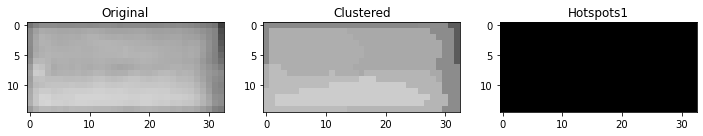

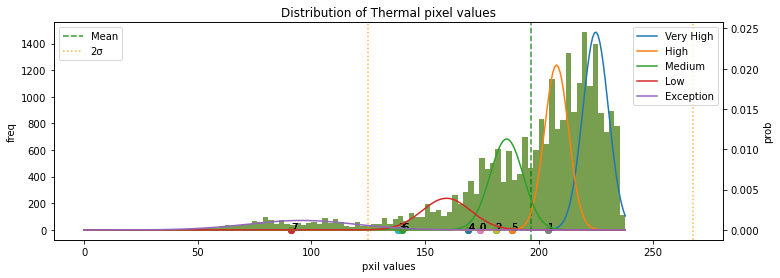

******* end *******
******* start *******
Module type1: Cluster-Anomaly


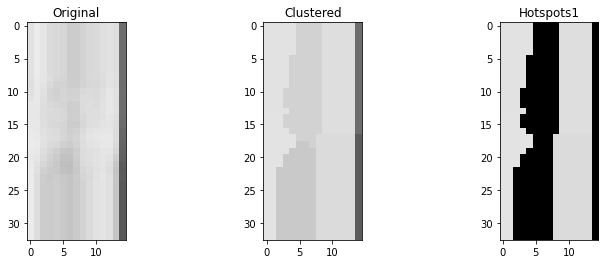

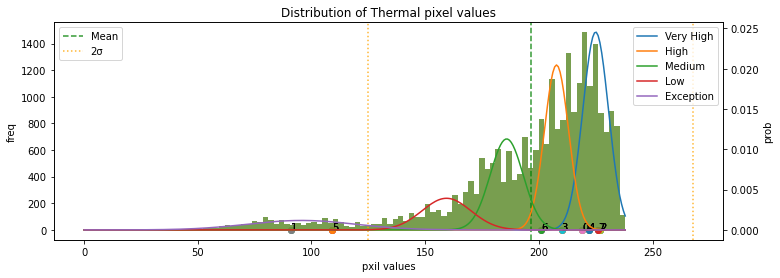

******* end *******
******* start *******
Module type1: Cluster-Anomaly


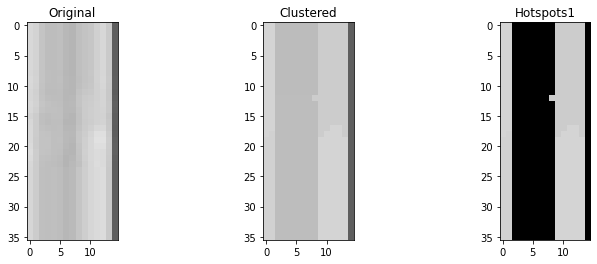

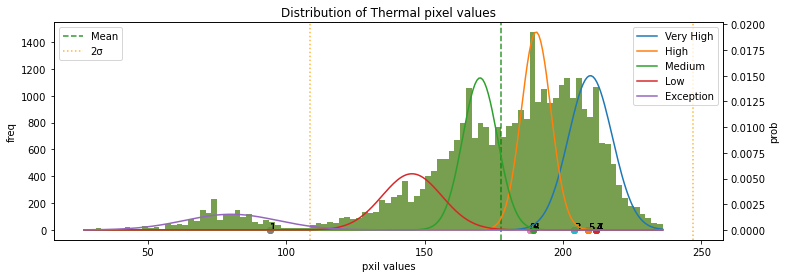

******* end *******
******* start *******
Module type1: Normal


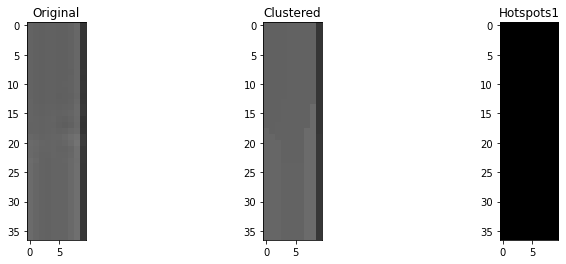

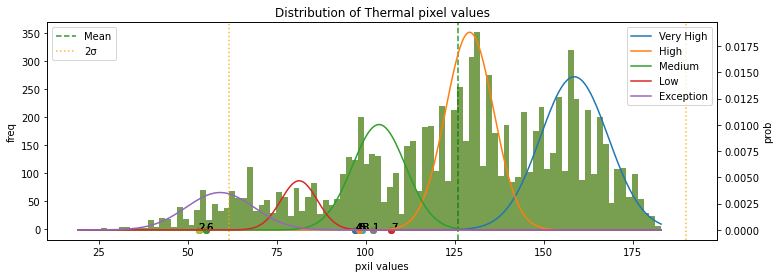

******* end *******
******* start *******
Module type1: Normal


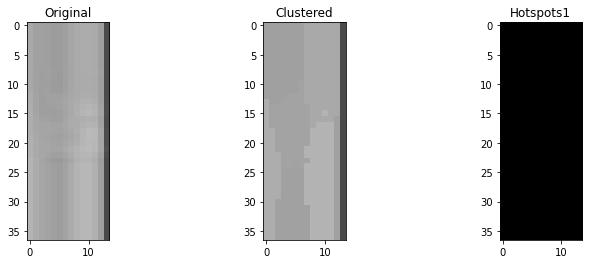

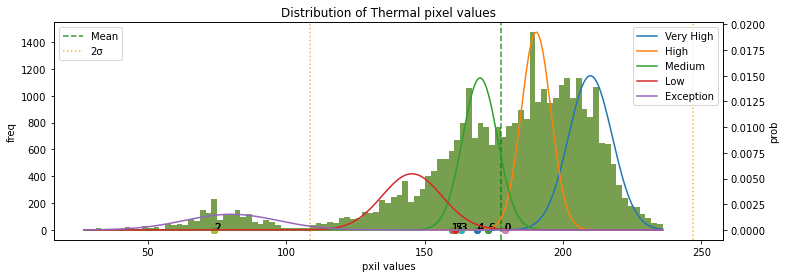

******* end *******
******* start *******
Module type1: Cluster-Anomaly


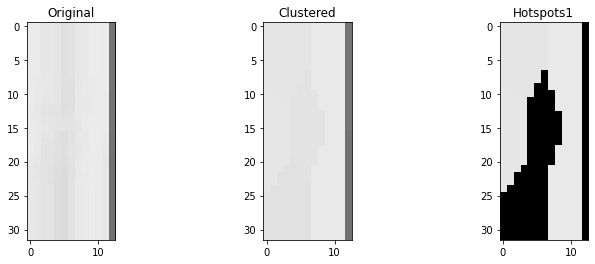

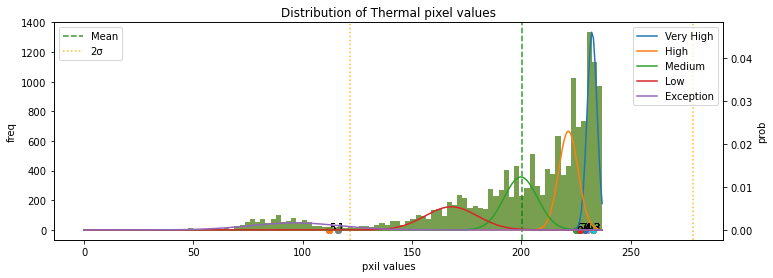

******* end *******
******* start *******
Module type1: Normal


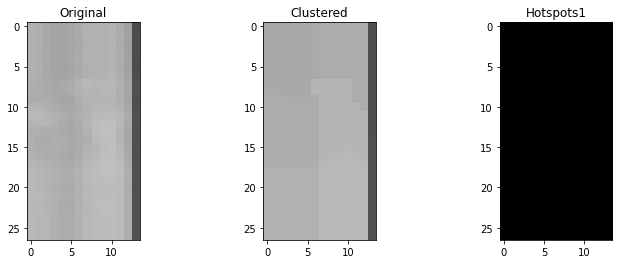

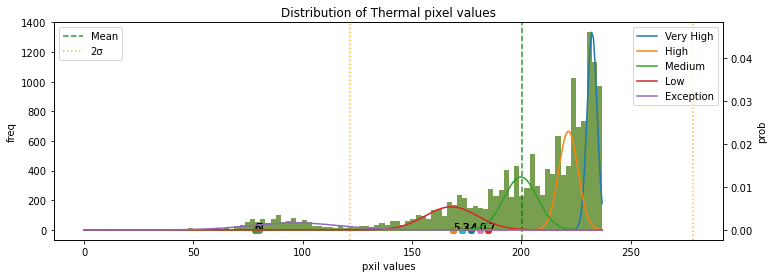

******* end *******


In [26]:
#for n, k in enumerate(list(thermal_img_files)[:10]):
for n, k in enumerate(list(thermal_img_files)):    
    print("******* start *******")
    # -- module label --
    l = module_labels[n]
    # -- cluster temperature ---
    clusters = clustering.TemperatureClusters(
        data[l].scaled_temperature_with_index[k], method=clustering_method)    
    clusters_temperature = clusters.get_clusters_data(data[l].temperature[k])
    centers_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in clusters_temperature])
    scaled_clusters_temperature = clusters.get_clusters_data(data[l].scaled_temperature[k])
    scaled_centers_temperature = np.stack([t.mean(axis=0) for t in scaled_clusters_temperature ])
    # -- anomaly detection --    
    module_type1, hot_pixels1, cluster_types1 = get_module_anomaly_type(
        centers_temperature, gmm[l], thermal_img_files[k])
    #module_type2, hot_pixels2, cluster_types2 = get_module_anomaly_type(
    #   scaled_centers_temperature, gmm2, thermal_img_files[k])
    # -- save anomaly modules --
    if module_type1 not in anomaly_modules:
        anomaly_modules[module_type1] = [k]
    else:
        anomaly_modules[module_type1].append(k)
    print("Module type1:", module_type1)
    #print("Module type2:", module_type2)
    # -- display -- 
    img_clustered = centers_temperature[clusters.labels] 
    img_clustered = img_clustered.reshape(thermal_img_files[k].shape)
    img_hotspots1 = img_clustered * hot_pixels1
#    img_hotspots2 = img_clustered * hot_pixels2    
    display.display_modules({
        "Original": thermal_img_files[k], 
        "Clustered": img_clustered,
        "Hotspots1": img_hotspots1,
#        "Hotspots2": img_hotspots2,        
    })
    display.display_distributions(
        data[l].all_temperature, 
        filepath = "./hist/hist_" + k,
        cluster_centers = centers_temperature,
        gmm = gmm[l]
    )
#    display.display_distributions(
#        data.scaled_all_temperature, 
#        filepath = "./hist/scaled_hist_" + k,
#        cluster_centers = scaled_centers_temperature,
#        gmm = gmm2
#    )
    print("******* end *******")

In [27]:
import json
tmp = open("anomaly_modules.json", "w")
json.dump(anomaly_modules, tmp, indent=4, sort_keys=True, separators=(',', ': '))
tmp.close()

In [28]:
# モジュール抽出

In [29]:
filters = Filters(thermal_npdat_path)

In [30]:
img_org = cv2.imread(input_img_path, 0)
img_filtered = filters.apply_all_filters(img_org)

In [31]:
# 異常モジュール可視化

In [32]:
with open('anomaly_modules.json', 'r') as f:
    anomaly_modules = json.load(f)

In [33]:
modules = Modules(img_filtered, anomaly_modules)

In [34]:
anomaly_contours = modules.get_anomaly_contours()

/Users/tnozawa/afterFIT/work/rule_based_anomaly_detection/module_extraction.py:58: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


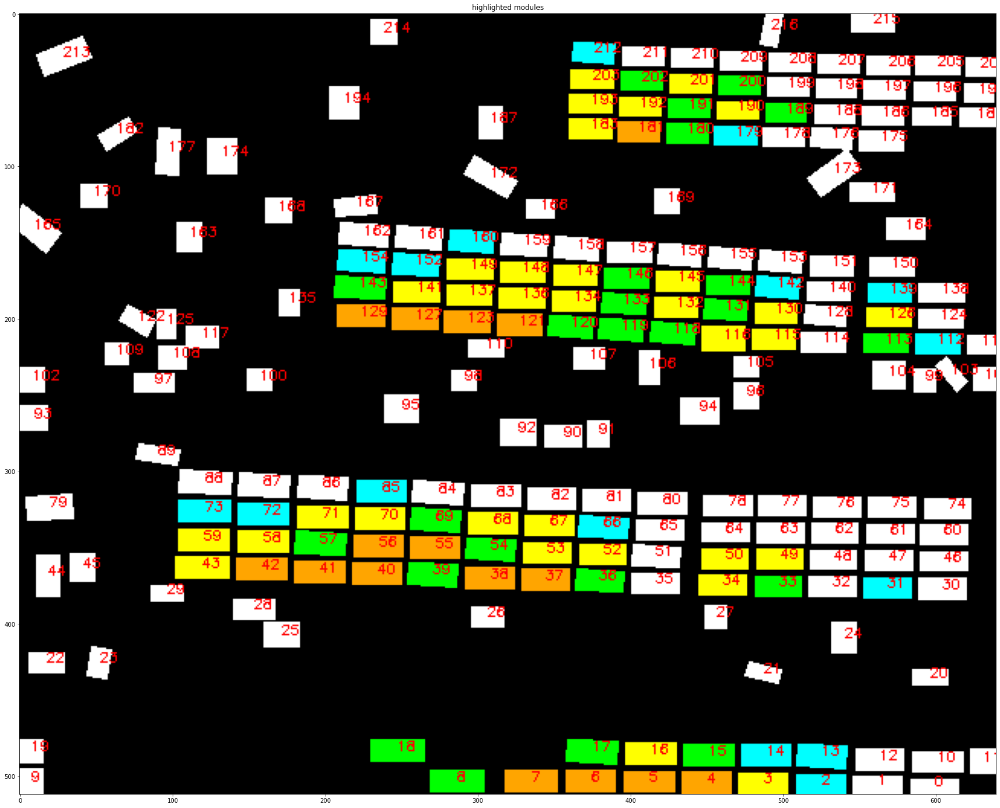

In [35]:
color_list = {
    "Single-Hotspot": (0,255,255), # aqua
    "Multi-Hotspots": (0,255,0), # green
    "Cluster-Anomaly": (255,255,0), # yellow
    "Module-Anomaly": (255,165,0), # orange
}
img_target_index = modules.get_img_contours(img_org, index=False)
for k, v in anomaly_contours.items():
    if k == "Normal":
        continue
    else:
        img_target_index = modules.get_img_target_contours(
            img_target_index, v, index=True, color=color_list[k])
module_extraction.show_img(
    {"highlighted modules":img_target_index}, cmap="gray", figsize=(30,30)
)

In [36]:
string_anomaly_labels = modules.get_string_anomaly_labels(anomaly_contours["Module-Anomaly"])

In [37]:
img_string_index = modules.get_img_target_contours(
    modules.get_img_contours(img_org, index=False),
    anomaly_contours["Module-Anomaly"][string_anomaly_labels>=0], 
    index=True, color=(238,130,238)) # violet

/Users/tnozawa/afterFIT/work/rule_based_anomaly_detection/module_extraction.py:58: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


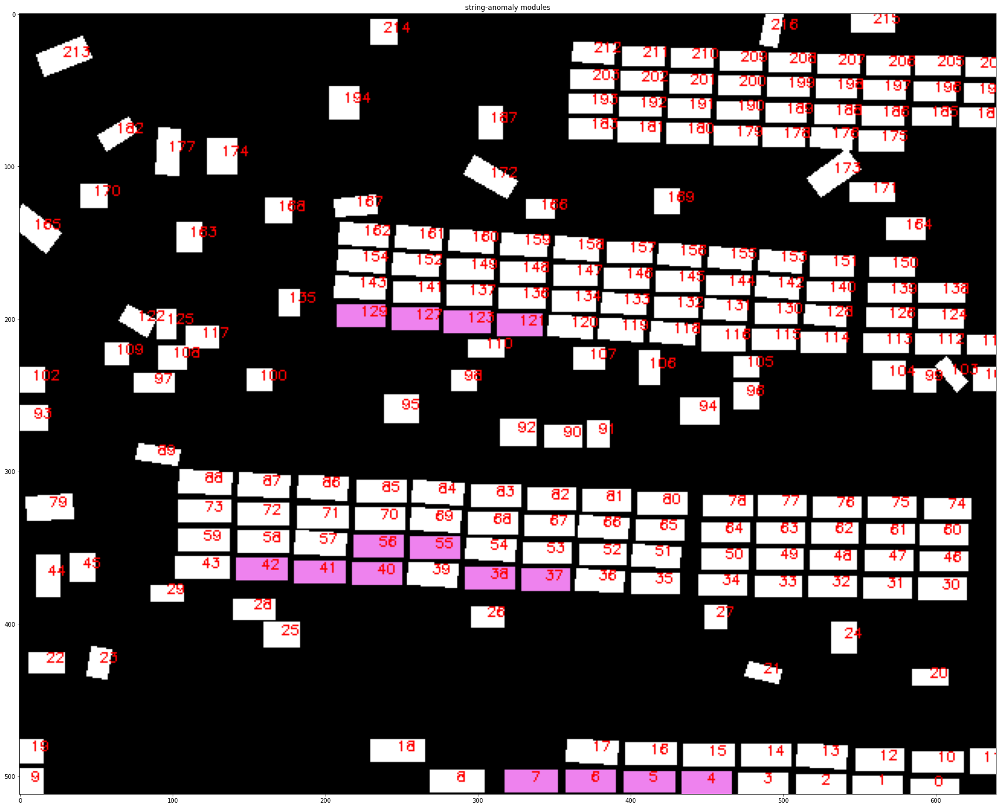

In [38]:
module_extraction.show_img({"string-anomaly modules":img_string_index},cmap="gray",figsize=(30,30))

In [39]:
#ToDo
## 異常部分へのマーキング（赤で囲む）
## 分類モデルの改良